In [1]:
from lensid.train_test import train_crossvalidate_test_XGB_qts , train_crossvalidate_test_XGB_sky, test_combined_ML_results
from sklearn.metrics import accuracy_score,f1_score,roc_auc_score,confusion_matrix,roc_curve
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import xgboost as xgb
import os
import joblib
from lensid.utils import ml_utils
#df_dir='../../data/dataframes/train/' ##alice
df_dir = '/home/srashti.goyal/strong-lensing-ml/data/dataframes/train/' ##CIT

2021-12-02 05:13:41.876142: W tensorflow/stream_executor/platform/default/dso_loader.cc:59] Could not load dynamic library 'libcudart.so.10.1'; dlerror: libcudart.so.10.1: cannot open shared object file: No such file or directory
2021-12-02 05:13:41.876196: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [2]:
def train_xgboost_dense_qts(
    df_train,
    from_df=1,
    model_id_dense=0,
    n_estimators=135,
    max_depth=6,
    scale_pos_weight=0.01,
    include_phenom=0,
    include_power = 0,
):
    """
    Train XGBoost Algorithm for the Qtransforms, which takes input as the
    three detector predictions of the trained DenseNet models, and optionally
    the hand derieved features from Qtransforms, for given set of event pairs.

    Parameters:
        df_train(pandas Dataframe): Dataframe containing the img_0, img_1,
            Lensing(labels), and the three Densenet predictions for the
            three detectors, eg: 'dense_H1_0' etc.. Optionally should have
            hand derieved features as columns.

        model_id_dense(int): Identifier for the DenseNet prediction columns
            in the Dataframe. Default: 0.

        n_estimators(int): hyperparameter of XGBoost, setting the maximum
            no. of trees. Default: 135.

        max_depth(int): hyperparameter of XGBoost, setting the maximum size
            of trees. Default: 6.

        scale_pos_weight(float): hyperparameter of XGBoost, setting the weight
            of the unbalanced dataset, eg. ratio of lensed to unlensed event
                rates. Default: 0.01.

        include_phenom(bool): include hand dereived features also while
            training. Default: 0.

    Returns:
        the trained XGBoost model
    """
    cols = [
        "dense_H1_" + str(model_id_dense),
        "dense_L1_" + str(model_id_dense),
        "dense_V1_" + str(model_id_dense),
    ]
    if include_phenom == 1:
        phenom_features = [
            "mean_overlap_qts_H1",
            "std_overlap_qts_H1",
            "lsq_overlap_qts_L1",
            "mean_overlap_qts_L1",
            "std_overlap_qts_L1",
            "lsq_overlap_qts_V1",
            "mean_overlap_qts_V1",
            "std_overlap_qts_V1",
            "lsq_overlap_qts_V1",
        ]
        cols = cols + phenom_features
        
    if include_power == 1:
        pow_cols = ["pow_h1_img_0", "pow_h1_img_1", "pow_l1_img_0",\
                    "pow_l1_img_1", "pow_v1_img_0", "pow_v1_img_1"]
        
        cols = cols + pow_cols
        
    if from_df == 1:
        xgb_qts_train, labels = np.c_[df_train[cols]], df_train.Lensing.values
    else:
        print("Dense predictions not in df")

    model = xgb.XGBClassifier(
        objective="binary:logistic",
        n_estimators=n_estimators,
        max_depth=max_depth,
        scale_pos_weight=scale_pos_weight,
    )
    model.fit(X=xgb_qts_train, y=labels)
    return model


def predict_xgboost_dense_qts(
    df,
    model,
    model_id_dense=0,
    model_id_xgb=0,
    from_df=1,
    fill_missing=1,
    include_phenom=0,
    include_power = 0,
):
    """
    Adds XGBoost Algorithm predictions for the Qtransforms, which takes input
    as the three detector predictions of the trained DenseNet models, and
    optionally the hand derieved features from Qtransforms, for given set of
    event pairs.

    Parameters:
        df(pandas Dataframe): Dataframe containing the img_0, img_1,
            Lensing(labels), and the three Densenet Predictions for the three
            detectors, eg: 'dense_H1_0' etc.. Optionally should have hand
            derieved features as columns.

        model_id_dense(int): Identifier for the DenseNet prediction columns
            in the Dataframe. Default: 0.

        model_id_xgb(int): Identifier for adding the XGBoost prediction column
            in the Dataframe. Default: 0.

        fill_missing(bool): In case of missing Qtransform images, or DenseNet
            predictions, return the product of the predictions for the
            available detector DenseNet predicitons, other return None.
            Default: 1

        include_phenom(bool): include hand dereived features also while
            training. Default: 0.

    Returns:
        pandas Dataframe: the input dataframe with additional column eg.
        'xgb_dense_QTS_0' , as the given XGBoost with Qtransforms predictions
        for the event pairs.
    """
    cols = [
        "dense_H1_" + str(model_id_dense),
        "dense_L1_" + str(model_id_dense),
        "dense_V1_" + str(model_id_dense),
    ]
    if include_phenom == 1:
        phenom_features = [
            "mean_overlap_qts_H1",
            "std_overlap_qts_H1",
            "lsq_overlap_qts_L1",
            "mean_overlap_qts_L1",
            "std_overlap_qts_L1",
            "lsq_overlap_qts_V1",
            "mean_overlap_qts_V1",
            "std_overlap_qts_V1",
            "lsq_overlap_qts_V1",
        ]
        cols = cols + phenom_features
        
    if include_power == 1:
        pow_cols = ["pow_h1_img_0", "pow_h1_img_1", "pow_l1_img_0",\
                    "pow_l1_img_1", "pow_v1_img_0", "pow_v1_img_1"]
        
        cols = cols + pow_cols
        
    if from_df == 1:
        x1, x2, x3 = df[cols[0]], df[cols[1]], df[cols[2]]
        missing_out = (x1.isna() | x2.isna() | x3.isna()).values
        missing_all = (x1.isna() & x2.isna() & x3.isna()).values

    else:
        print("Dense predictions not in df")
    input_matrix = np.c_[df[cols]]

    y_predict = model.predict_proba(input_matrix)[:, 1]
    if fill_missing == 1:
        y_predict[missing_out] = (
            x1[missing_out].fillna(1).values
            * x2[missing_out].fillna(1).values
            * x3[missing_out].fillna(1).values
        )
        y_predict[missing_all] = None

    else:
        y_predict[missing_out] = None
    df["xgb_dense_QTS_" + str(model_id_xgb)] = y_predict

    return df

In [3]:
def dict_df_powers_lensed(power_dict,lensed_df):
    
    power_df = pd.DataFrame()

    power_df['img_0']=power_dict['fnames'][:,0]
    power_df['img_1']=power_dict['fnames'][:,1]
    power_df['pow_h1_img_0'] = power_dict['pow_H1'][:,0]
    power_df['pow_h1_img_1'] = power_dict['pow_H1'][:,1]
    power_df['pow_l1_img_0'] = power_dict['pow_L1'][:,0]
    power_df['pow_l1_img_1'] = power_dict['pow_L1'][:,1]
    power_df['pow_v1_img_0'] = power_dict['pow_V1'][:,0]
    power_df['pow_v1_img_1'] = power_dict['pow_V1'][:,1]
    lensed_df_power = pd.merge(lensed_df,power_df, on = ['img_0','img_1'])
    
    return lensed_df_power

In [4]:
def dict_df_powers_unlensed(power_dict,unlensed_df):
    
    power_df = pd.DataFrame()

    power_df['fname']=power_dict['fnames']
    power_df['pow_h1'] = power_dict['pow_H1']
    power_df['pow_l1'] = power_dict['pow_L1']
    power_df['pow_v1'] = power_dict['pow_V1']
    power_df = power_df.set_index('fname')
    for col in ['pow_h1', 'pow_l1', 'pow_v1']:
        try:
            unlensed_df[col + '_img_0'] = power_df.iloc[unlensed_df['img_0']][col].values
            unlensed_df[col + '_img_1'] = power_df.iloc[unlensed_df['img_1']][col].values
        except:
            unlensed_df[col + '_img_0'] = power_df.loc[unlensed_df['img_0']][col].values
            unlensed_df[col + '_img_1'] = power_df.loc[unlensed_df['img_1']][col].values
    return unlensed_df

In [5]:
qt_lensed_power_train=dict(np.load('/home/srashti.goyal/lensid_runs/ML_1p0_AnalyticalPsd/data/qts/train/qt_power_lensed.npz'))
qt_unlensed_power_train=dict(np.load('/home/srashti.goyal/lensid_runs/ML_1p0_AnalyticalPsd/data/qts/train/qt_power_unlensed.npz'))
qt_lensed_power_test=dict(np.load('/home/srashti.goyal/lensid_runs/ML_1p0_AnalyticalPsd/data/qts/test/qt_power_lensed.npz'))
qt_unlensed_power_test=dict(np.load('/home/srashti.goyal/lensid_runs/ML_1p0_AnalyticalPsd/data/qts/test/qt_power_unlensed.npz'))


In [6]:
def train_test_xgbqts(base_out_dir,df_dir_train_features_in, df_dir_test_features_in, tag_qts,train_size_lensed_xgbqts, cv_size_lensed_xgbqts, scale_pos_weight_xgbqts, max_depth_xgbqts, n_estimators_xgbqts, cv_splits, compare_to_blu, path_to_blu,include_phenom,include_power):
    df_lensed_qts = pd.read_csv(df_dir_train_features_in+'lensed_QTs'+tag_qts+'.csv',index_col=[0] )[:train_size_lensed_xgbqts]

    df_unlensed_qts_half = pd.read_csv(df_dir_train_features_in+'unlensed_half_QTs'+tag_qts+'.csv' ,index_col=[0])
    df_unlensed_qts_half = df_unlensed_qts_half.sample(frac = 1,random_state = 42).reset_index(drop = True)
    df_lensed_qts_power = dict_df_powers_lensed(qt_lensed_power_train, df_lensed_qts)
    df_unlensed_qts_half_power = dict_df_powers_unlensed(qt_unlensed_power_train,df_unlensed_qts_half)
    df_train_qts = pd.concat([df_lensed_qts_power,df_unlensed_qts_half_power],ignore_index = True)
    df_train_qts=df_train_qts.sample(frac = 1).reset_index(drop = True)
    xgboost_dense_qts_model=train_xgboost_dense_qts(df_train_qts,from_df=True,scale_pos_weight=scale_pos_weight_xgbqts, n_estimators=n_estimators_xgbqts, max_depth=max_depth_xgbqts, include_phenom=include_phenom,include_power=include_power)
    if not os.path.exists(base_out_dir):
        os.makedirs(base_out_dir)
    joblib_file = base_out_dir+'/XGBQT_0'+tag_qts+'.pkl'  
    joblib.dump(xgboost_dense_qts_model, joblib_file)
    
    df_lensed_qts = pd.read_csv(df_dir_train_features_in+'lensed_QTs'+tag_qts+'.csv',index_col=[0] )[2400:]
    df_unlensed_qts_half = pd.read_csv(df_dir_train_features_in+'unlensed_second_half_QTs'+tag_qts+'.csv' ,index_col=[0])
    df_unlensed_qts_half = df_unlensed_qts_half.sample(frac = 1,random_state = 42).reset_index(drop = True)
    df_lensed_qts_power = dict_df_powers_lensed(qt_lensed_power_train, df_lensed_qts)
    df_unlensed_qts_half_power = dict_df_powers_unlensed(qt_unlensed_power_train,df_unlensed_qts_half)
    
    df_val_qts = pd.concat([df_lensed_qts_power,df_unlensed_qts_half_power],ignore_index = True)
    df_val_qts=df_val_qts.sample(frac = 1).reset_index(drop = True)
    df_val_qts=predict_xgboost_dense_qts(df_val_qts,xgboost_dense_qts_model,include_phenom=include_phenom,include_power=include_power)
    plt.figure(1)
    fig=ml_utils.plot_ROCs(df_val_qts,logy=False,cols=['dense_H1_0', 'dense_L1_0', 'dense_V1_0','xgb_dense_QTS_0'])
    plt.show()
    df_lensed_qts = pd.read_csv(df_dir_test_features_in+'lensed_QTs'+tag_qts+'.csv',index_col=[0] )
    df_unlensed_qts = pd.read_csv(df_dir_test_features_in+'unlensed_QTs'+tag_qts+'.csv' ,index_col=[0])
    
    df_test_blu_lensed = pd.read_csv(blu_lensed,index_col=[0] )
    df_test_blu_unlensed = pd.read_csv(blu_unlensed,index_col=[0] )
    cols=['m1, m2, ra, sin_dec, a1, a2, costilt1, costilt2, costheta_jn',
           'm1, m2, ra, sin_dec, costheta_jn', 'ra, sin_dec',
           '# m1, m2, ra, sin_dec, a1, a2, costilt1, costilt2',
           'm1, m2, ra, sin_dec', 'm1, m2']
    df_lensed_qts=df_lensed_qts.join(df_test_blu_lensed[cols])
    df_unlensed_qts=df_unlensed_qts.join(df_test_blu_unlensed[cols])
    
    df_lensed_qts_power = dict_df_powers_lensed(qt_lensed_power_test, df_lensed_qts)
    df_unlensed_qts_power = dict_df_powers_unlensed(qt_unlensed_power_test,df_unlensed_qts)
    
    df_test_qts = pd.concat([df_lensed_qts_power,df_unlensed_qts_power],ignore_index = True)
    df_test_qts=df_test_qts.sample(frac = 1).reset_index(drop = True)
    xgboost_dense_qts_model = joblib.load(base_out_dir+'/XGBQT_0'+tag_qts+'.pkl')
    df_test_qts=predict_xgboost_dense_qts(df_test_qts,xgboost_dense_qts_model,include_phenom=include_phenom,include_power=include_power)


    df_test_qts=df_test_qts.dropna()
    plt.figure(2)
    fig2=ml_utils.plot_ROCs(df_test_qts,cols=['dense_H1_0' ,'dense_L1_0','dense_V1_0','xgb_dense_QTS_0','m1, m2']\
                     ,labels=['ML H1 QTs', 'ML L1 QTs', 'ML V1 QTs','ML combined H1 L1 V1 QTS', '$B^L_U:$ $m_1 m_2$'],logy=False)
    plt.show()
    df_test=df_test_qts
    ml_stat='xgb_dense_QTS_0'
    blu_stat= 'm1, m2'
    plt.figure(figsize=(20,5))
    plt.subplot(131)
    plt.xlabel('ML statistic')
    bins=np.linspace(-6,0,30)
    #plt.ylim(-100,1e3)
    df=df_test[df_test['Lensing'] == 0]
    plt.hist(np.log10(df[ml_stat]),bins=bins,label='Unlensed', histtype='step',density=True)
    df=df_test[df_test['Lensing'] == 1]
    plt.hist(np.log10(df[ml_stat]),bins=bins,label='Lensed', histtype='step',density=True)
    plt.legend()
    #plt.ylim(0,300)
    plt.subplot(132)
    plt.xlabel('BLU statistic')
    bins=np.linspace(-6,6,30)
    #plt.ylim(-100,1e3)
    df=df_test[df_test['Lensing'] == 0]
    plt.hist(np.log10(df[blu_stat]),bins=bins,label='Unlensed', histtype='step',density=True)
    df=df_test[df_test['Lensing'] == 1]
    plt.hist(np.log10(df[blu_stat]),bins=bins,label='Lensed', histtype='step',density=True)
    plt.legend()
    #plt.ylim(0,300)
    plt.subplot(133)

    plt.xlabel('ML statistic')
    plt.ylabel('BLU statistic')
    #plt.ylim(-100,1e3)
    df=df_test[df_test['Lensing'] == 0]
    plt.loglog(df[ml_stat],df[blu_stat],'x',label='Unlensed')
    df=df_test[df_test['Lensing'] == 1]
    plt.loglog(df[ml_stat],df[blu_stat],'+',label='Lensed')
    plt.legend()
    plt.show()

    
    plt.figure()
    plt.xlabel('ML statistic')
    plt.ylabel('BLU statistic')
    df=df_test[df_test['Lensing'] == 1]
    plt.plot(df[ml_stat],np.log(df[blu_stat]),'+',label='Lensed')
    #plt.ylim(0,500)
    #plt.xlim(1e-2, 1)
    plt.legend()
    plt.grid()
    plt.show()
    
    ml_stat='xgb_dense_QTS_0'
    blu_stat= 'm1, m2'
    df_test[ml_stat+'_fpp']=ml_utils.get_fars(df_test,ml_stat,df_test,ml_stat)
    df_test[blu_stat+'_fpp']=ml_utils.get_fars(df_test,blu_stat,df_test,blu_stat)

    plt.figure(figsize=(15,7))
    plt.subplot(121)
    bins=np.linspace(-5,0,30)
    #plt.ylim(-100,1e3)
    df=df_test[df_test['Lensing'] == 0]
    plt.hist(np.log10(df[ml_stat+'_fpp']),bins=bins,label='ML Unlensed', histtype='step',density=True,color='C0',lw=4)
    plt.hist(np.log10(df[blu_stat+'_fpp']),bins=bins,label='BLU Unlensed', histtype='step',density=True,color='C0',lw=2)

    df=df_test[df_test['Lensing'] == 1]
    plt.hist(np.log10(df[ml_stat+'_fpp']),bins=bins,label='ML Lensed', histtype='step',density=True,color='C1',lw=4)
    plt.hist(np.log10(df[blu_stat+'_fpp']),bins=bins,label='BLU Lensed', histtype='step',density=True,color='C1',lw=2)

    plt.legend()
    plt.xlabel('FPP(log10)')
    plt.ylabel('PDF')
    plt.grid()

    plt.subplot(122)
    df=df_test[df_test['Lensing'] == 0]
    plt.loglog(df[ml_stat+'_fpp'],df[blu_stat+'_fpp'],'+',label='Unlensed',color='C0')
    df=df_test[df_test['Lensing'] == 1]
    plt.loglog(df[ml_stat+'_fpp'],df[blu_stat+'_fpp'],'x',label='Lensed',color='C1')
    plt.loglog(10**bins,10**bins,'k--')
    plt.legend()
    plt.xlabel('ML')
    plt.ylabel('BLU')
    plt.grid()
    plt.xlim(1e-5,1)
    plt.ylim(1e-5,1)
    plt.suptitle('ML QTs and BLU masses')
    plt.show()
    
    cols=['dense_H1_0' ,'dense_L1_0','dense_V1_0','xgb_dense_QTS_0']
    df_test_scores={}
    df_val_scores={}
    for col in cols:
        df_test_scores[col+'_roc']=roc_auc_score( df_test.Lensing.values,df_test[col].values)
        df_test_scores[col+'_acc'] = accuracy_score(df_test.Lensing.values,np.round(df_test[col].values))
        df_test_scores[col+'_f1'] = f1_score(df_test.Lensing.values,np.round(df_test[col].values))
        df_val_scores[col+'_roc']=roc_auc_score( df_val_qts.Lensing.values,df_val_qts[col].values)
        df_val_scores[col+'_acc'] = accuracy_score(df_val_qts.Lensing.values,np.round(df_val_qts[col].values))
        df_val_scores[col+'_f1'] = f1_score(df_val_qts.Lensing.values,np.round(df_val_qts[col].values))
        
        
    return df_test_scores,df_val_scores

In [7]:
df_dir_train_features_in = '/home/srashti.goyal/lensid_runs/ML_1p0_AnalyticalPsd/dataframes/train/'
df_dir_test_features_in = '/home/srashti.goyal/lensid_runs/ML_1p0_AnalyticalPsd/dataframes/test/'
path_to_blu = '/home/srashti.goyal/strong-lensing-ml/data/dataframes/haris_et_al/'
train_size_lensed_xgbqts = 2400
cv_size_lensed_xgbqts = 2400
cv_splits = 10
scale_pos_weight_xgbqts = 0.01
max_depth_xgbqts = 6
n_estimators_xgbqts = 135
tag_qts = ''#_kaggle
base_out_dir = 'optimise_xgb_qts'
compare_to_blu = 1
include_phenom = 1
include_power = 1


#blu_lensed = '../../data/dataframes/haris_et_al/Lensed_PE_blus.csv'
#blu_unlensed = '../../data/dataframes/haris_et_al/Unlensed_PE_blus.csv'

blu_lensed = '/home/srashti.goyal/strong-lensing-ml/data/dataframes/haris_et_al/Lensed_PE_blus.csv'
blu_unlensed = '/home/srashti.goyal/strong-lensing-ml/data/dataframes/haris_et_al/Unlensed_PE_blus.csv'





dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9579


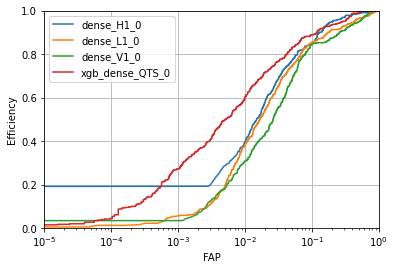

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8922
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

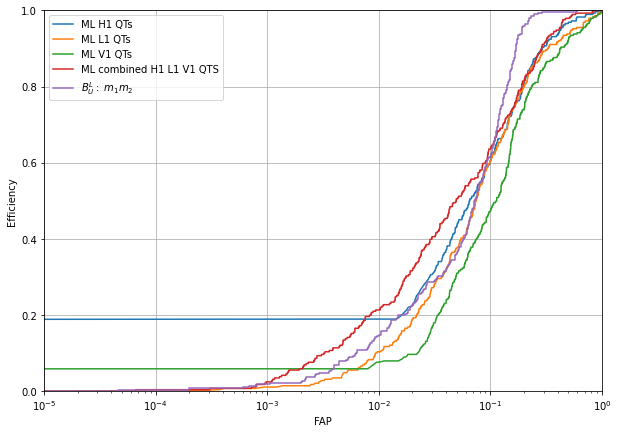

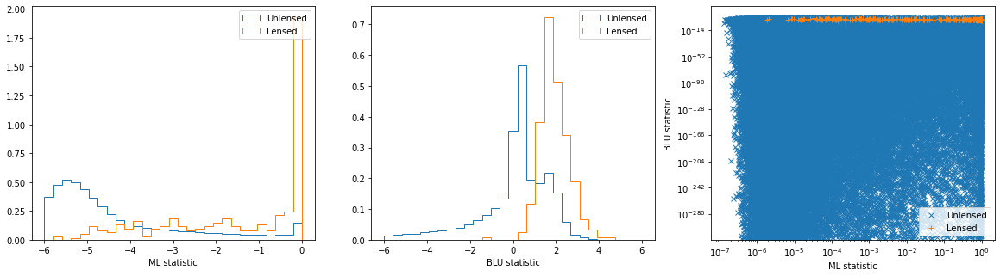

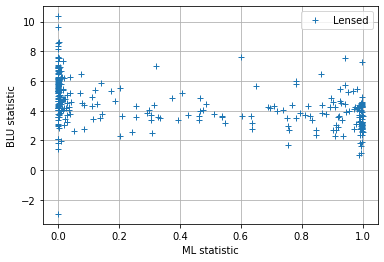

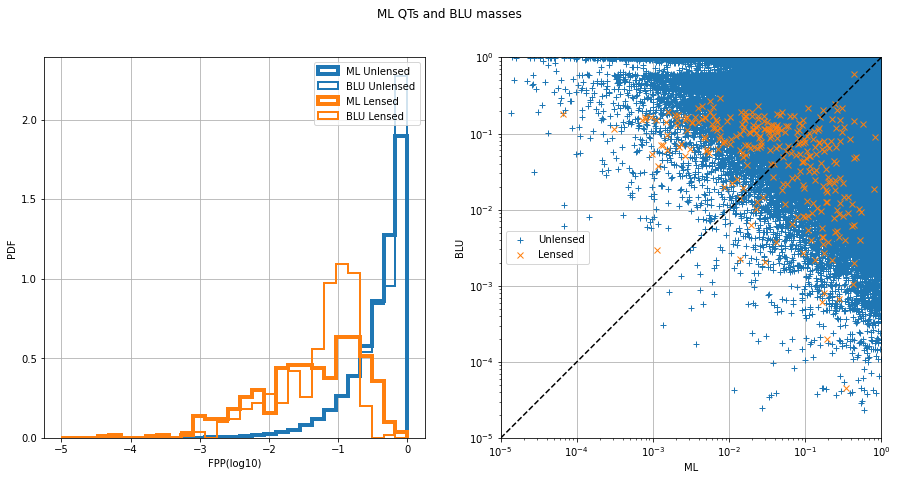

In [8]:
df_test_scores,df_val_scores=train_test_xgbqts(base_out_dir,df_dir_train_features_in, df_dir_test_features_in, tag_qts,train_size_lensed_xgbqts, cv_size_lensed_xgbqts, scale_pos_weight_xgbqts, max_depth_xgbqts, n_estimators_xgbqts, cv_splits, compare_to_blu, path_to_blu,include_phenom,include_power)

In [9]:
df_test_scores

{'dense_H1_0_roc': 0.8788707900436512,
 'dense_H1_0_acc': 0.7376978330898978,
 'dense_H1_0_f1': 0.0038903410127043947,
 'dense_L1_0_roc': 0.8621467094908822,
 'dense_L1_0_acc': 0.7128433942255747,
 'dense_L1_0_f1': 0.0035686514107976003,
 'dense_V1_0_roc': 0.8295504466609562,
 'dense_V1_0_acc': 0.7279997598991577,
 'dense_V1_0_f1': 0.003533076782114715,
 'xgb_dense_QTS_0_roc': 0.8922330759613573,
 'xgb_dense_QTS_0_acc': 0.9659016787050562,
 'xgb_dense_QTS_0_f1': 0.014115469165798911}

In [10]:
df_val_scores

{'dense_H1_0_roc': 0.9498078257646208,
 'dense_H1_0_acc': 0.852677751056639,
 'dense_H1_0_f1': 0.039285156046475284,
 'dense_L1_0_roc': 0.9275606193936453,
 'dense_L1_0_acc': 0.8409328784525532,
 'dense_L1_0_f1': 0.035369930713697366,
 'dense_V1_0_roc': 0.9159584484479788,
 'dense_V1_0_acc': 0.8540120325021372,
 'dense_V1_0_f1': 0.03699799725940761,
 'xgb_dense_QTS_0_roc': 0.9579123909937368,
 'xgb_dense_QTS_0_acc': 0.9940796254424301,
 'xgb_dense_QTS_0_f1': 0.3425022182786158}

In [11]:
include_power = 0

dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9615


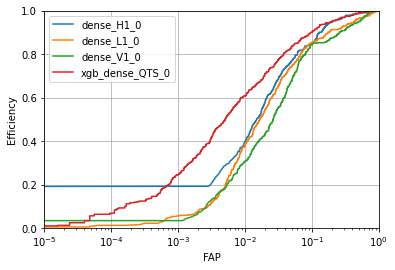

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8993
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

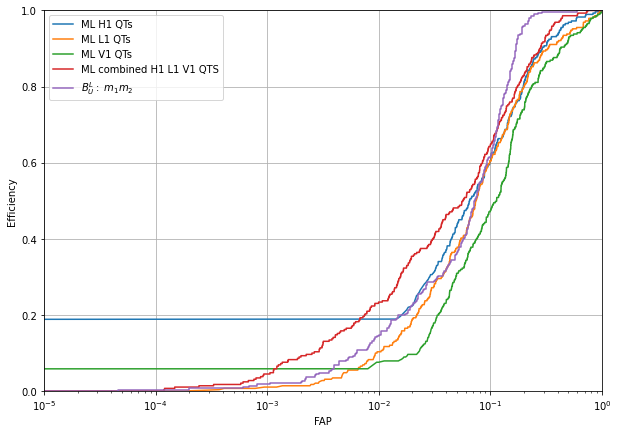

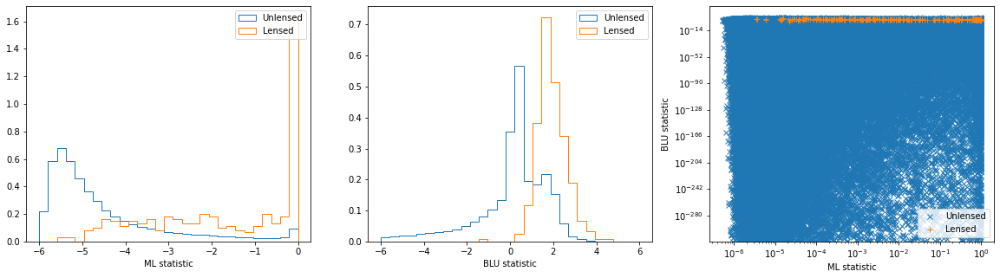

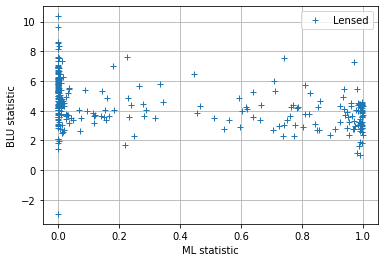

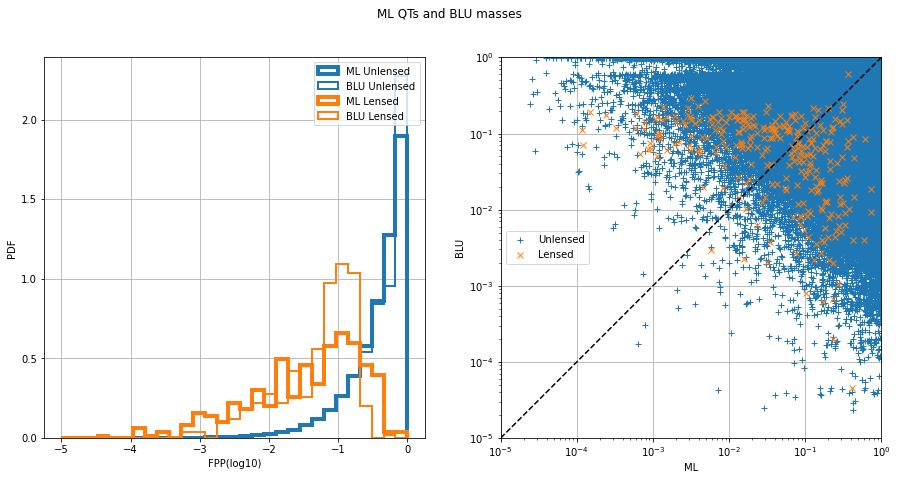

In [12]:
df_test_scores,df_val_scores=train_test_xgbqts(base_out_dir,df_dir_train_features_in, df_dir_test_features_in, tag_qts,train_size_lensed_xgbqts, cv_size_lensed_xgbqts, scale_pos_weight_xgbqts, max_depth_xgbqts, n_estimators_xgbqts, cv_splits, compare_to_blu, path_to_blu,include_phenom,include_power)

In [13]:
df_test_scores.keys()

dict_keys(['dense_H1_0_roc', 'dense_H1_0_acc', 'dense_H1_0_f1', 'dense_L1_0_roc', 'dense_L1_0_acc', 'dense_L1_0_f1', 'dense_V1_0_roc', 'dense_V1_0_acc', 'dense_V1_0_f1', 'xgb_dense_QTS_0_roc', 'xgb_dense_QTS_0_acc', 'xgb_dense_QTS_0_f1'])

dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9593


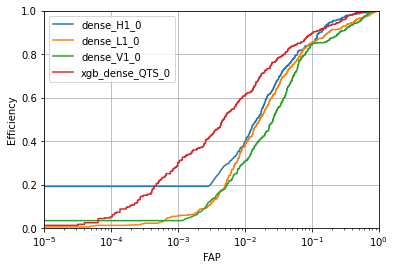

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8946
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

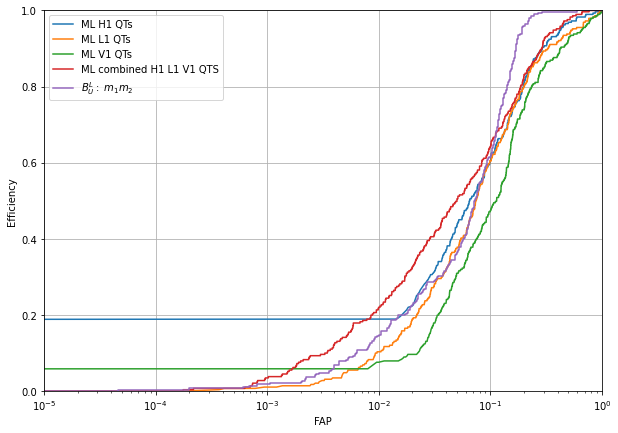

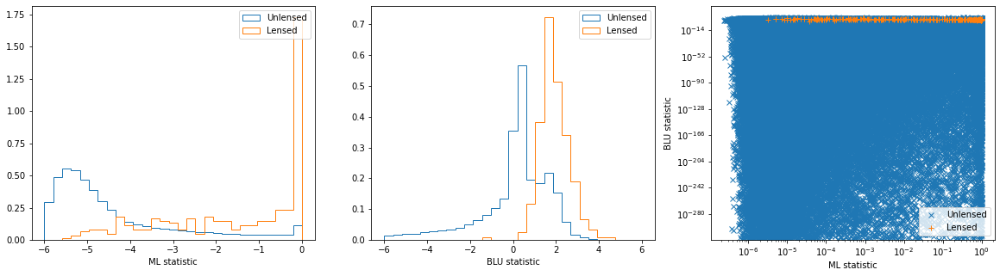

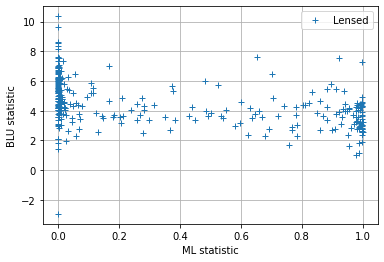

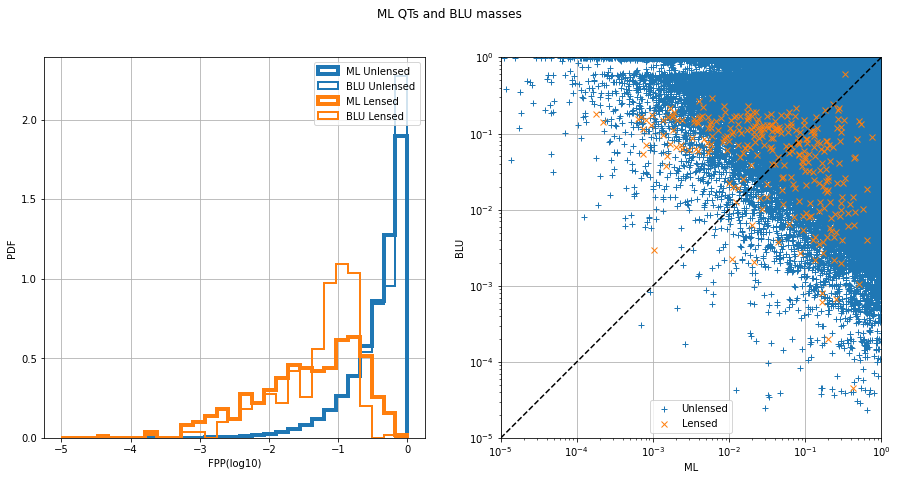

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 4, 'n_estimators_xgbqts': 105, 'test_xgb_dense_QTS_0_roc': 0.8946078678739877, 'val_xgb_dense_QTS_0_roc': 0.9593275043860889, 'test_xgb_dense_QTS_0_acc': 0.9731767342283759, 'val_xgb_dense_QTS_0_acc': 0.9950463802622223, 'test_xgb_dense_QTS_0_f1': 0.016434336023477623, 'val_xgb_dense_QTS_0_f1': 0.3595041322314049}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9592


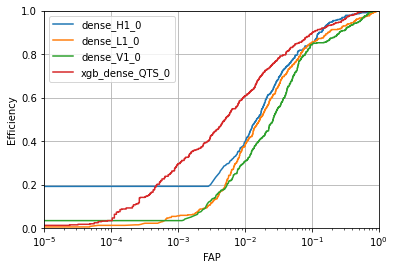

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8936
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

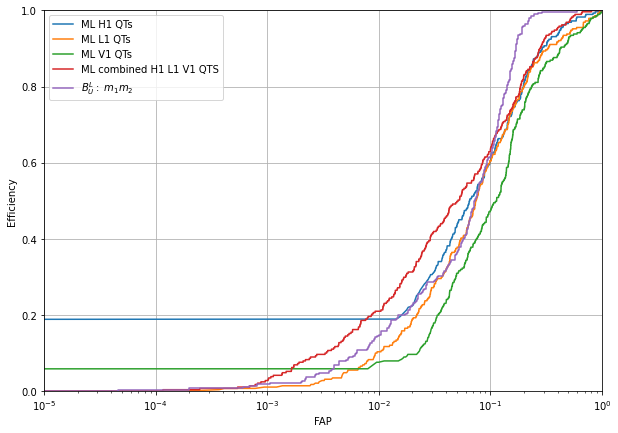

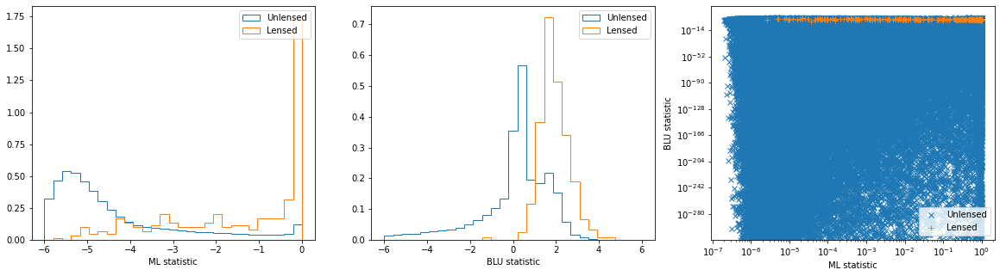

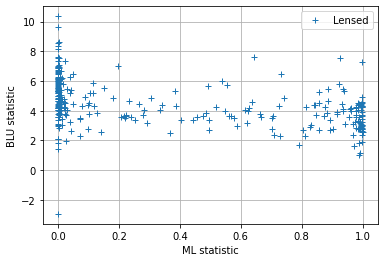

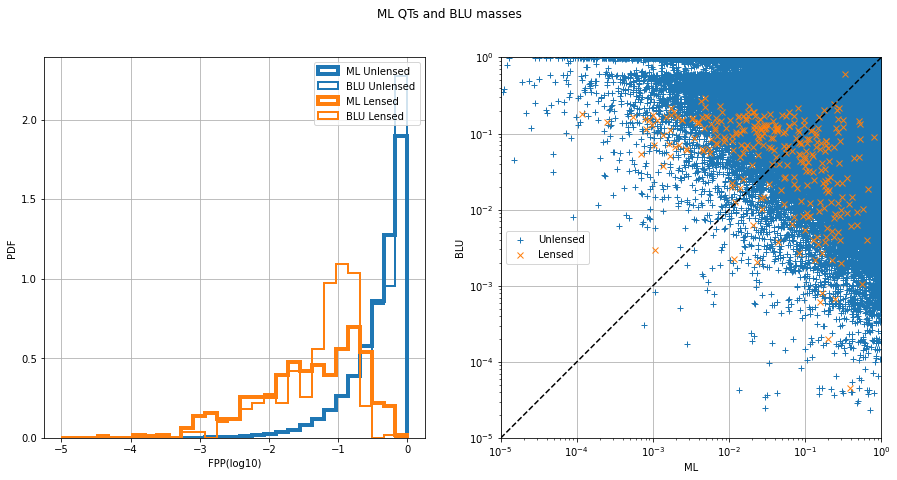

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 4, 'n_estimators_xgbqts': 120, 'test_xgb_dense_QTS_0_roc': 0.8936353022979886, 'val_xgb_dense_QTS_0_roc': 0.9591754904041492, 'test_xgb_dense_QTS_0_acc': 0.9709998199243682, 'val_xgb_dense_QTS_0_acc': 0.9947188021827885, 'test_xgb_dense_QTS_0_f1': 0.015620755229557186, 'val_xgb_dense_QTS_0_f1': 0.35259549461312434}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9589


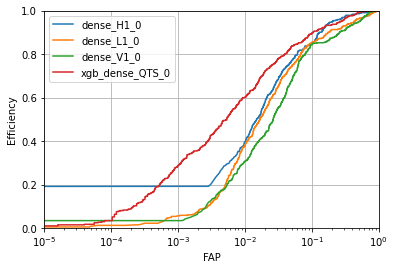

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8939
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

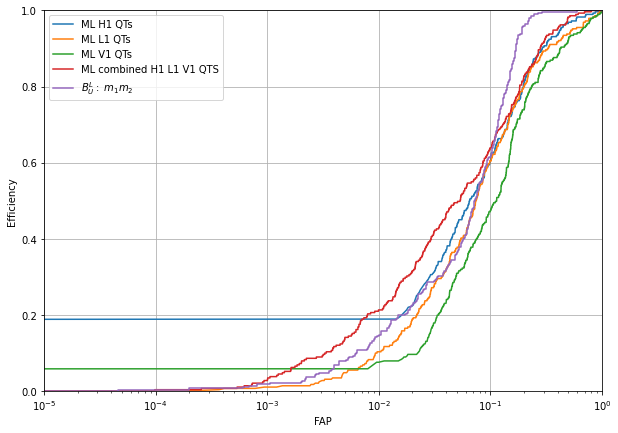

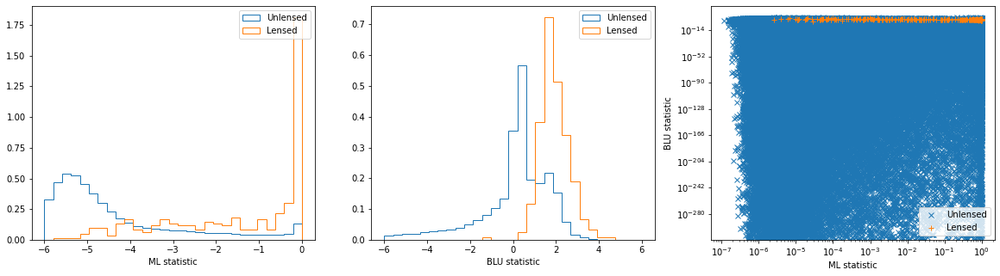

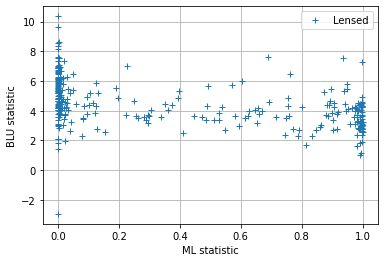

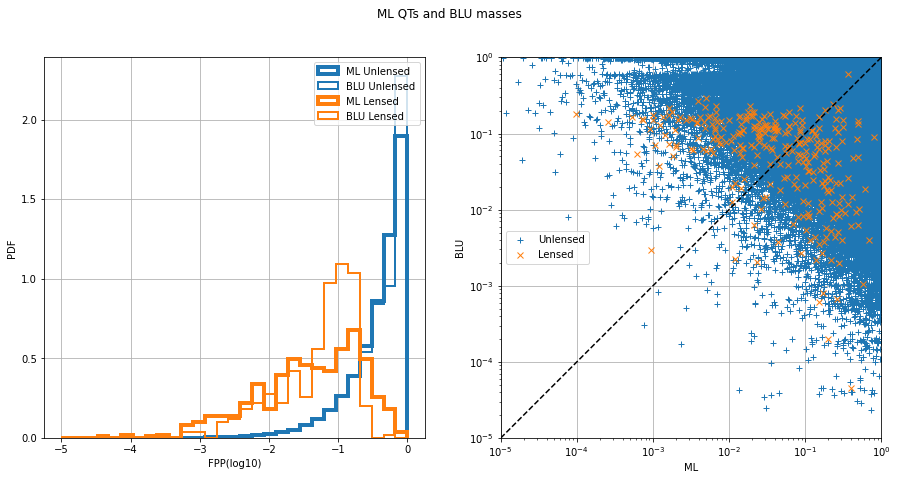

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 4, 'n_estimators_xgbqts': 135, 'test_xgb_dense_QTS_0_roc': 0.8938749238420747, 'val_xgb_dense_QTS_0_roc': 0.9588863175119718, 'test_xgb_dense_QTS_0_acc': 0.9691430400768323, 'val_xgb_dense_QTS_0_acc': 0.9944311726496273, 'test_xgb_dense_QTS_0_f1': 0.015197956577266922, 'val_xgb_dense_QTS_0_f1': 0.34920634920634924}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9587


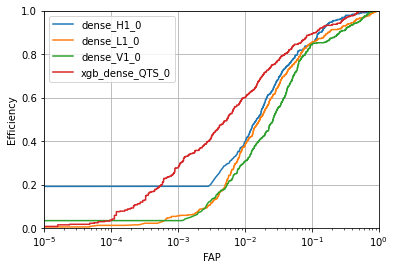

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8931
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

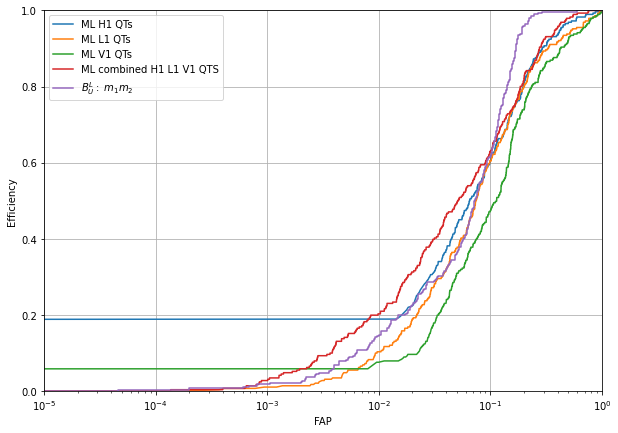

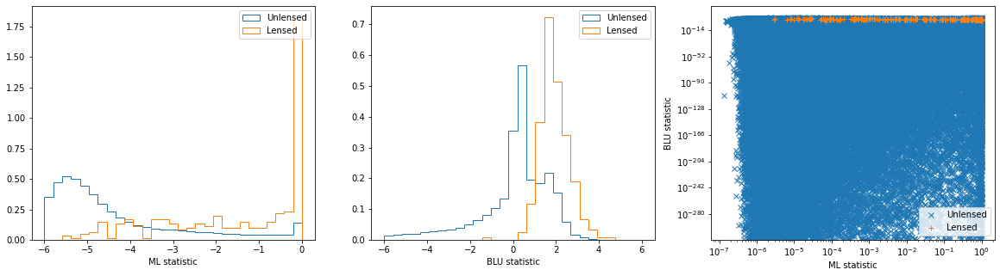

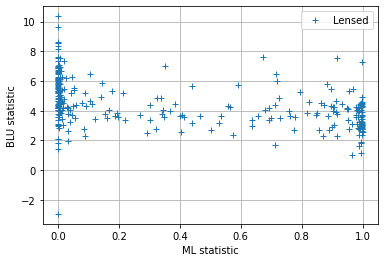

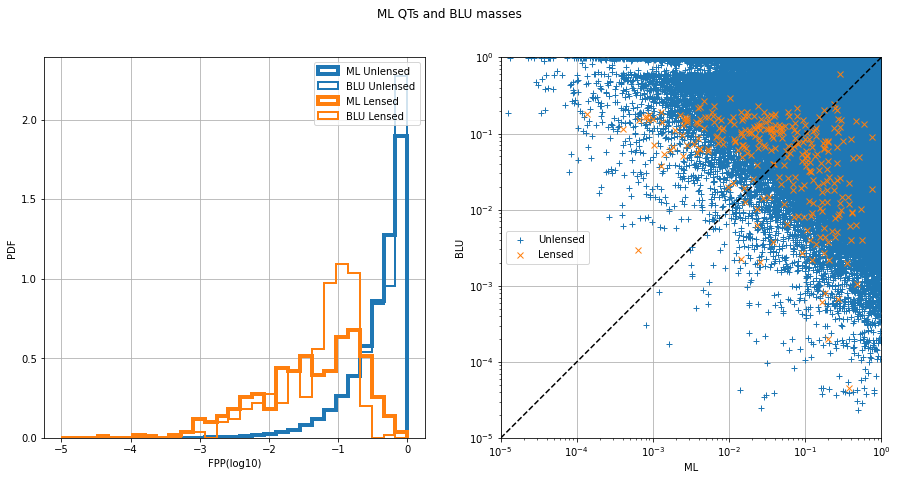

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 4, 'n_estimators_xgbqts': 150, 'test_xgb_dense_QTS_0_roc': 0.8931314985175284, 'val_xgb_dense_QTS_0_roc': 0.9586938339175355, 'test_xgb_dense_QTS_0_acc': 0.9681686308249465, 'val_xgb_dense_QTS_0_acc': 0.9941515328257204, 'test_xgb_dense_QTS_0_f1': 0.014495446942947408, 'val_xgb_dense_QTS_0_f1': 0.341726618705036}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9587


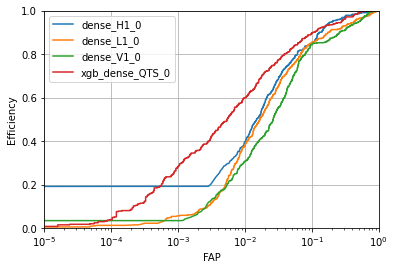

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8934
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

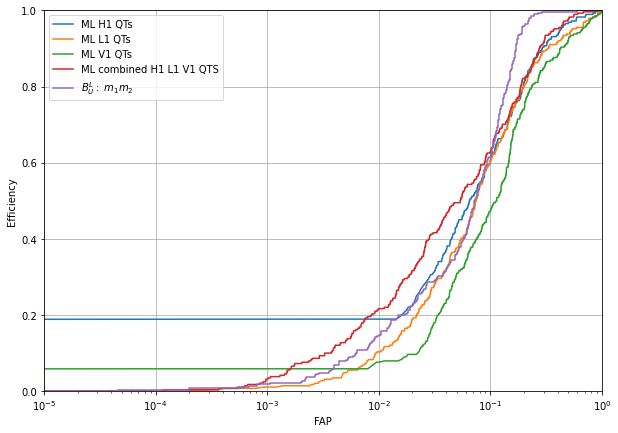

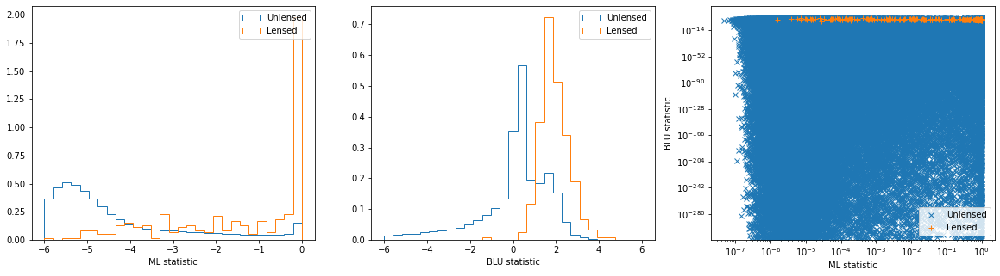

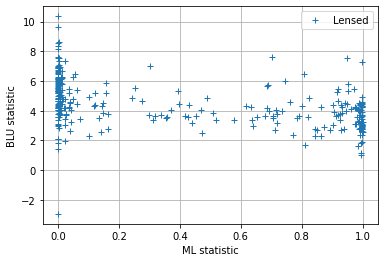

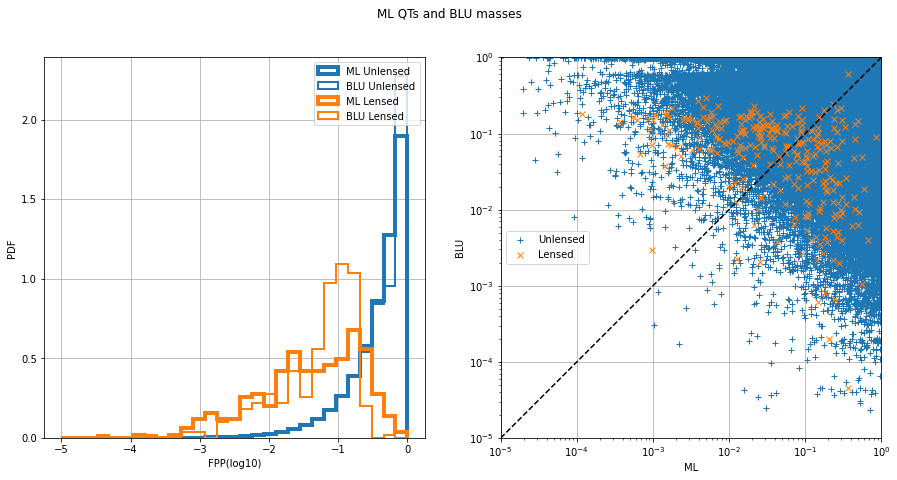

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 4, 'n_estimators_xgbqts': 165, 'test_xgb_dense_QTS_0_roc': 0.8933545880326038, 'val_xgb_dense_QTS_0_roc': 0.9586647269270092, 'test_xgb_dense_QTS_0_acc': 0.9658876728225855, 'val_xgb_dense_QTS_0_acc': 0.9938479238740502, 'test_xgb_dense_QTS_0_f1': 0.014223764093668692, 'val_xgb_dense_QTS_0_f1': 0.33620689655172414}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9568


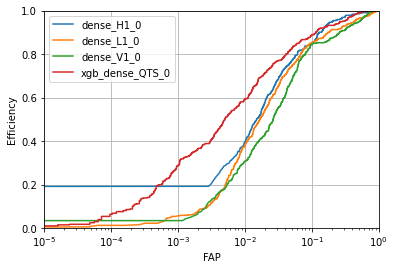

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8937
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

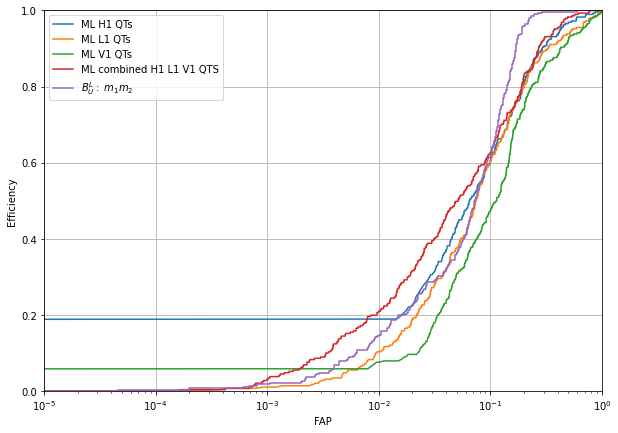

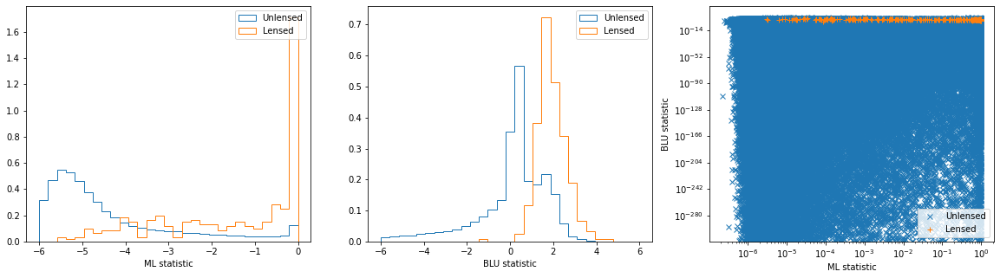

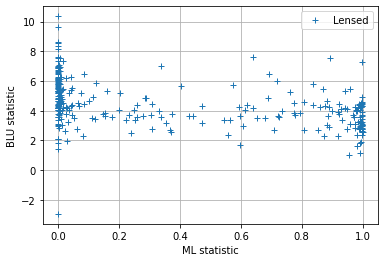

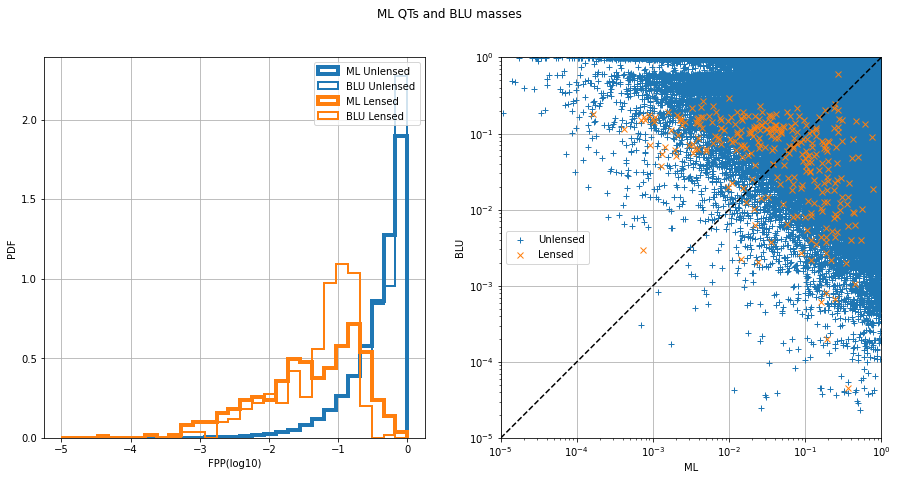

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 5, 'n_estimators_xgbqts': 105, 'test_xgb_dense_QTS_0_roc': 0.8937175049399498, 'val_xgb_dense_QTS_0_roc': 0.9568094189443083, 'test_xgb_dense_QTS_0_acc': 0.9707917325276616, 'val_xgb_dense_QTS_0_acc': 0.9946548845087527, 'test_xgb_dense_QTS_0_f1': 0.015245547760388561, 'val_xgb_dense_QTS_0_f1': 0.34604105571847504}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9562


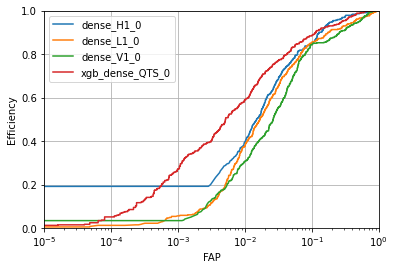

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8931
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

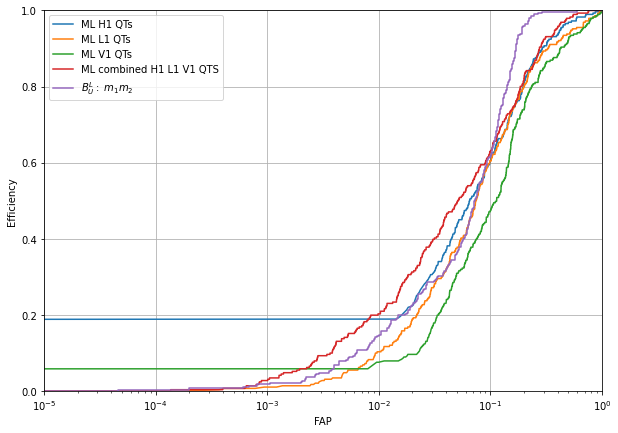

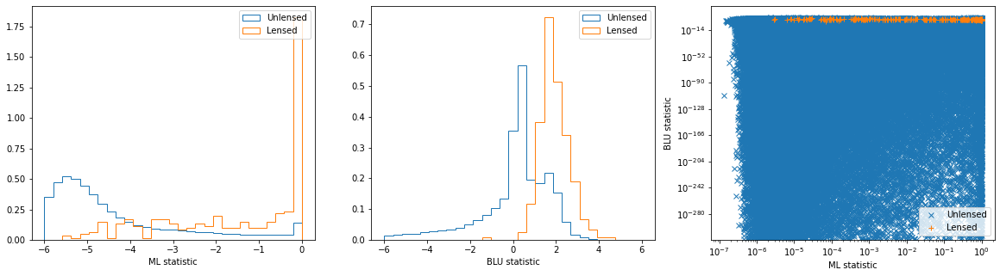

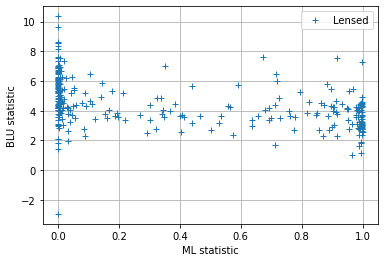

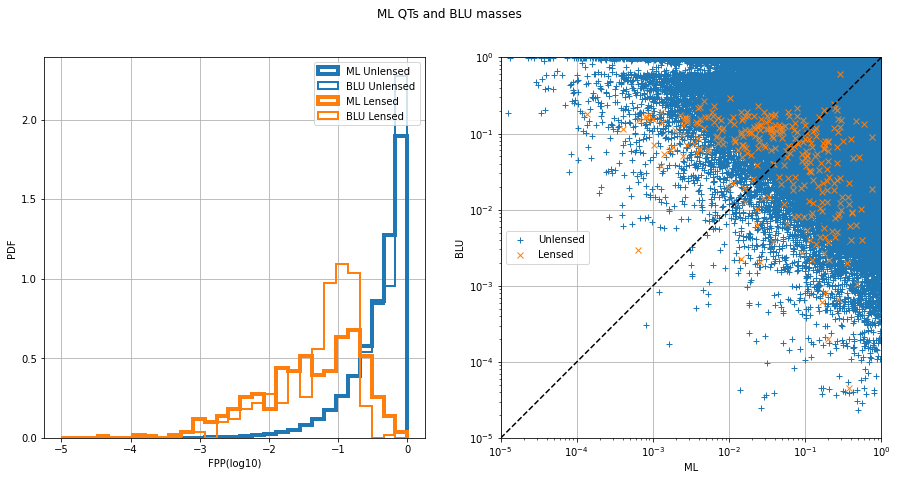

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 5, 'n_estimators_xgbqts': 120, 'test_xgb_dense_QTS_0_roc': 0.8931314985175284, 'val_xgb_dense_QTS_0_roc': 0.956163938353262, 'test_xgb_dense_QTS_0_acc': 0.9681686308249465, 'val_xgb_dense_QTS_0_acc': 0.9943033373015556, 'test_xgb_dense_QTS_0_f1': 0.014495446942947408, 'val_xgb_dense_QTS_0_f1': 0.33920296570898983}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9564


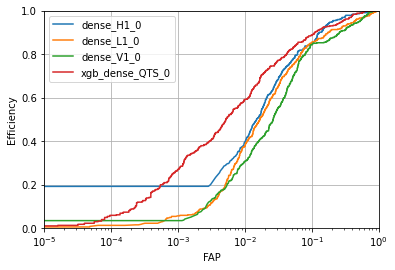

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8924
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

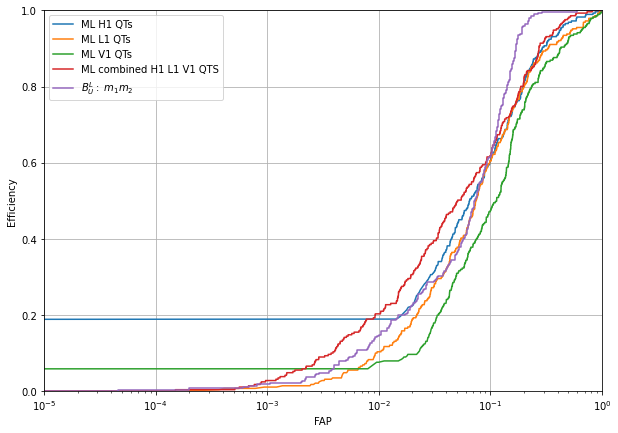

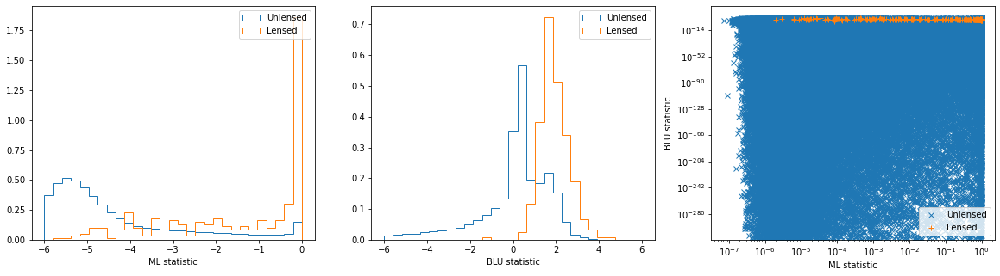

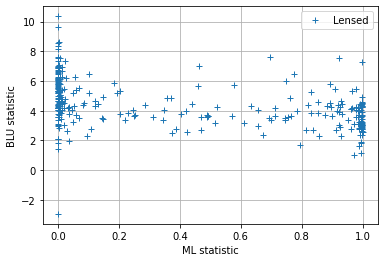

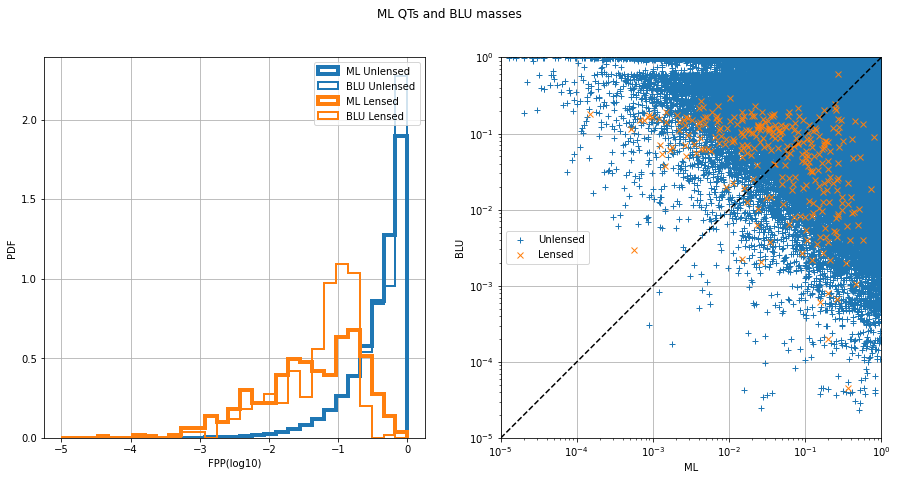

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 5, 'n_estimators_xgbqts': 135, 'test_xgb_dense_QTS_0_roc': 0.8924475107562934, 'val_xgb_dense_QTS_0_roc': 0.9564464279224139, 'test_xgb_dense_QTS_0_acc': 0.9661257728245863, 'val_xgb_dense_QTS_0_acc': 0.9939837489313764, 'test_xgb_dense_QTS_0_f1': 0.013633185737590306, 'val_xgb_dense_QTS_0_f1': 0.3318544809228039}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9570


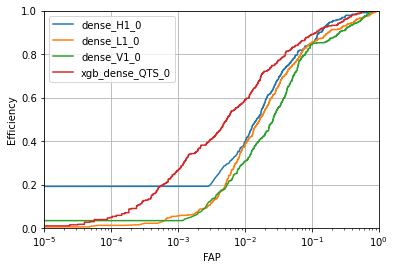

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8922
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

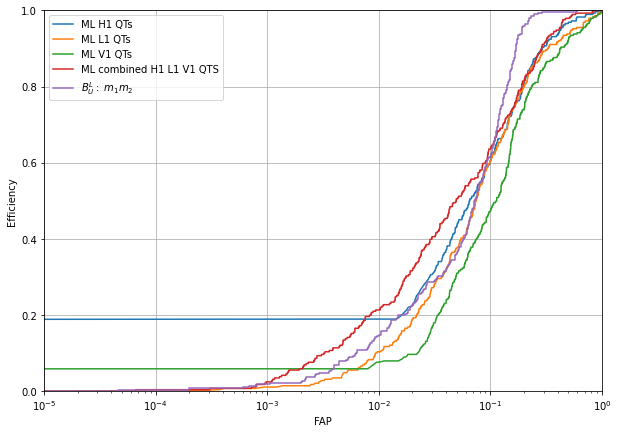

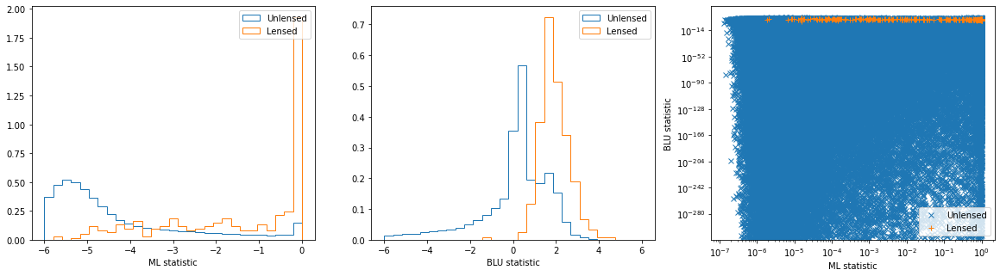

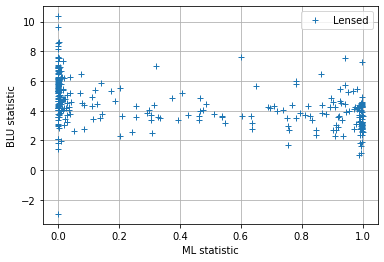

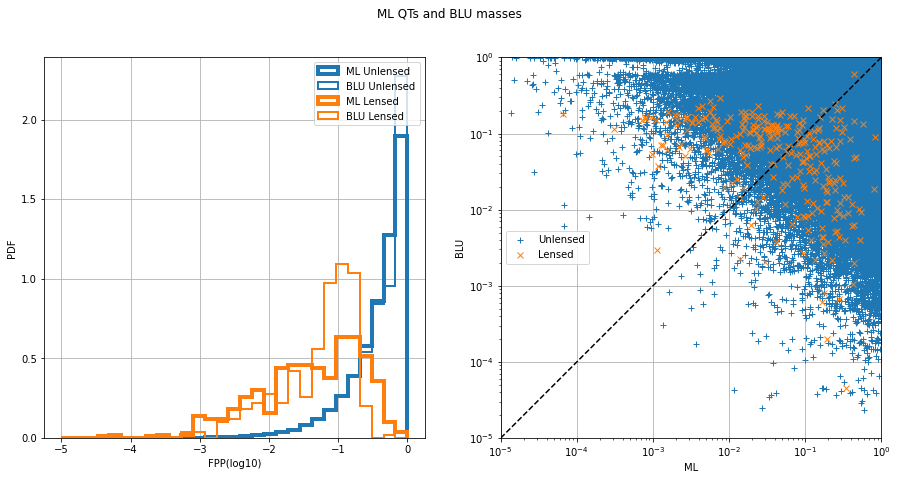

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 5, 'n_estimators_xgbqts': 150, 'test_xgb_dense_QTS_0_roc': 0.8922330759613573, 'val_xgb_dense_QTS_0_roc': 0.956978885446637, 'test_xgb_dense_QTS_0_acc': 0.9659016787050562, 'val_xgb_dense_QTS_0_acc': 0.9936242120149248, 'test_xgb_dense_QTS_0_f1': 0.014115469165798911, 'val_xgb_dense_QTS_0_f1': 0.32487309644670054}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9568


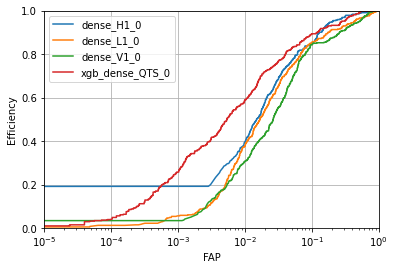

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8917
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

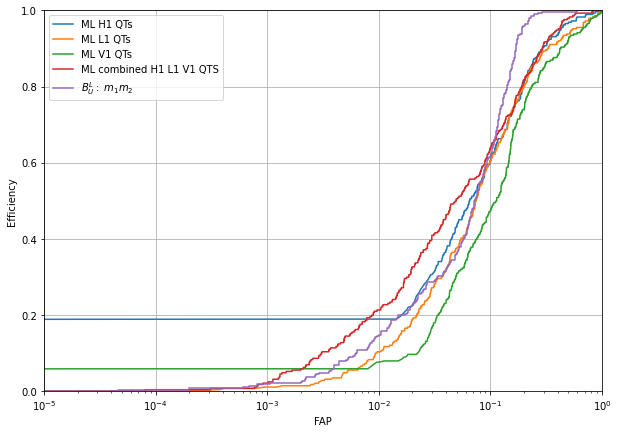

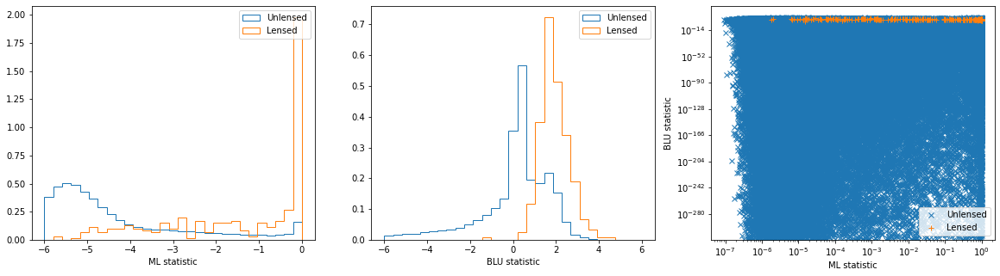

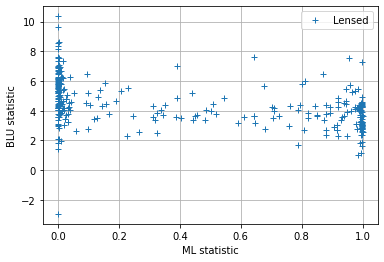

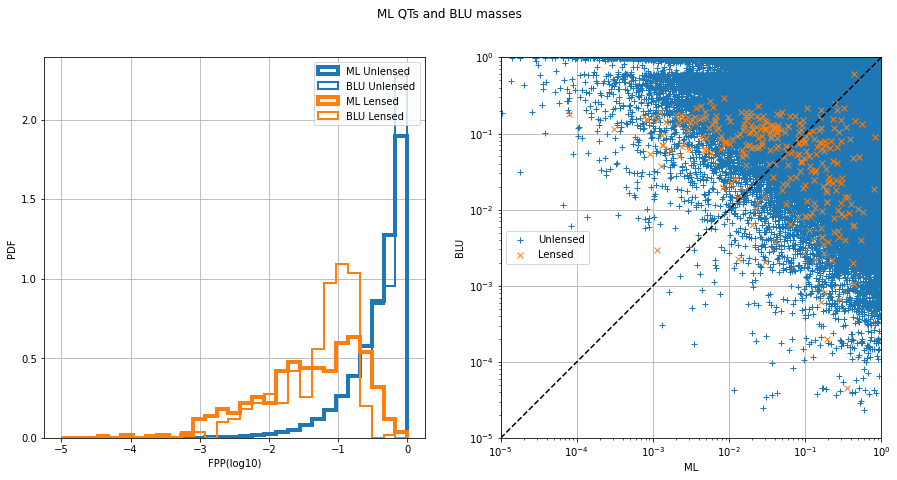

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 5, 'n_estimators_xgbqts': 165, 'test_xgb_dense_QTS_0_roc': 0.8917235791912982, 'val_xgb_dense_QTS_0_roc': 0.9567686380271002, 'test_xgb_dense_QTS_0_acc': 0.9643450249104624, 'val_xgb_dense_QTS_0_acc': 0.9933845207372903, 'test_xgb_dense_QTS_0_f1': 0.013835085777531822, 'val_xgb_dense_QTS_0_f1': 0.32242225859247137}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9577


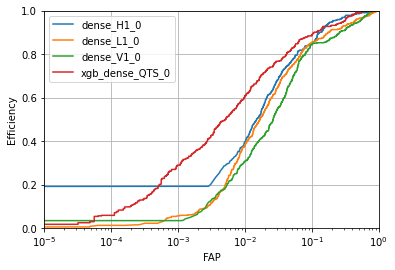

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8916
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

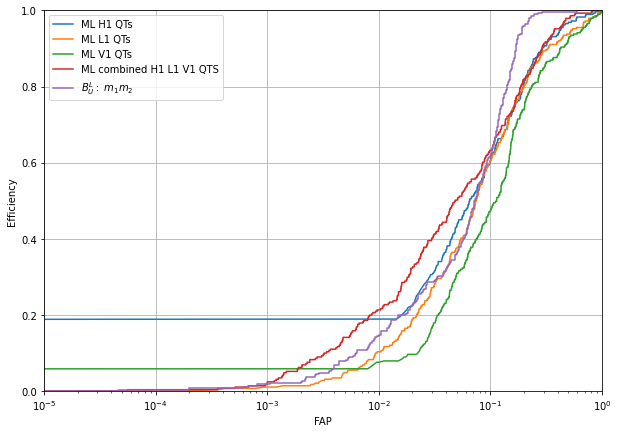

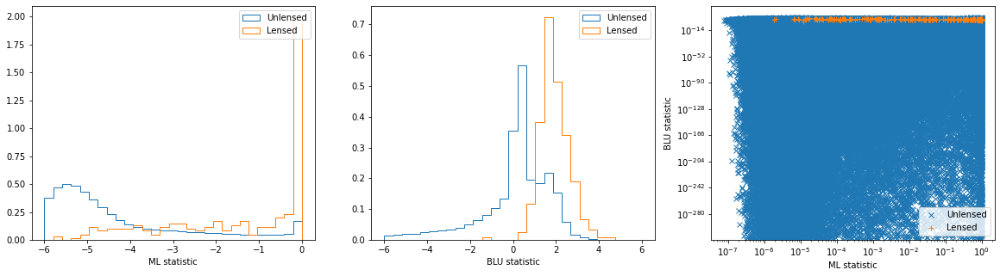

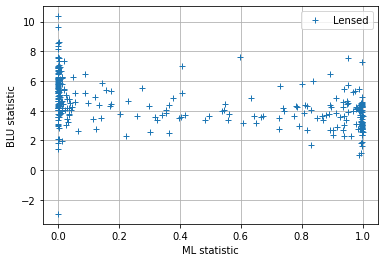

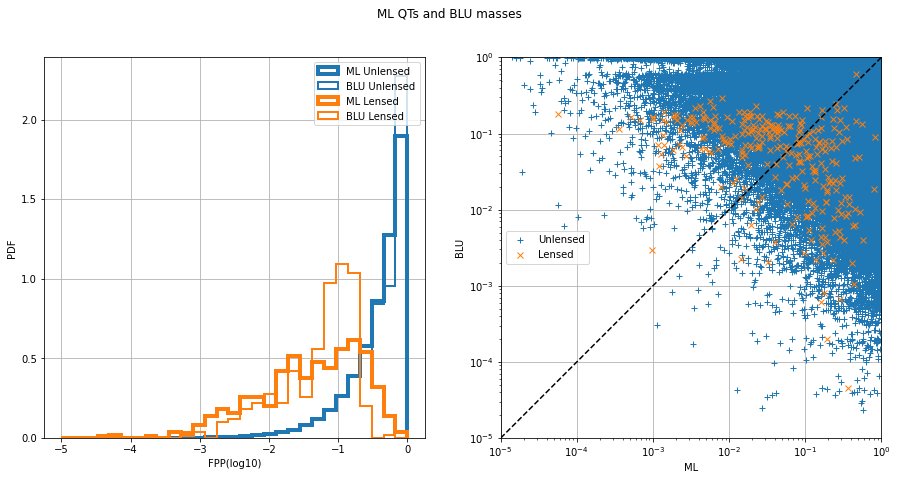

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 6, 'n_estimators_xgbqts': 105, 'test_xgb_dense_QTS_0_roc': 0.8915718807977552, 'val_xgb_dense_QTS_0_roc': 0.9577255206123799, 'test_xgb_dense_QTS_0_acc': 0.9631485223793993, 'val_xgb_dense_QTS_0_acc': 0.9946948330550252, 'test_xgb_dense_QTS_0_f1': 0.013603256212510711, 'val_xgb_dense_QTS_0_f1': 0.36030828516377644}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9571


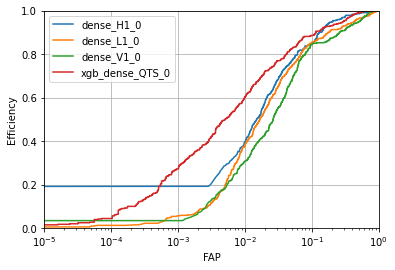

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8920
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

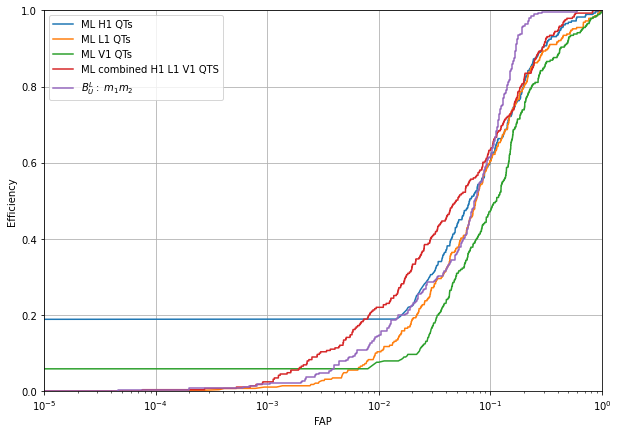

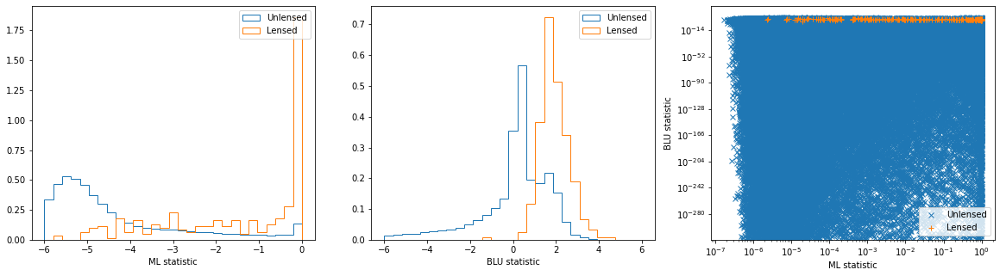

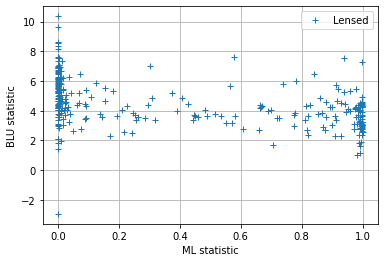

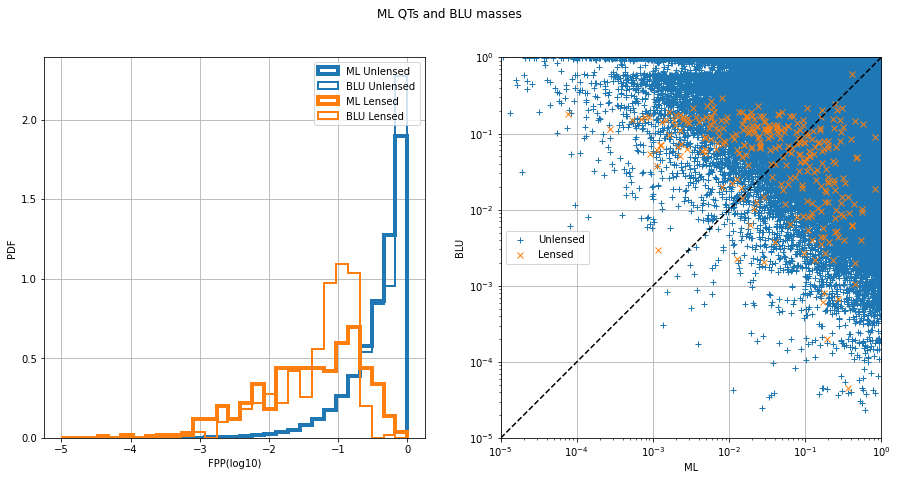

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 6, 'n_estimators_xgbqts': 120, 'test_xgb_dense_QTS_0_roc': 0.8920247710198747, 'val_xgb_dense_QTS_0_roc': 0.9570679283224014, 'test_xgb_dense_QTS_0_acc': 0.9681166089757698, 'val_xgb_dense_QTS_0_acc': 0.994359265266337, 'test_xgb_dense_QTS_0_f1': 0.014837712519319939, 'val_xgb_dense_QTS_0_f1': 0.3511029411764706}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9579


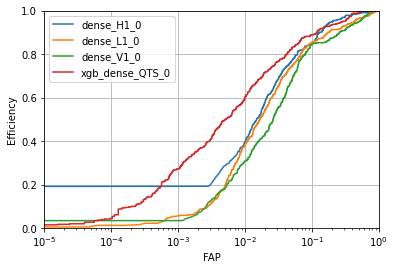

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8922
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

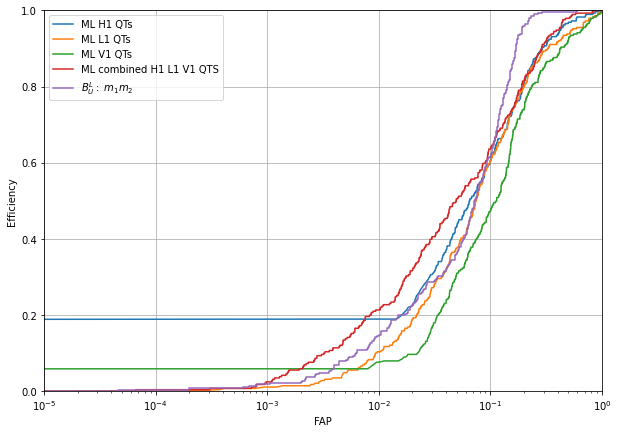

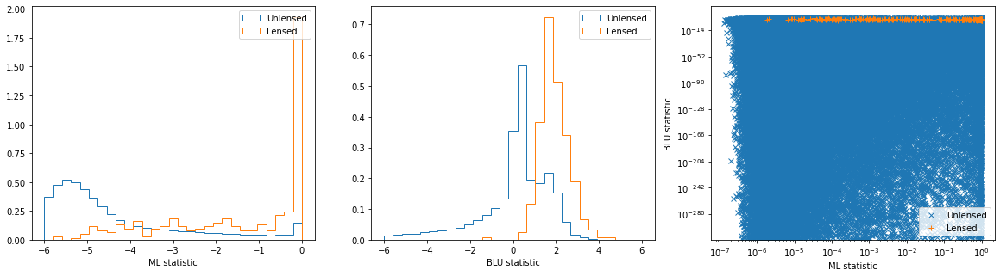

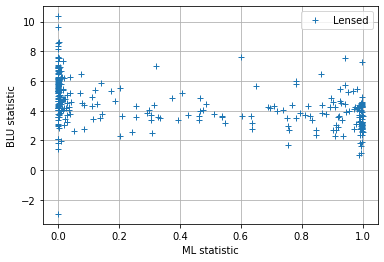

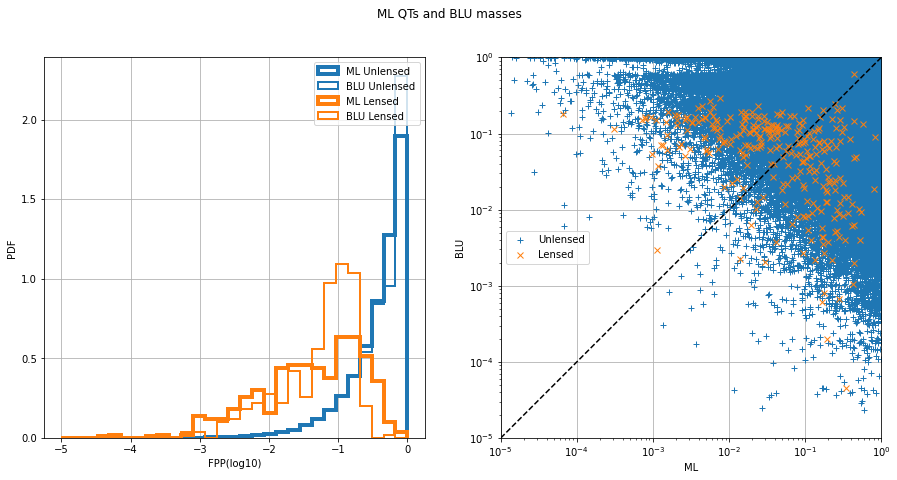

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 6, 'n_estimators_xgbqts': 135, 'test_xgb_dense_QTS_0_roc': 0.8922330759613573, 'val_xgb_dense_QTS_0_roc': 0.9579123909937368, 'test_xgb_dense_QTS_0_acc': 0.9659016787050562, 'val_xgb_dense_QTS_0_acc': 0.9940796254424301, 'test_xgb_dense_QTS_0_f1': 0.014115469165798911, 'val_xgb_dense_QTS_0_f1': 0.3425022182786158}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9574


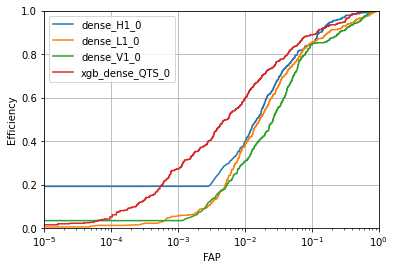

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8917
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

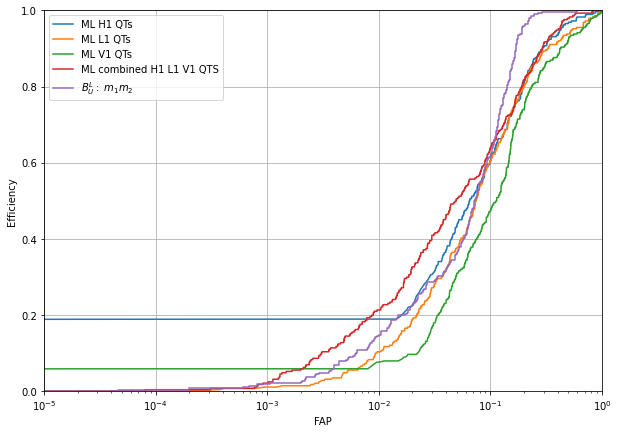

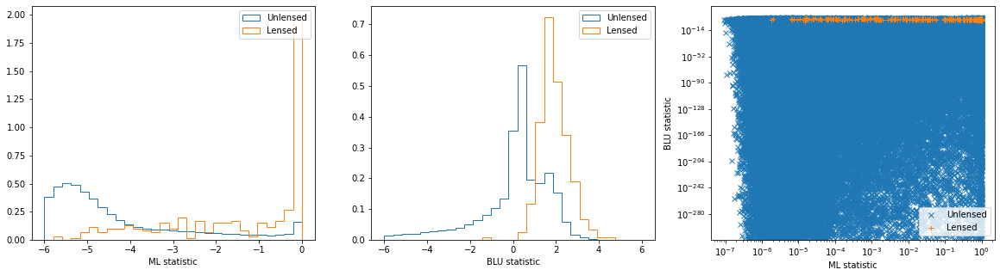

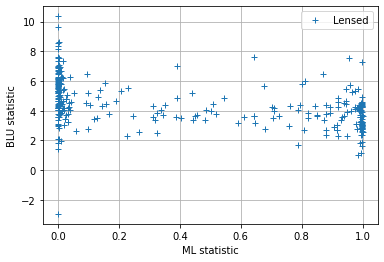

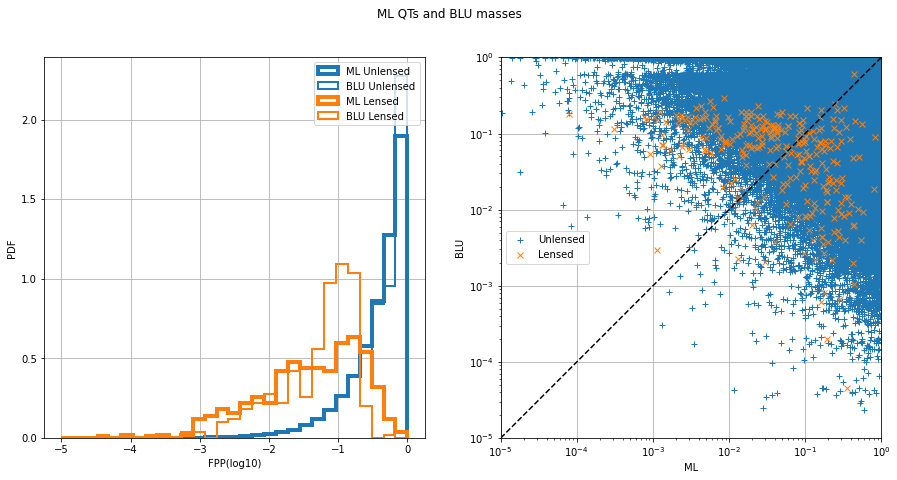

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 6, 'n_estimators_xgbqts': 150, 'test_xgb_dense_QTS_0_roc': 0.8917235791912982, 'val_xgb_dense_QTS_0_roc': 0.957412153507155, 'test_xgb_dense_QTS_0_acc': 0.9643450249104624, 'val_xgb_dense_QTS_0_acc': 0.9938559135833047, 'test_xgb_dense_QTS_0_f1': 0.013835085777531822, 'val_xgb_dense_QTS_0_f1': 0.33877901977644026}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9571


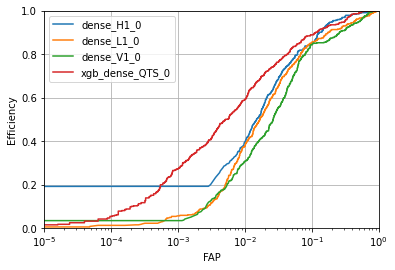

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8916
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

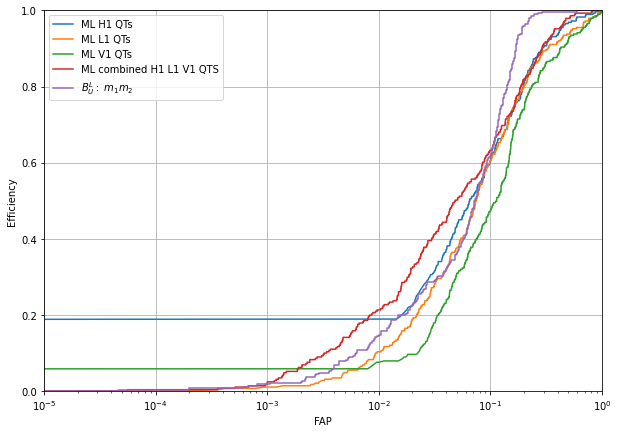

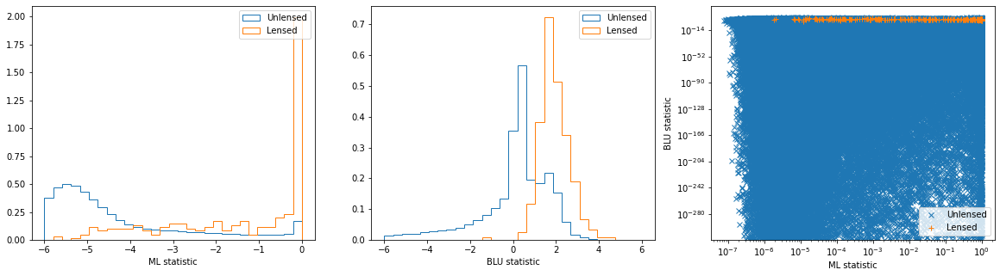

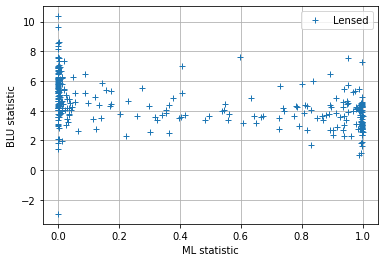

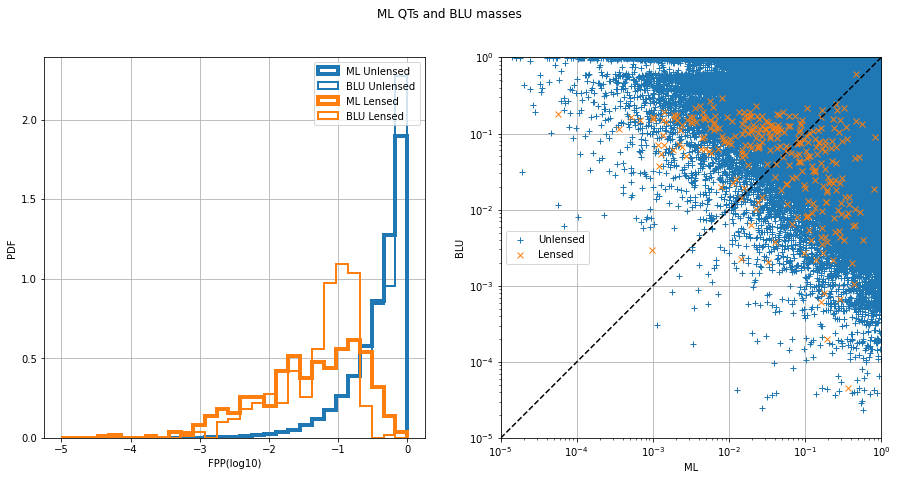

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 6, 'n_estimators_xgbqts': 165, 'test_xgb_dense_QTS_0_roc': 0.8915718807977552, 'val_xgb_dense_QTS_0_roc': 0.9571150618013788, 'test_xgb_dense_QTS_0_acc': 0.9631485223793993, 'val_xgb_dense_QTS_0_acc': 0.9936322017241792, 'test_xgb_dense_QTS_0_f1': 0.013603256212510711, 'val_xgb_dense_QTS_0_f1': 0.33638634471273937}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9589


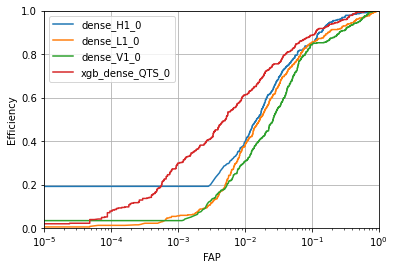

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8916
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

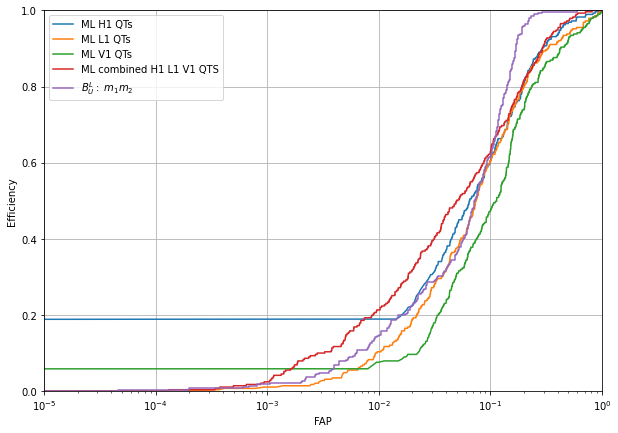

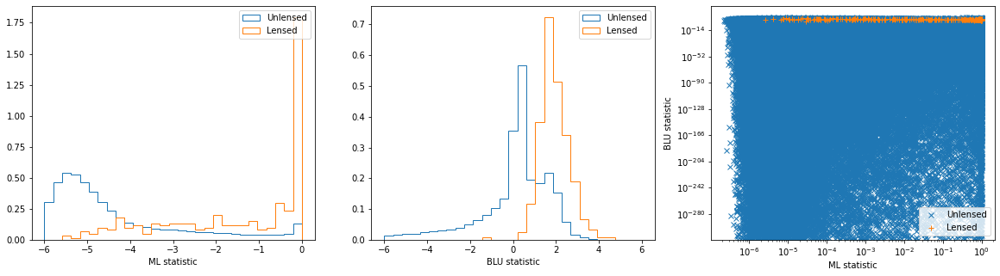

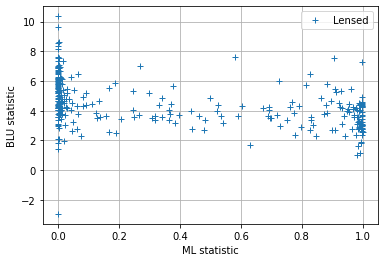

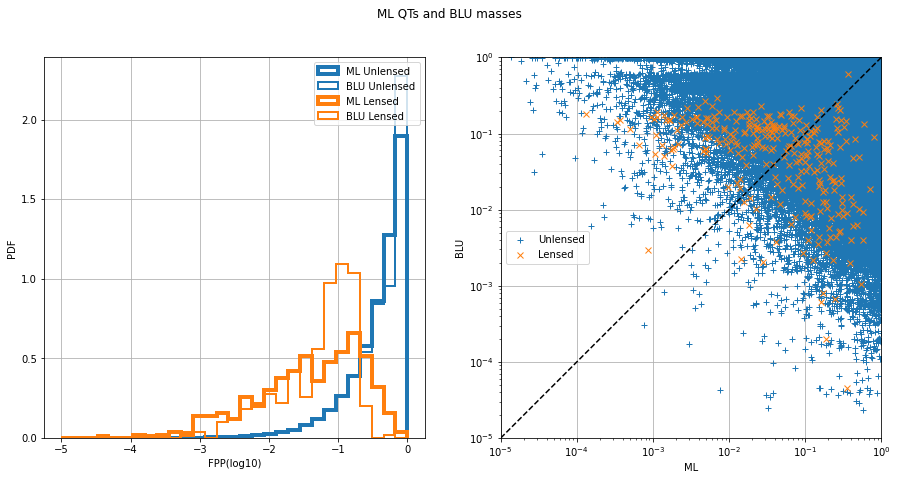

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 7, 'n_estimators_xgbqts': 105, 'test_xgb_dense_QTS_0_roc': 0.8916023133530313, 'val_xgb_dense_QTS_0_roc': 0.9588701199387011, 'test_xgb_dense_QTS_0_acc': 0.9689509594029493, 'val_xgb_dense_QTS_0_acc': 0.9944471520681363, 'test_xgb_dense_QTS_0_f1': 0.014605029210058419, 'val_xgb_dense_QTS_0_f1': 0.3486410496719775}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9580


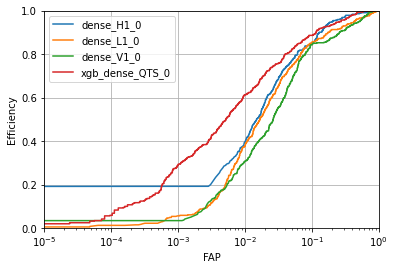

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8913
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

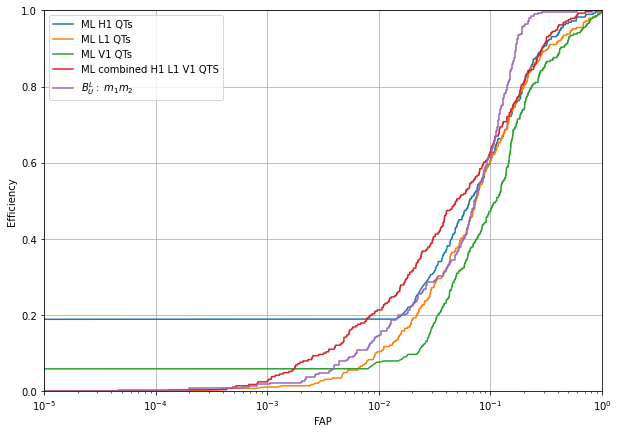

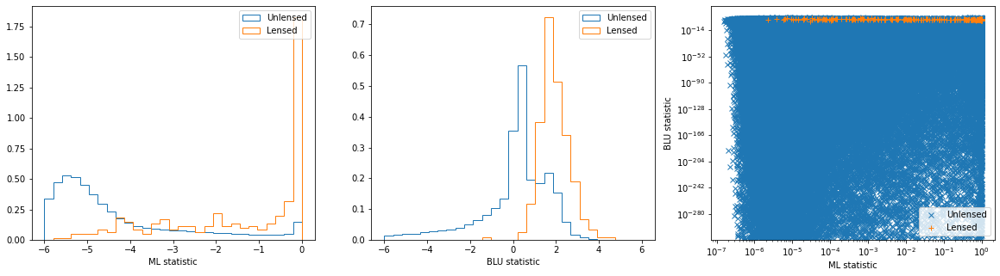

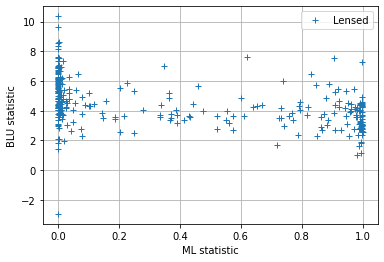

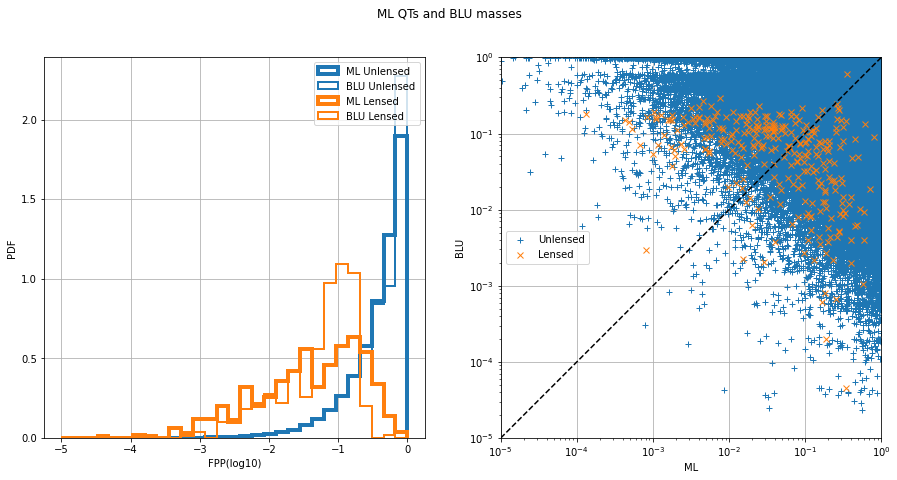

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 7, 'n_estimators_xgbqts': 120, 'test_xgb_dense_QTS_0_roc': 0.8912782154110171, 'val_xgb_dense_QTS_0_roc': 0.9579997800632214, 'test_xgb_dense_QTS_0_acc': 0.96683407030953, 'val_xgb_dense_QTS_0_acc': 0.9940316871869033, 'test_xgb_dense_QTS_0_f1': 0.014272121788772596, 'val_xgb_dense_QTS_0_f1': 0.3395225464190981}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9582


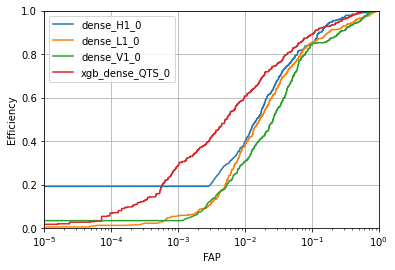

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8916
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

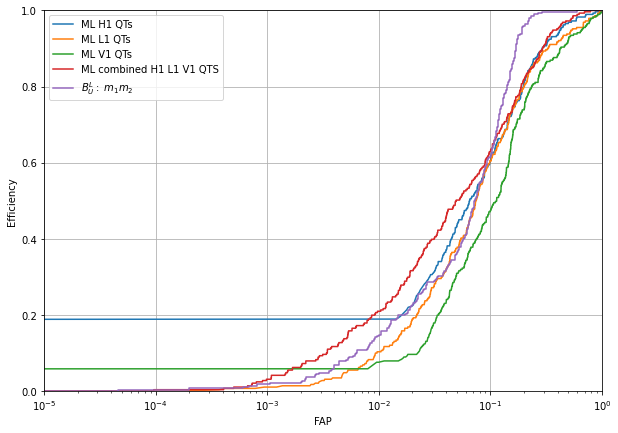

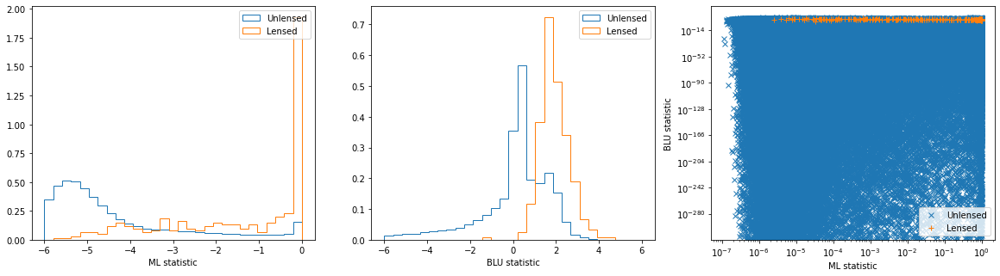

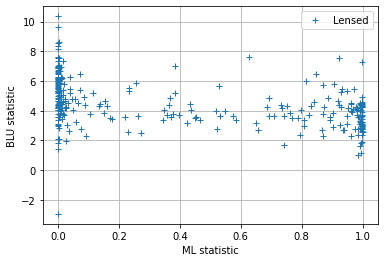

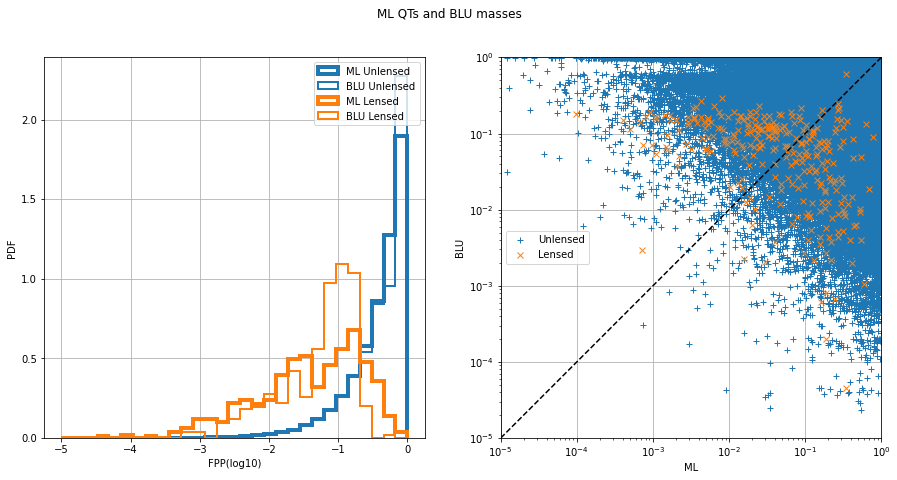

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 7, 'n_estimators_xgbqts': 135, 'test_xgb_dense_QTS_0_roc': 0.8916039920109915, 'val_xgb_dense_QTS_0_roc': 0.9581652871587507, 'test_xgb_dense_QTS_0_acc': 0.965093339202465, 'val_xgb_dense_QTS_0_acc': 0.9937999856185233, 'test_xgb_dense_QTS_0_f1': 0.013904589645037305, 'val_xgb_dense_QTS_0_f1': 0.3378839590443685}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9578


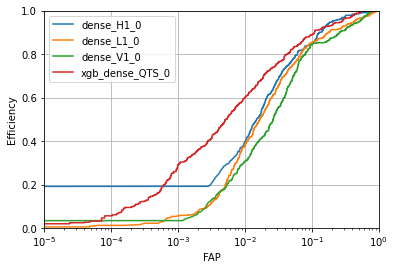

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8914
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

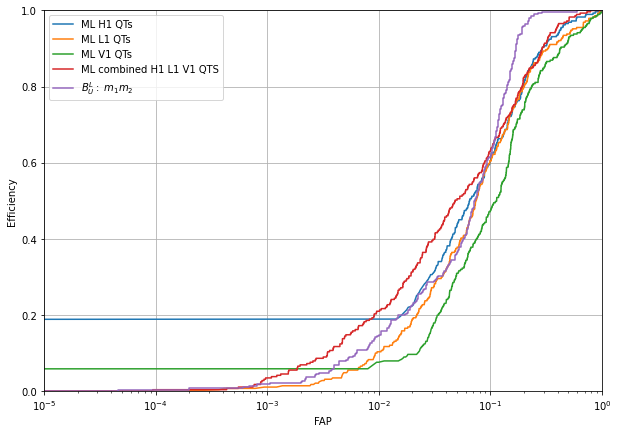

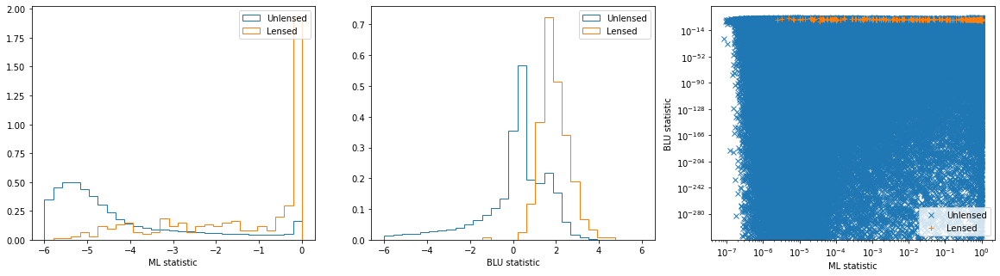

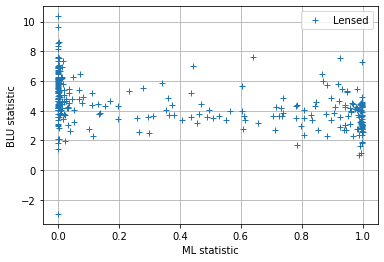

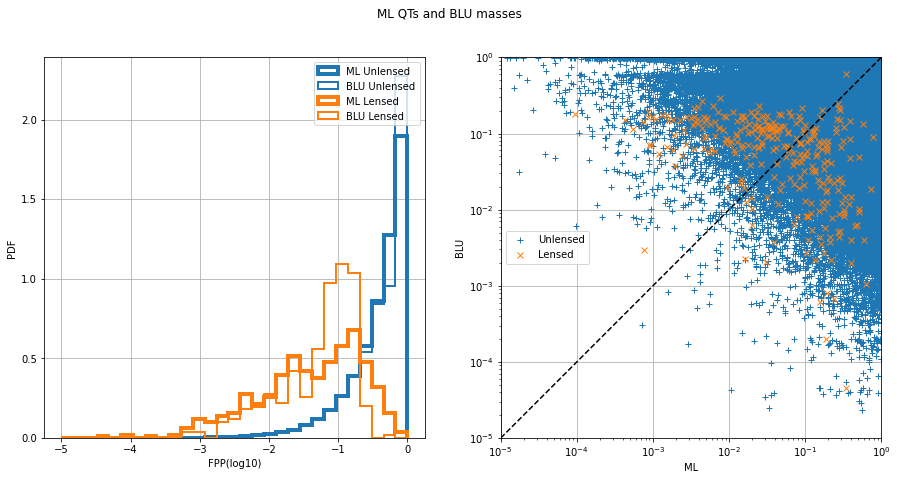

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 7, 'n_estimators_xgbqts': 150, 'test_xgb_dense_QTS_0_roc': 0.8913510340797905, 'val_xgb_dense_QTS_0_roc': 0.9577517383060525, 'test_xgb_dense_QTS_0_acc': 0.9634746593569299, 'val_xgb_dense_QTS_0_acc': 0.9935762737593979, 'test_xgb_dense_QTS_0_f1': 0.013509862199405568, 'val_xgb_dense_QTS_0_f1': 0.328881469115192}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9570


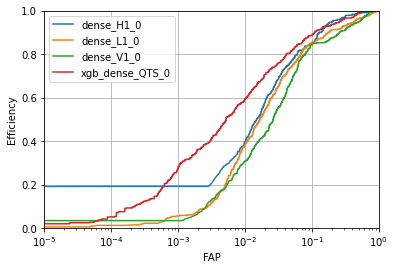

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8910
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

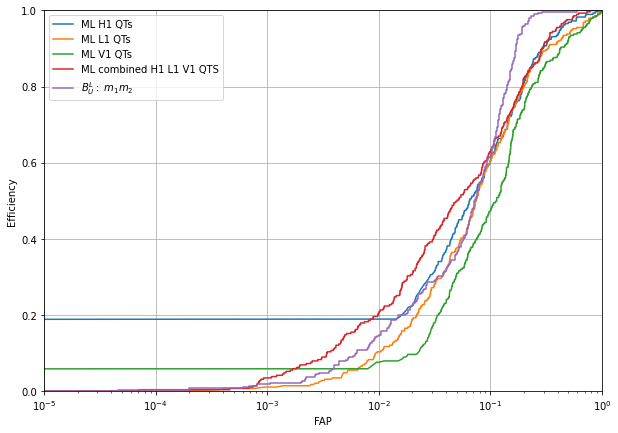

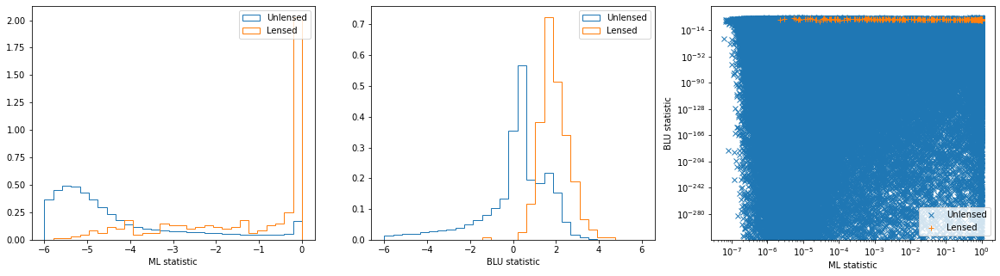

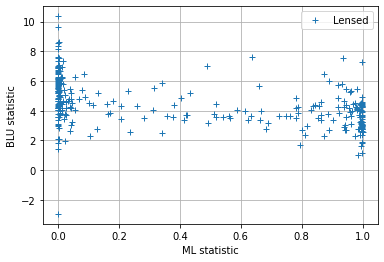

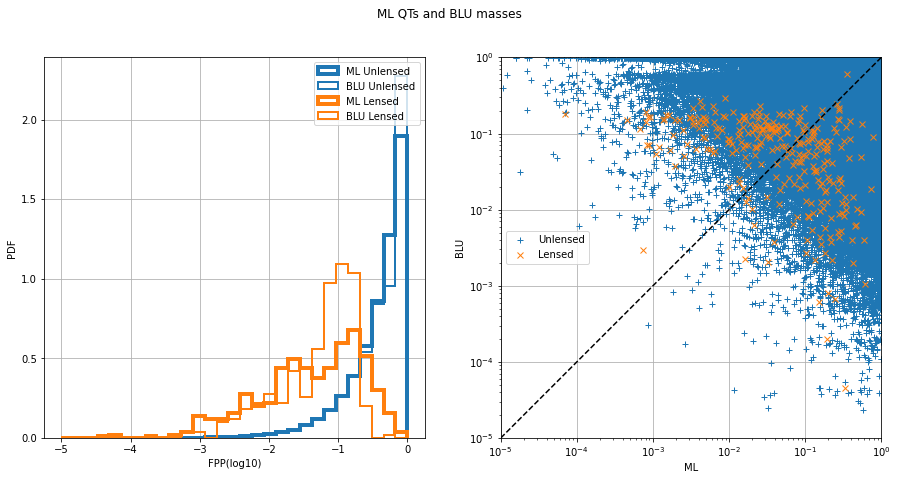

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 7, 'n_estimators_xgbqts': 165, 'test_xgb_dense_QTS_0_roc': 0.8909625898758804, 'val_xgb_dense_QTS_0_roc': 0.9570208045716965, 'test_xgb_dense_QTS_0_acc': 0.9617099181656296, 'val_xgb_dense_QTS_0_acc': 0.9932566853892187, 'test_xgb_dense_QTS_0_f1': 0.013404134659998969, 'val_xgb_dense_QTS_0_f1': 0.3226324237560193}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9575


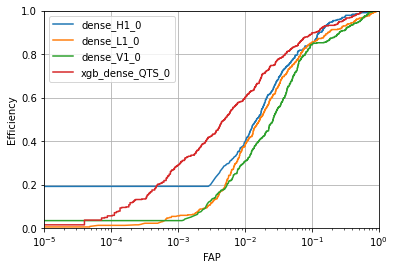

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8927
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

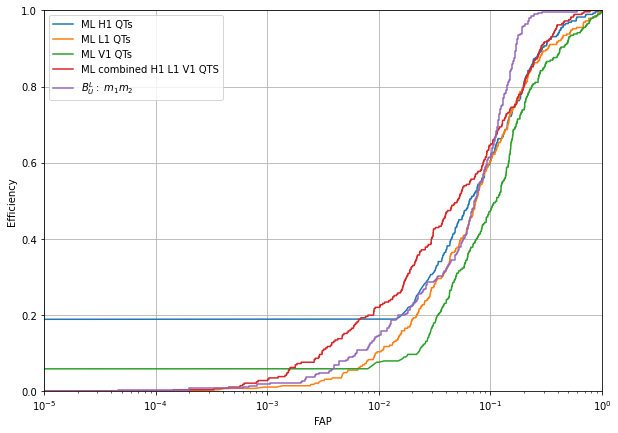

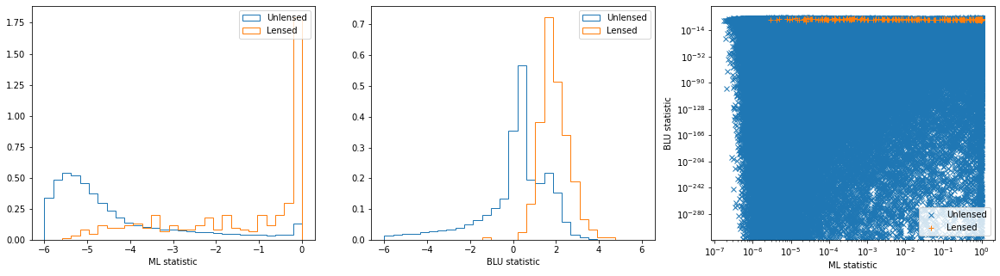

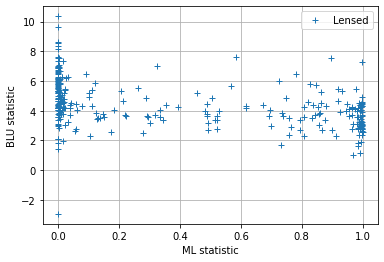

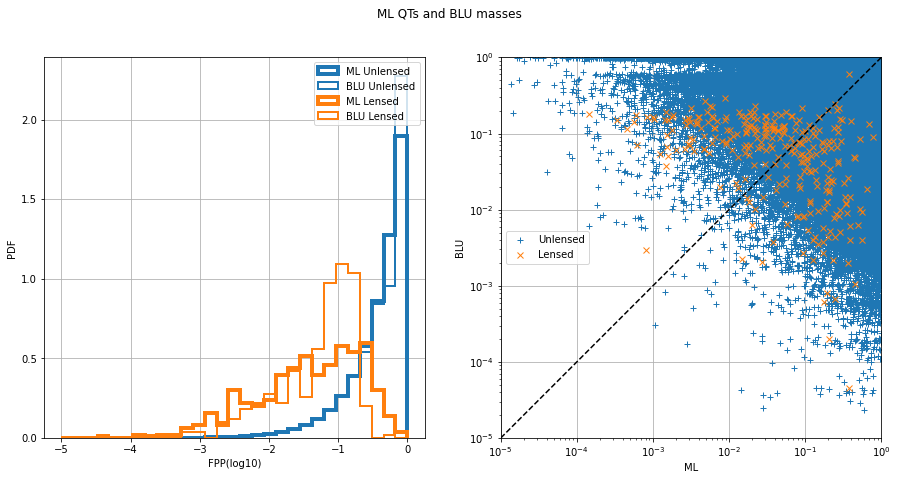

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 8, 'n_estimators_xgbqts': 105, 'test_xgb_dense_QTS_0_roc': 0.8926597956306859, 'val_xgb_dense_QTS_0_roc': 0.9575003694797795, 'test_xgb_dense_QTS_0_acc': 0.9693971468016567, 'val_xgb_dense_QTS_0_acc': 0.9944871006144086, 'test_xgb_dense_QTS_0_f1': 0.01519541562037216, 'val_xgb_dense_QTS_0_f1': 0.34410646387832705}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9565


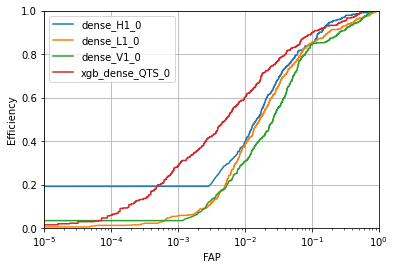

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8921
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

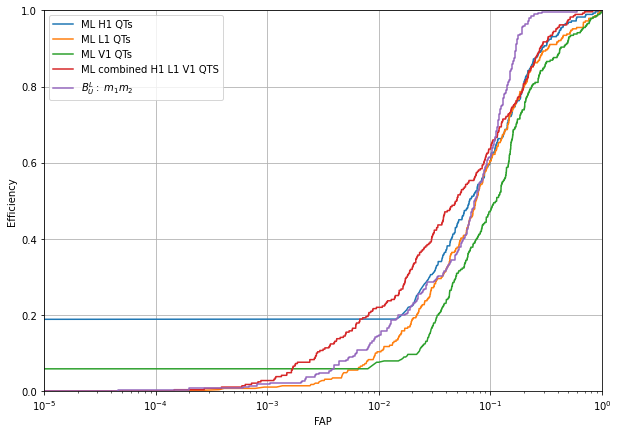

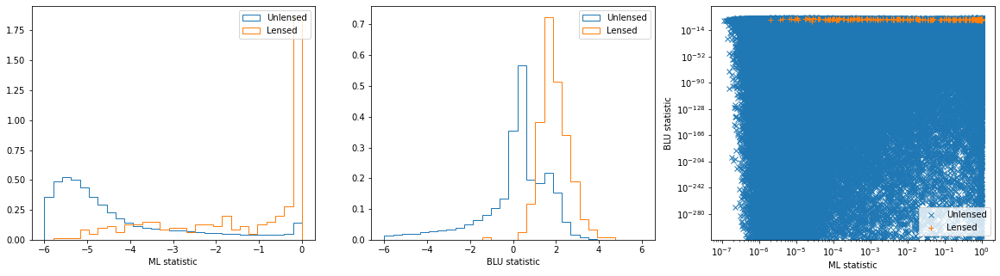

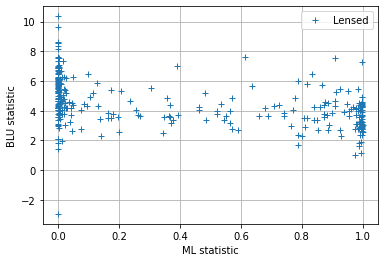

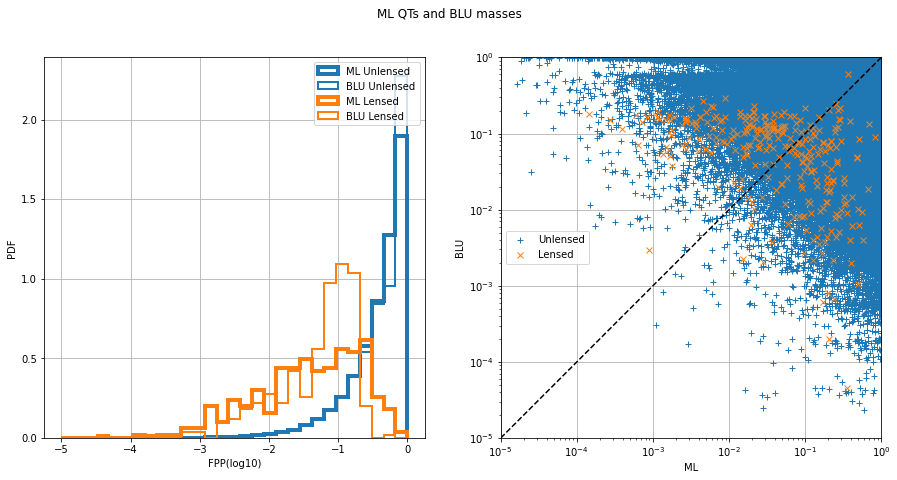

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 8, 'n_estimators_xgbqts': 120, 'test_xgb_dense_QTS_0_roc': 0.8921170352899791, 'val_xgb_dense_QTS_0_roc': 0.9564512531454422, 'test_xgb_dense_QTS_0_acc': 0.967494347626003, 'val_xgb_dense_QTS_0_acc': 0.9942793681737921, 'test_xgb_dense_QTS_0_f1': 0.014916323065728838, 'val_xgb_dense_QTS_0_f1': 0.3467153284671533}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9566


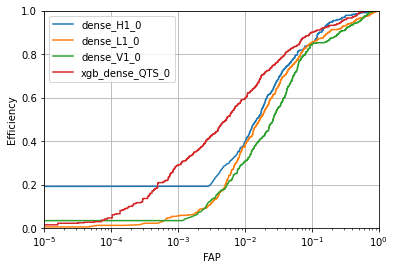

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8921
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

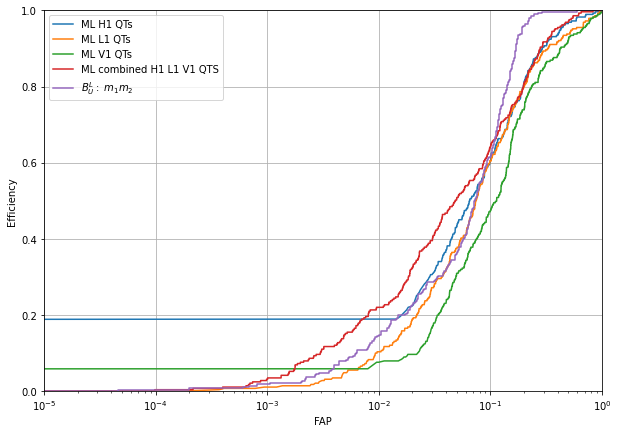

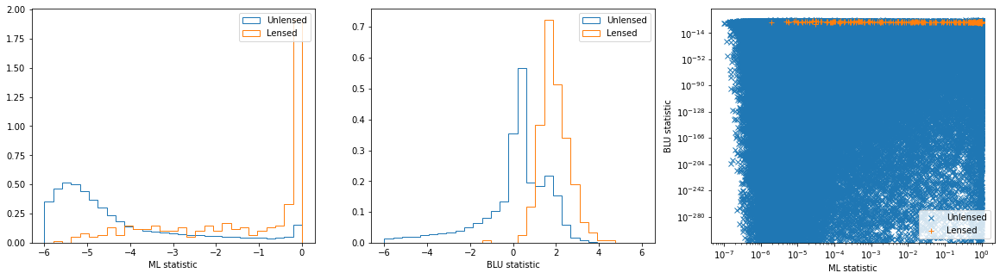

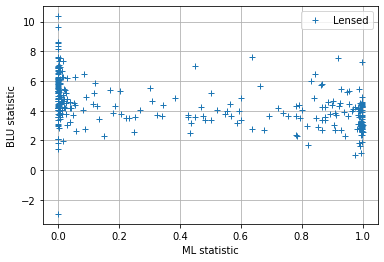

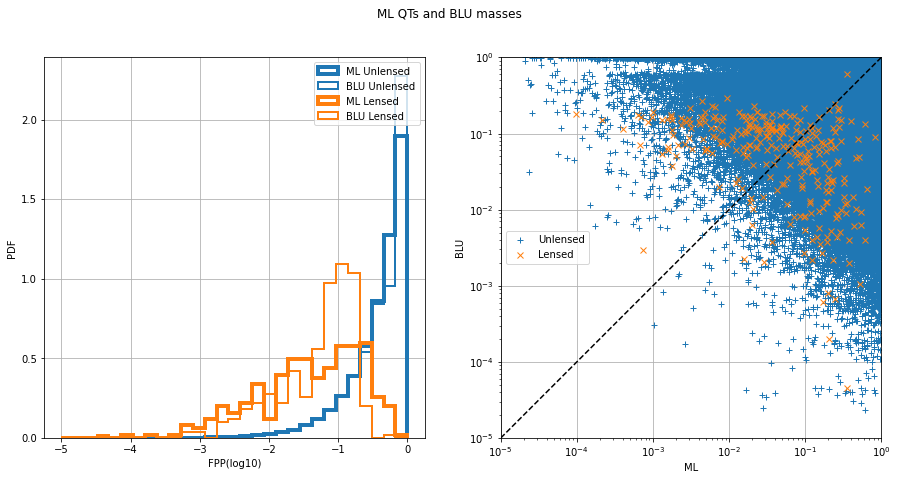

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 8, 'n_estimators_xgbqts': 135, 'test_xgb_dense_QTS_0_roc': 0.8921072041333182, 'val_xgb_dense_QTS_0_roc': 0.9566361097744465, 'test_xgb_dense_QTS_0_acc': 0.9655035114748194, 'val_xgb_dense_QTS_0_acc': 0.9939677695128675, 'test_xgb_dense_QTS_0_f1': 0.014405762304921967, 'val_xgb_dense_QTS_0_f1': 0.3394575678040245}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9569


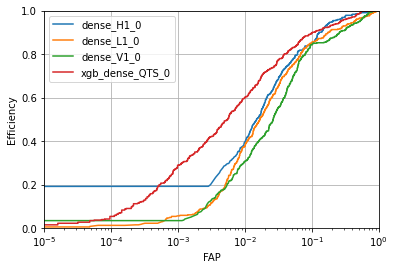

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8922
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

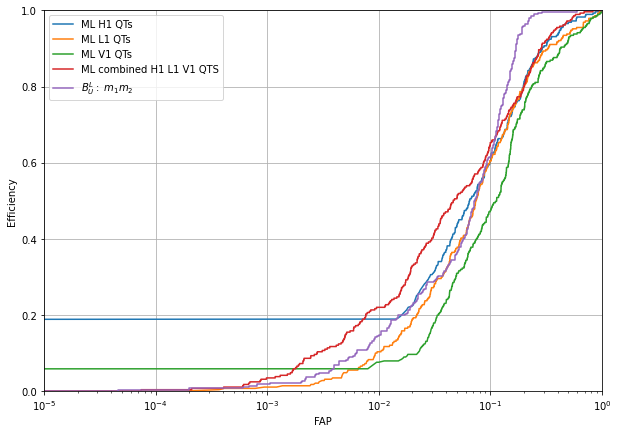

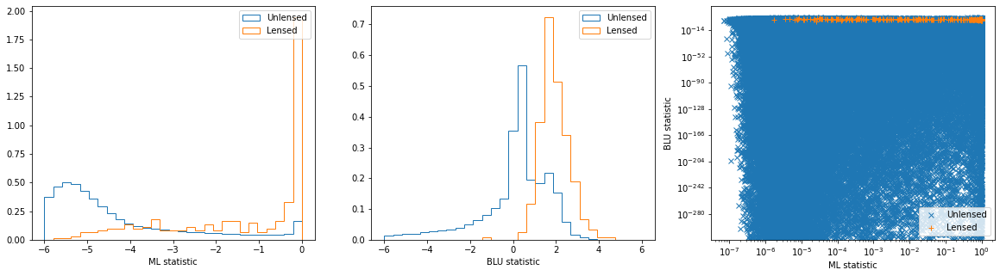

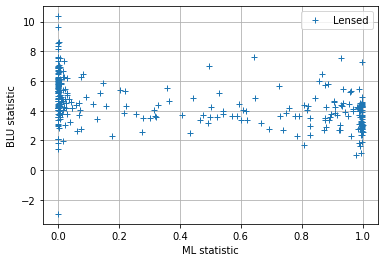

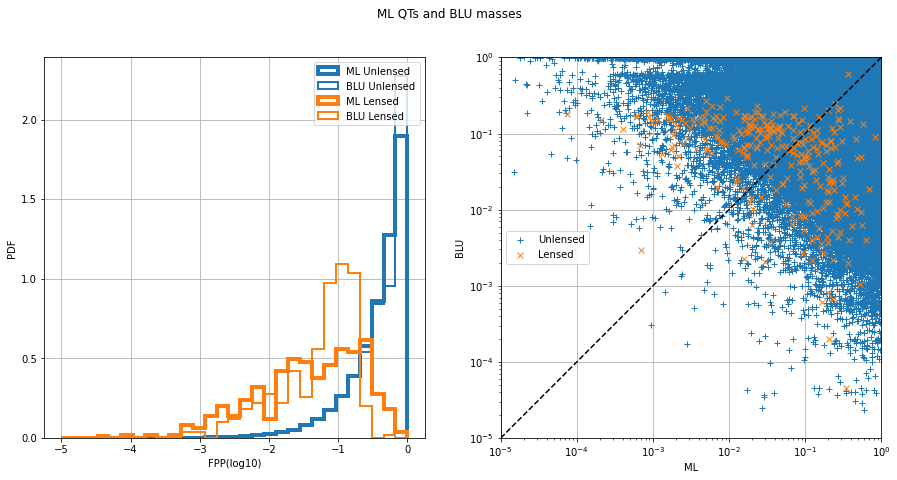

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 8, 'n_estimators_xgbqts': 150, 'test_xgb_dense_QTS_0_roc': 0.8921976865492763, 'val_xgb_dense_QTS_0_roc': 0.9568577879138592, 'test_xgb_dense_QTS_0_acc': 0.964204966085756, 'val_xgb_dense_QTS_0_acc': 0.9936401914334337, 'test_xgb_dense_QTS_0_f1': 0.01421644258320476, 'val_xgb_dense_QTS_0_f1': 0.3322147651006711}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9567


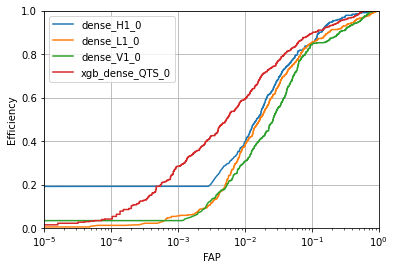

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8922
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

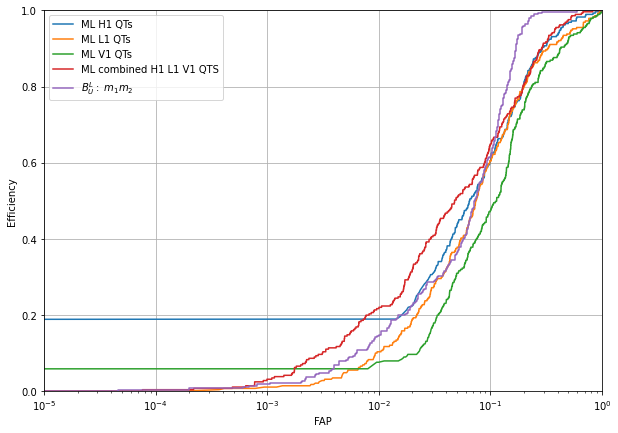

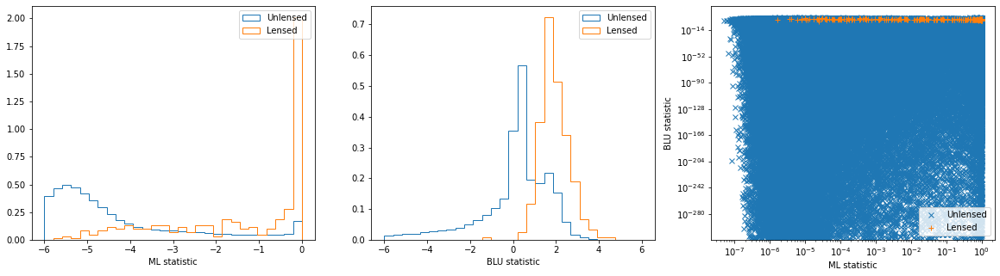

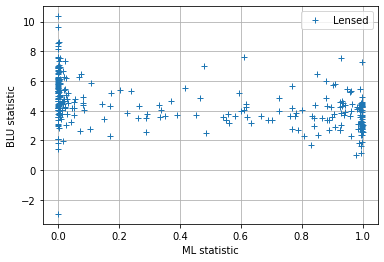

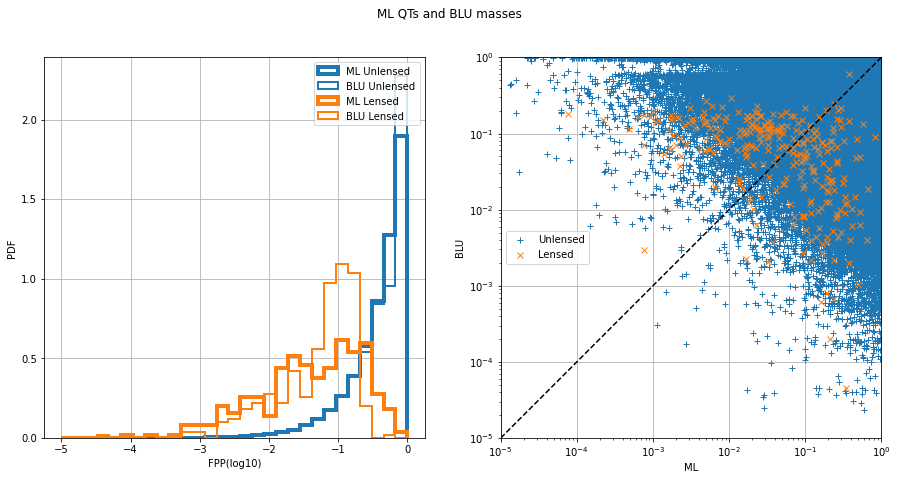

{'scale_pos_weight_xgbqts': 0.01, 'max_depth_xgbqts': 8, 'n_estimators_xgbqts': 165, 'test_xgb_dense_QTS_0_roc': 0.8922078823324614, 'val_xgb_dense_QTS_0_roc': 0.9567083519240616, 'test_xgb_dense_QTS_0_acc': 0.9623541887592789, 'val_xgb_dense_QTS_0_acc': 0.9934324589928173, 'test_xgb_dense_QTS_0_f1': 0.013837203207715289, 'val_xgb_dense_QTS_0_f1': 0.3262295081967213}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9608


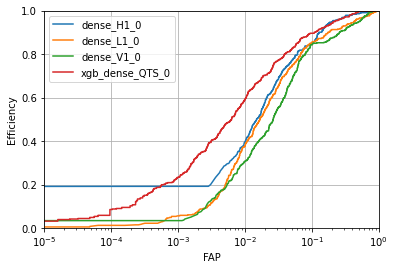

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8909
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

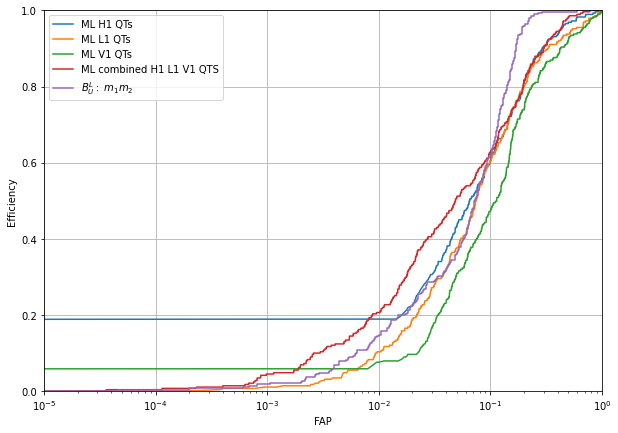

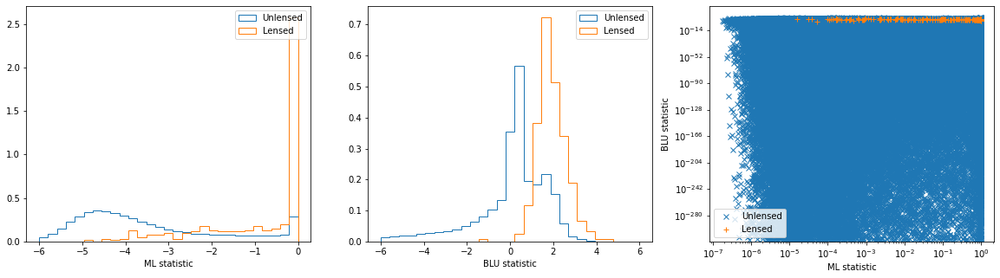

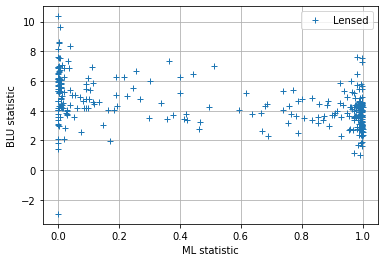

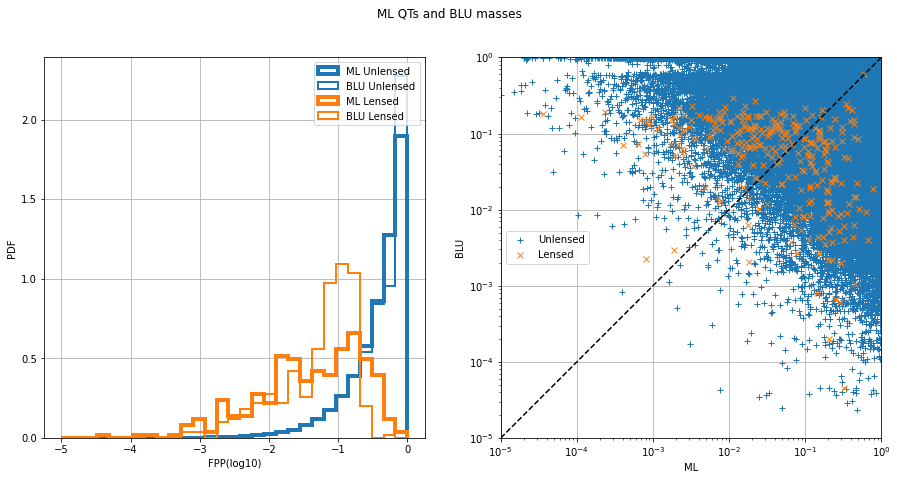

{'scale_pos_weight_xgbqts': 0.1, 'max_depth_xgbqts': 4, 'n_estimators_xgbqts': 105, 'test_xgb_dense_QTS_0_roc': 0.890920255360476, 'val_xgb_dense_QTS_0_roc': 0.9607868911453812, 'test_xgb_dense_QTS_0_acc': 0.932857800276116, 'val_xgb_dense_QTS_0_acc': 0.9871205886817779, 'test_xgb_dense_QTS_0_f1': 0.009328964071679508, 'val_xgb_dense_QTS_0_f1': 0.24390243902439027}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9608


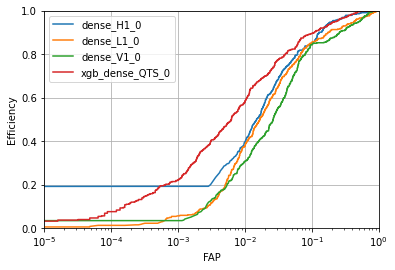

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8901
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

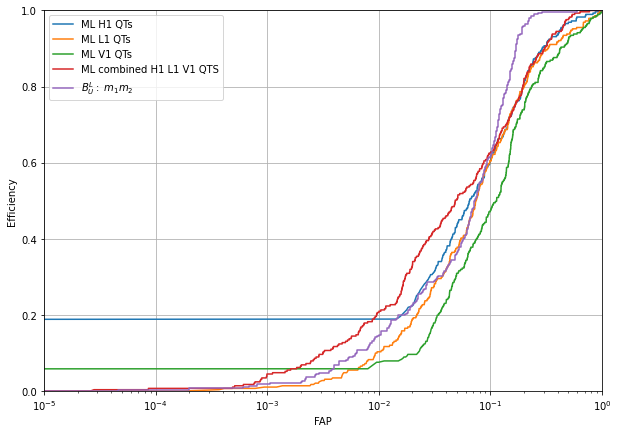

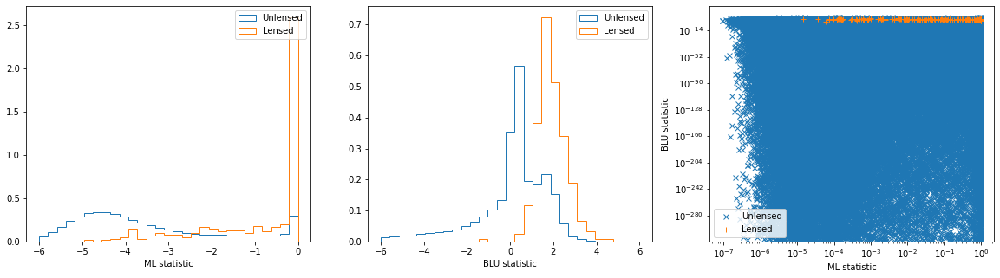

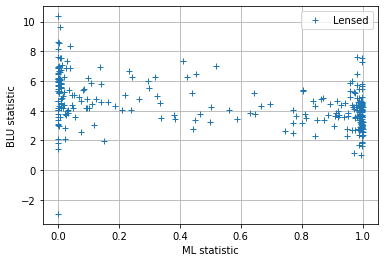

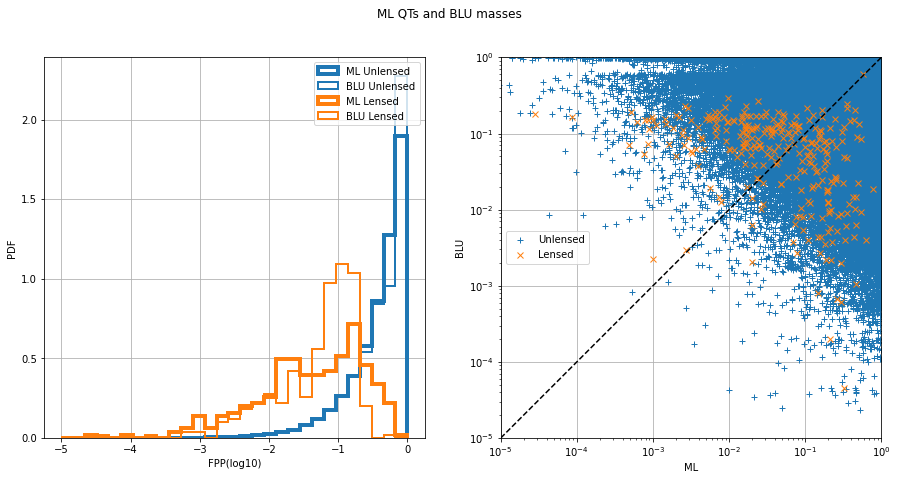

{'scale_pos_weight_xgbqts': 0.1, 'max_depth_xgbqts': 4, 'n_estimators_xgbqts': 120, 'test_xgb_dense_QTS_0_roc': 0.8901471060944647, 'val_xgb_dense_QTS_0_roc': 0.9607821048354415, 'test_xgb_dense_QTS_0_acc': 0.9291362372196322, 'val_xgb_dense_QTS_0_acc': 0.9862736795008029, 'test_xgb_dense_QTS_0_f1': 0.00895430506198058, 'val_xgb_dense_QTS_0_f1': 0.23576512455516013}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9604


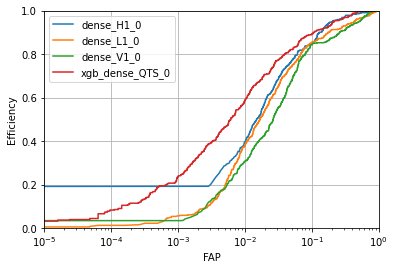

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8896
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

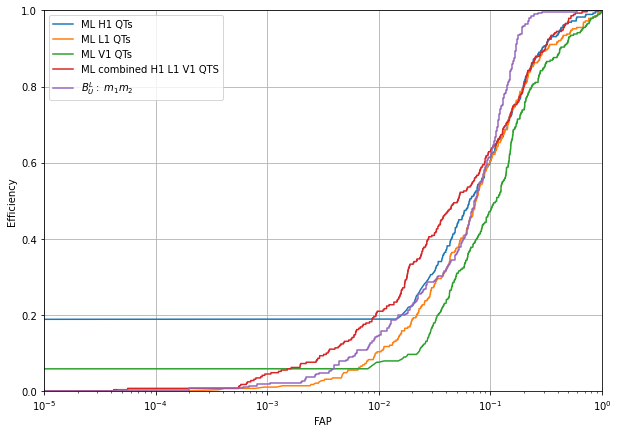

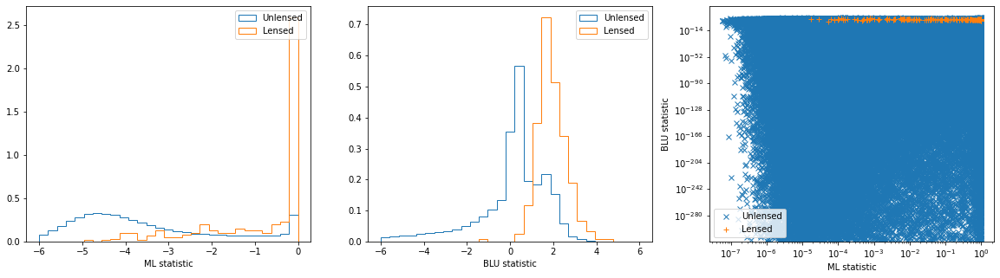

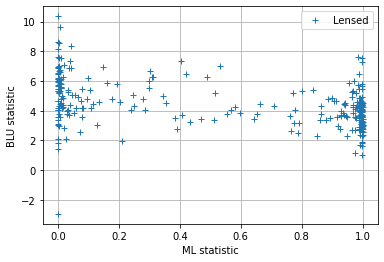

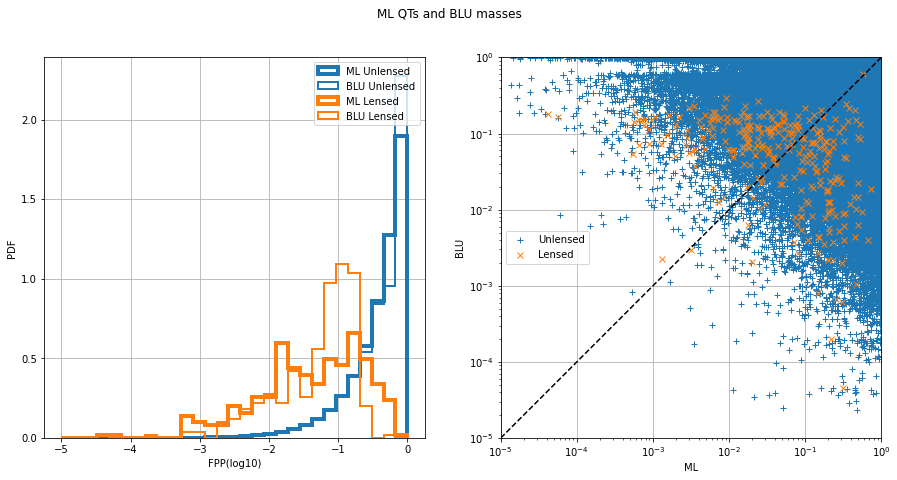

{'scale_pos_weight_xgbqts': 0.1, 'max_depth_xgbqts': 4, 'n_estimators_xgbqts': 135, 'test_xgb_dense_QTS_0_roc': 0.8896123744170352, 'val_xgb_dense_QTS_0_roc': 0.9603580397204577, 'test_xgb_dense_QTS_0_acc': 0.9268572800576242, 'val_xgb_dense_QTS_0_acc': 0.9856904307252259, 'test_xgb_dense_QTS_0_f1': 0.008839000054226994, 'val_xgb_dense_QTS_0_f1': 0.22967741935483874}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9594


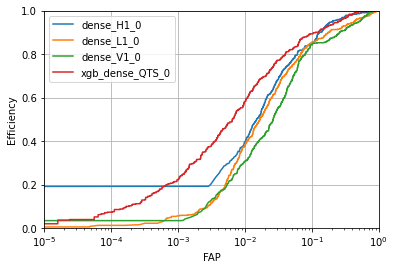

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8885
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

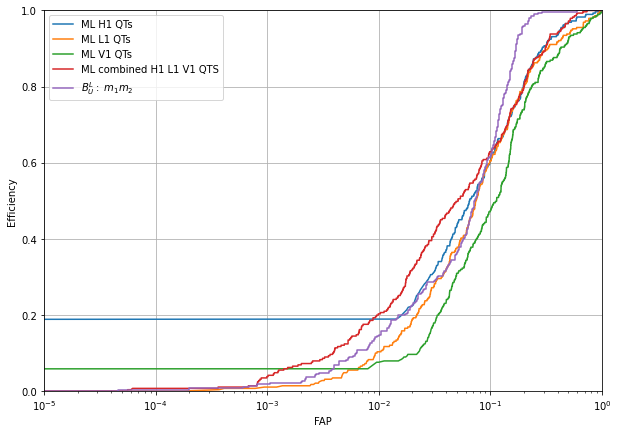

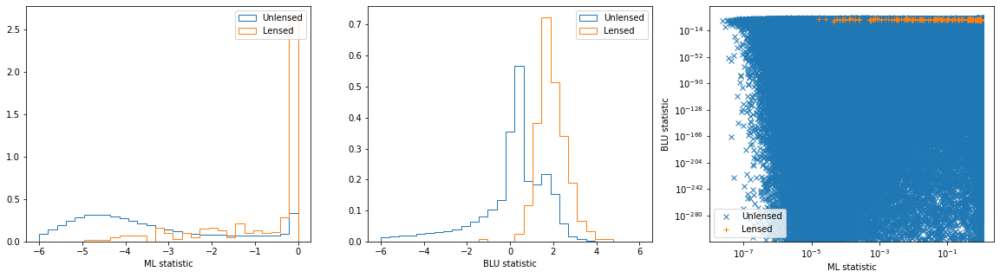

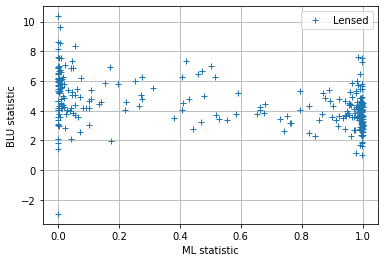

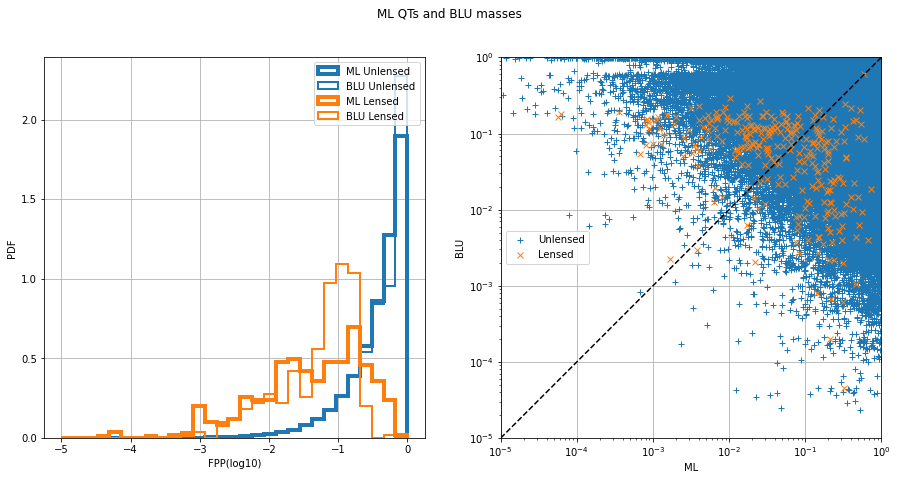

{'scale_pos_weight_xgbqts': 0.1, 'max_depth_xgbqts': 4, 'n_estimators_xgbqts': 150, 'test_xgb_dense_QTS_0_roc': 0.8885128603327889, 'val_xgb_dense_QTS_0_roc': 0.9593896777739409, 'test_xgb_dense_QTS_0_acc': 0.9231497228836111, 'val_xgb_dense_QTS_0_acc': 0.9845239331740718, 'test_xgb_dense_QTS_0_f1': 0.008569732324927078, 'val_xgb_dense_QTS_0_f1': 0.21863654699475593}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9591


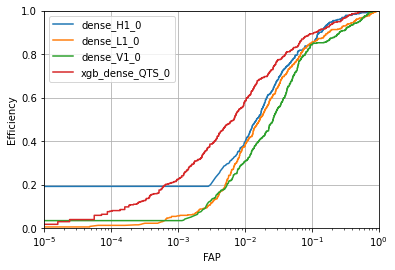

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8883
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

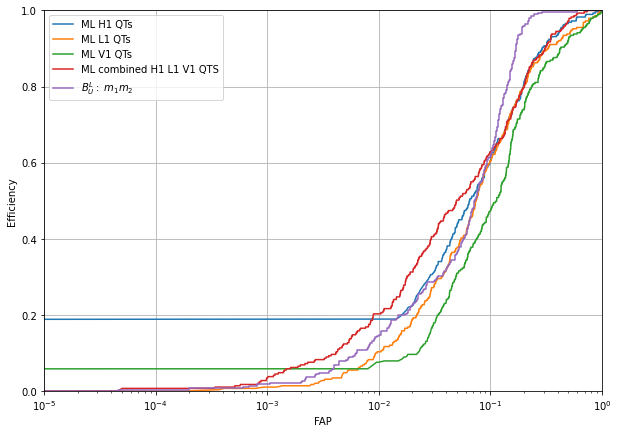

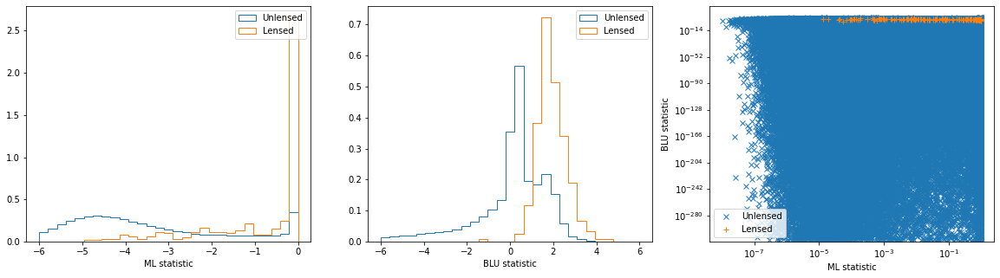

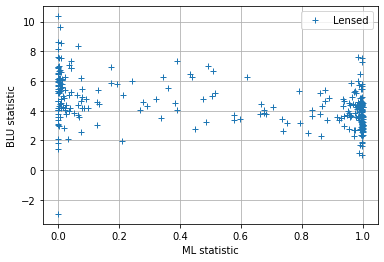

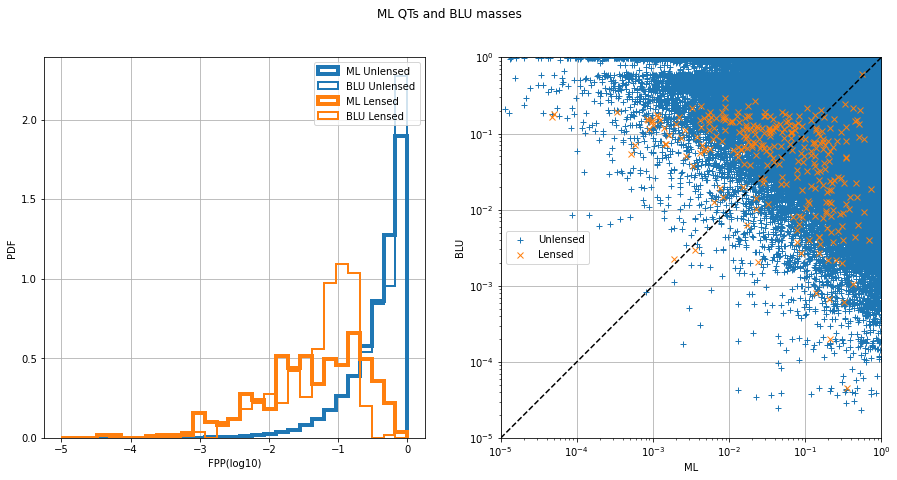

{'scale_pos_weight_xgbqts': 0.1, 'max_depth_xgbqts': 4, 'n_estimators_xgbqts': 165, 'test_xgb_dense_QTS_0_roc': 0.8882825505245603, 'val_xgb_dense_QTS_0_roc': 0.9591115756555669, 'test_xgb_dense_QTS_0_acc': 0.9209688068988975, 'val_xgb_dense_QTS_0_acc': 0.98386078730595, 'test_xgb_dense_QTS_0_f1': 0.008385007405919714, 'val_xgb_dense_QTS_0_f1': 0.2140077821011673}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9613


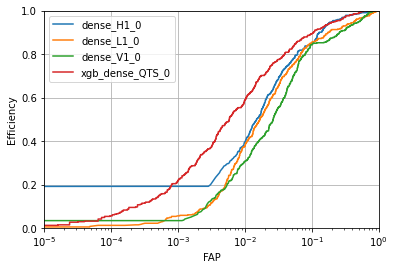

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8919
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

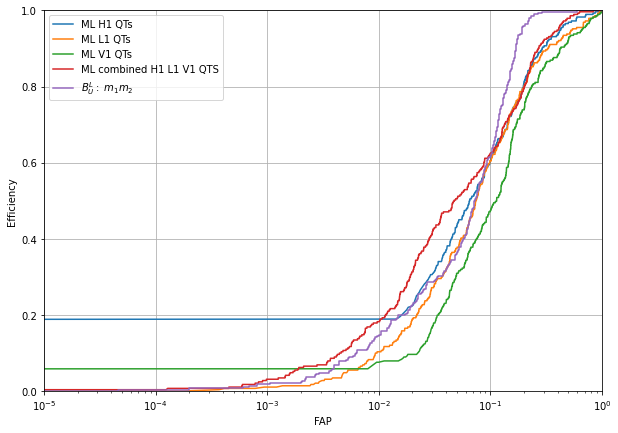

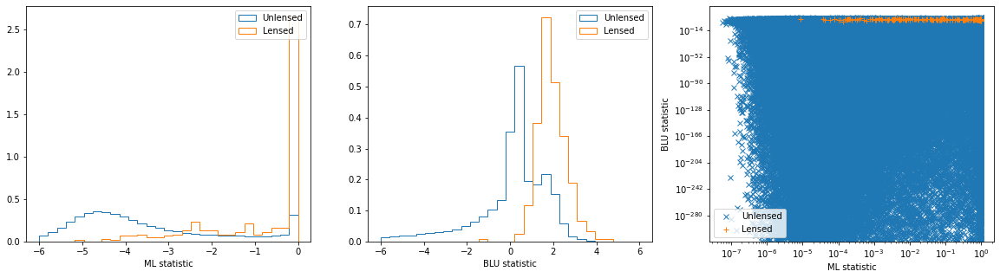

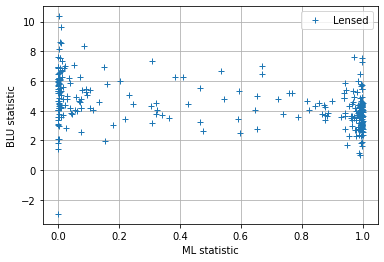

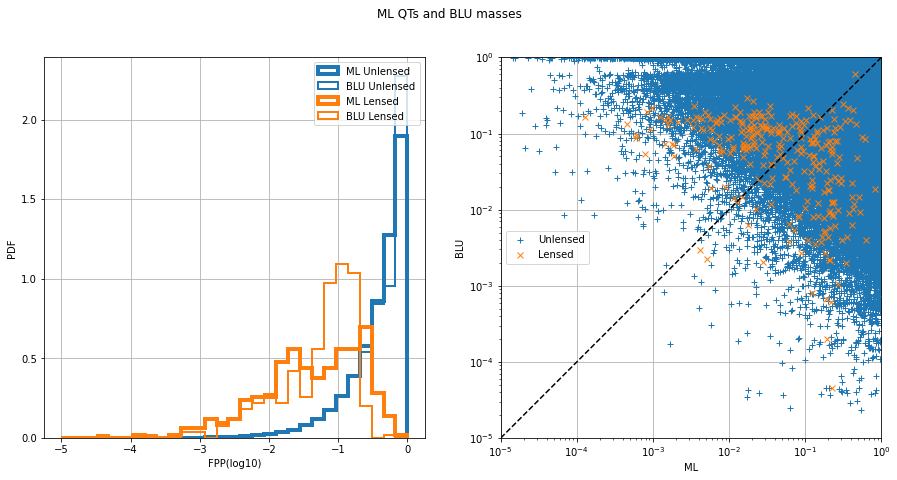

{'scale_pos_weight_xgbqts': 0.1, 'max_depth_xgbqts': 5, 'n_estimators_xgbqts': 105, 'test_xgb_dense_QTS_0_roc': 0.8919145746925017, 'val_xgb_dense_QTS_0_roc': 0.9613309934114693, 'test_xgb_dense_QTS_0_acc': 0.9262910422377398, 'val_xgb_dense_QTS_0_acc': 0.9855865645049177, 'test_xgb_dense_QTS_0_f1': 0.008825032959345655, 'val_xgb_dense_QTS_0_f1': 0.22641509433962262}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9607


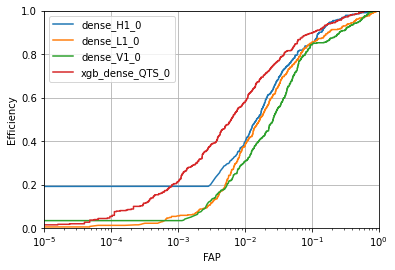

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8900
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

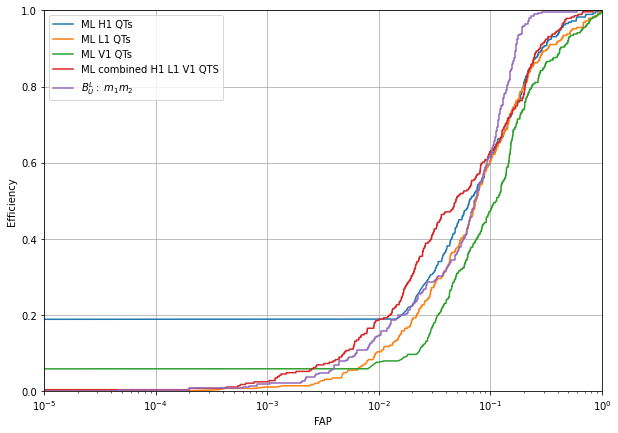

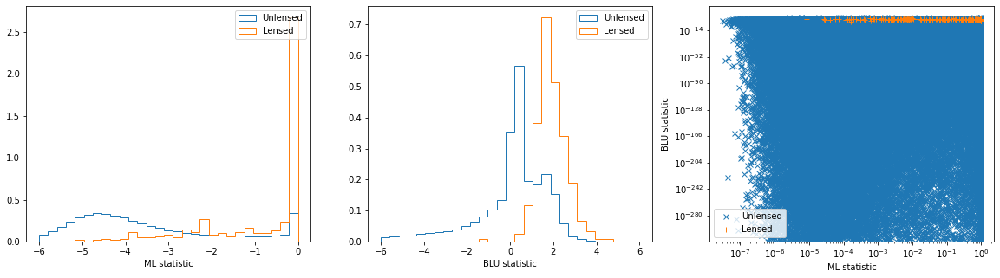

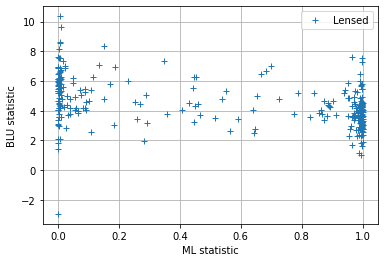

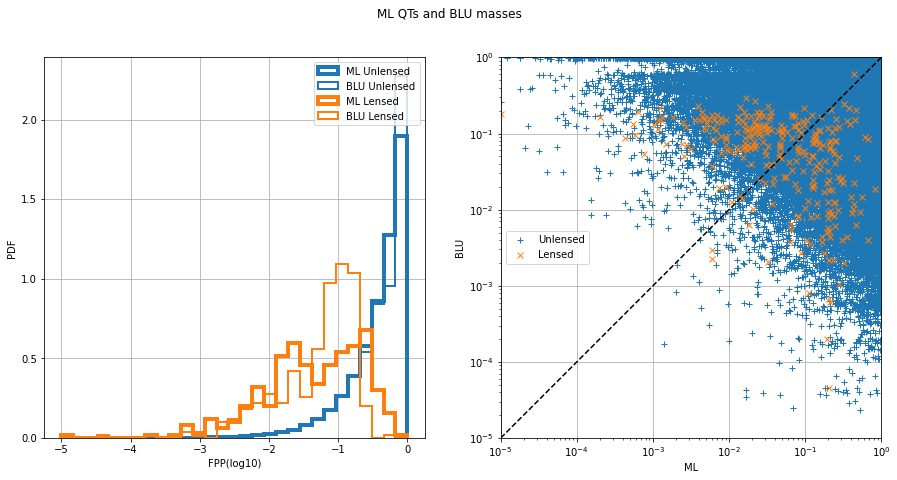

{'scale_pos_weight_xgbqts': 0.1, 'max_depth_xgbqts': 5, 'n_estimators_xgbqts': 120, 'test_xgb_dense_QTS_0_roc': 0.8899881770881503, 'val_xgb_dense_QTS_0_roc': 0.9606637020340728, 'test_xgb_dense_QTS_0_acc': 0.9222093279177255, 'val_xgb_dense_QTS_0_acc': 0.9845239331740718, 'test_xgb_dense_QTS_0_f1': 0.008467011807911045, 'val_xgb_dense_QTS_0_f1': 0.21863654699475593}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9599


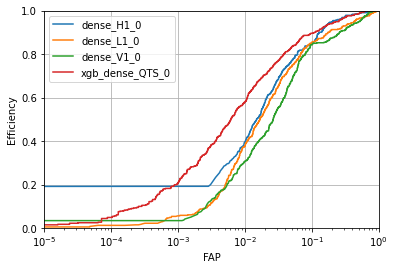

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8890
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

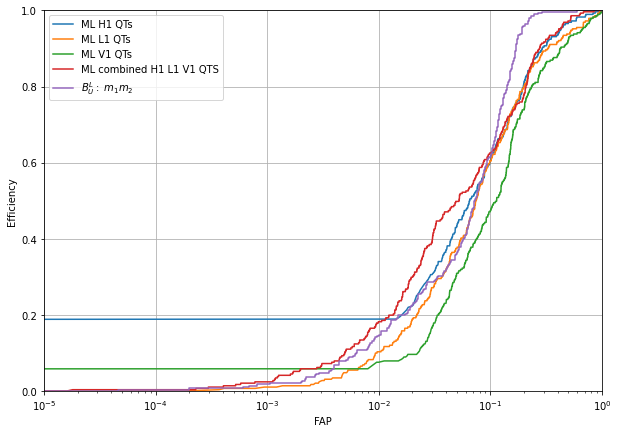

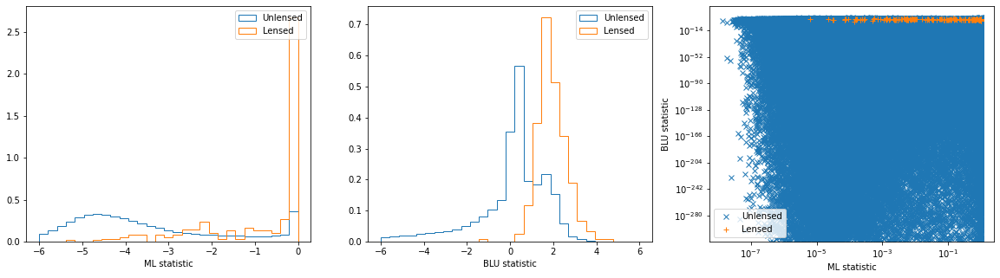

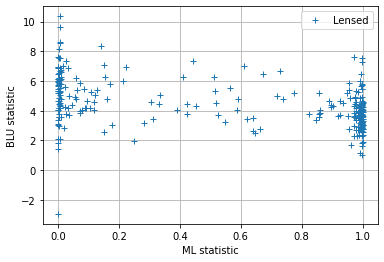

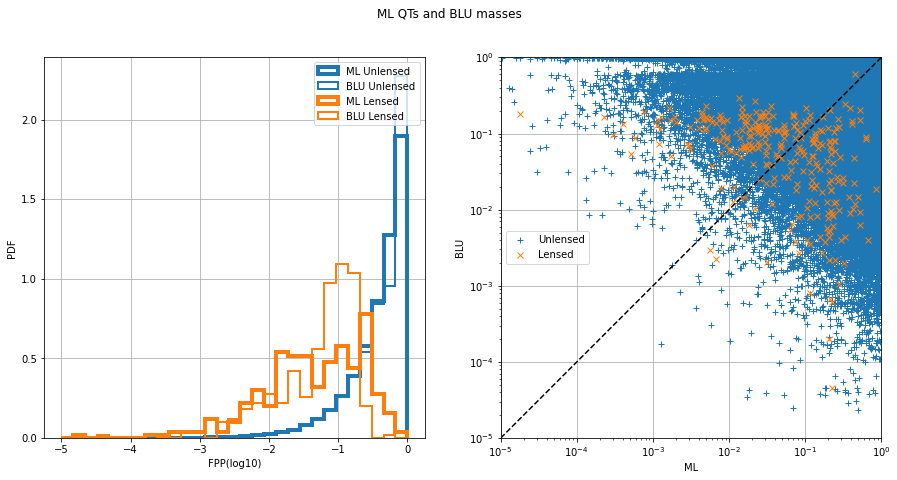

{'scale_pos_weight_xgbqts': 0.1, 'max_depth_xgbqts': 5, 'n_estimators_xgbqts': 135, 'test_xgb_dense_QTS_0_roc': 0.8889992789957668, 'val_xgb_dense_QTS_0_roc': 0.9598712272495599, 'test_xgb_dense_QTS_0_acc': 0.9195802236939514, 'val_xgb_dense_QTS_0_acc': 0.9838927461429678, 'test_xgb_dense_QTS_0_f1': 0.008437153077587271, 'val_xgb_dense_QTS_0_f1': 0.2149532710280374}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9593


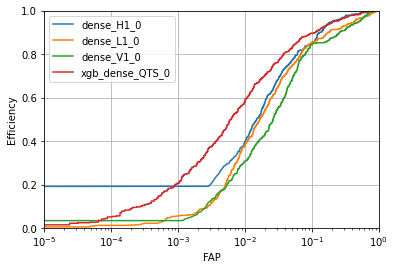

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8883
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

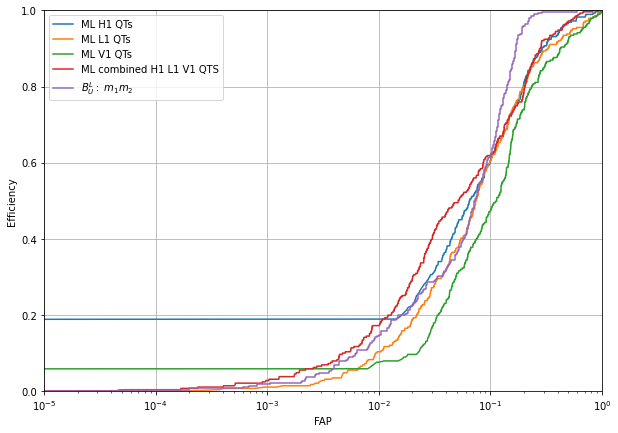

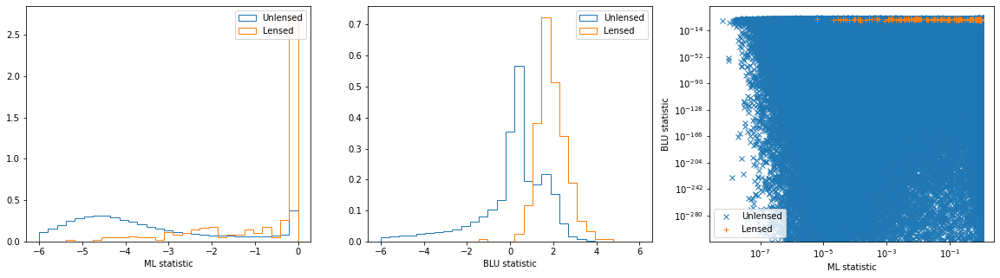

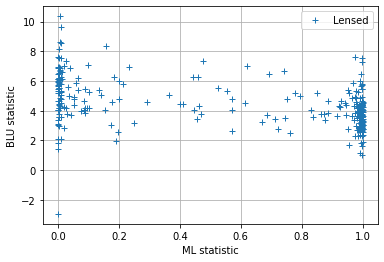

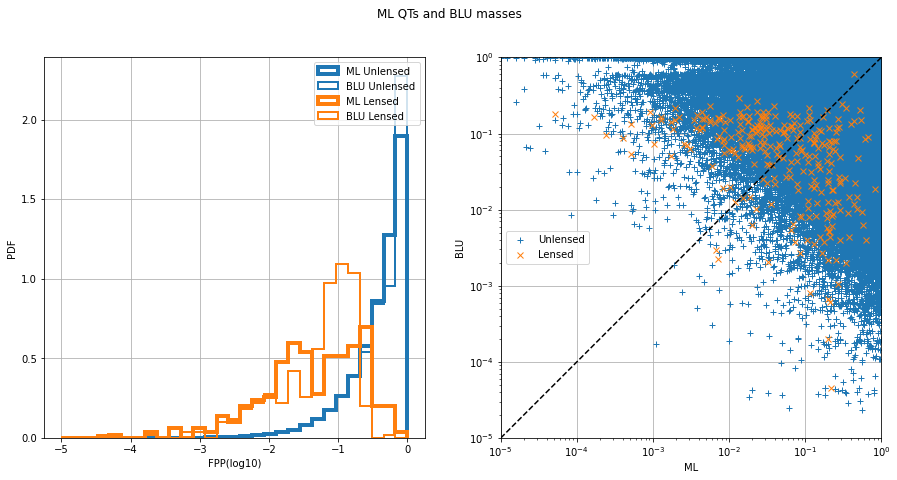

{'scale_pos_weight_xgbqts': 0.1, 'max_depth_xgbqts': 5, 'n_estimators_xgbqts': 150, 'test_xgb_dense_QTS_0_roc': 0.8882519838142424, 'val_xgb_dense_QTS_0_roc': 0.9593142933923942, 'test_xgb_dense_QTS_0_acc': 0.9168810900578243, 'val_xgb_dense_QTS_0_acc': 0.9832455796933549, 'test_xgb_dense_QTS_0_f1': 0.008118045938589372, 'val_xgb_dense_QTS_0_f1': 0.20838052095130236}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9597


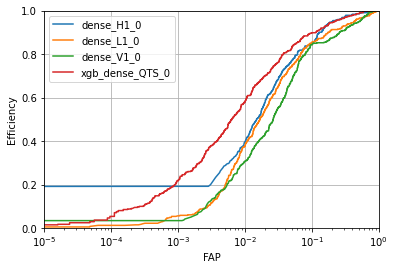

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8880
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

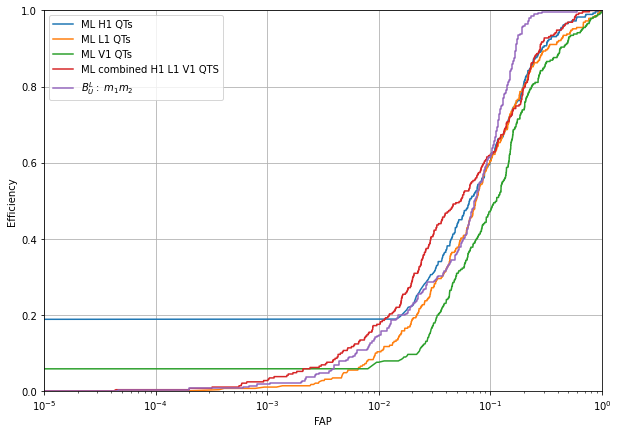

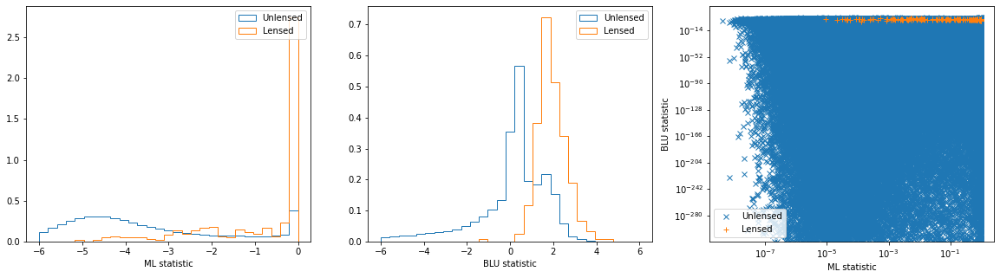

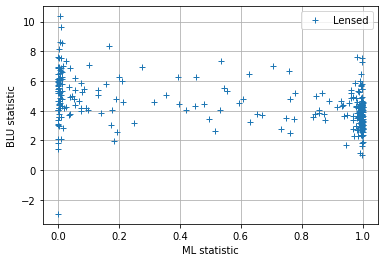

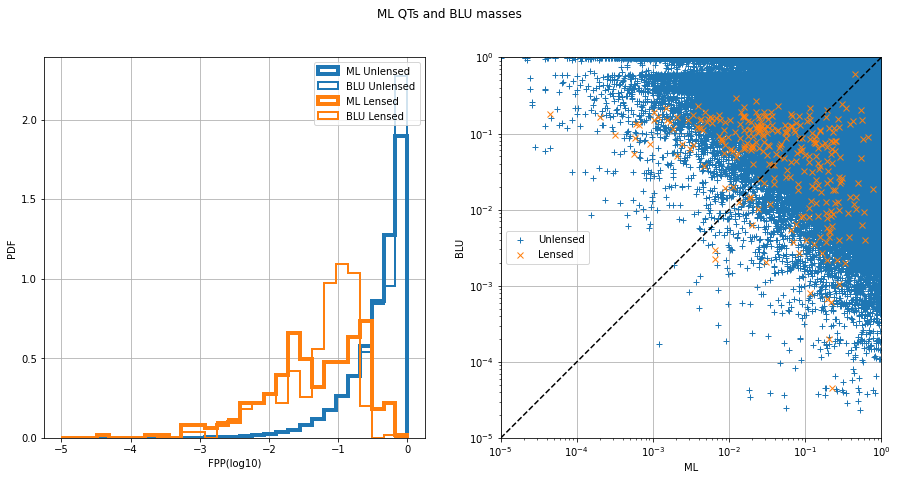

{'scale_pos_weight_xgbqts': 0.1, 'max_depth_xgbqts': 5, 'n_estimators_xgbqts': 165, 'test_xgb_dense_QTS_0_roc': 0.8880110035203727, 'val_xgb_dense_QTS_0_roc': 0.9596790549598351, 'test_xgb_dense_QTS_0_acc': 0.9150763320594649, 'val_xgb_dense_QTS_0_acc': 0.9827582074288317, 'test_xgb_dense_QTS_0_f1': 0.008039637281480789, 'val_xgb_dense_QTS_0_f1': 0.203690036900369}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9626


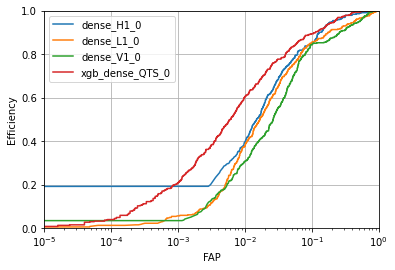

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8924
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

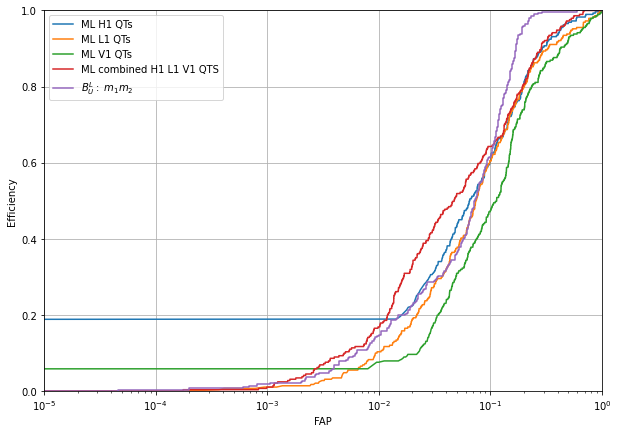

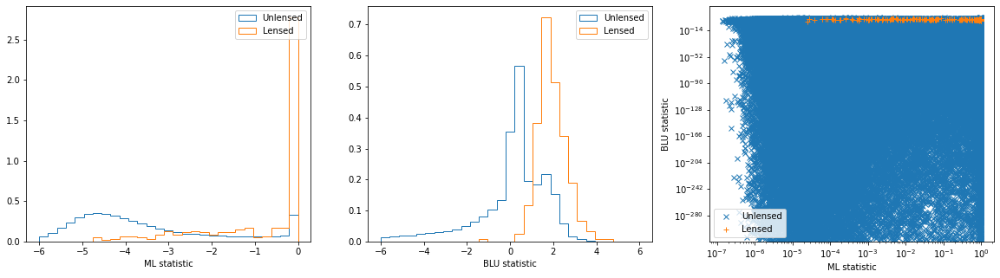

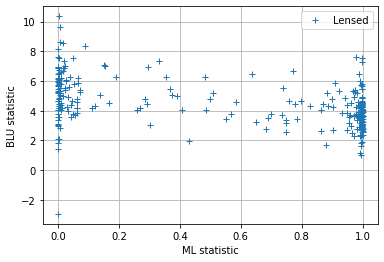

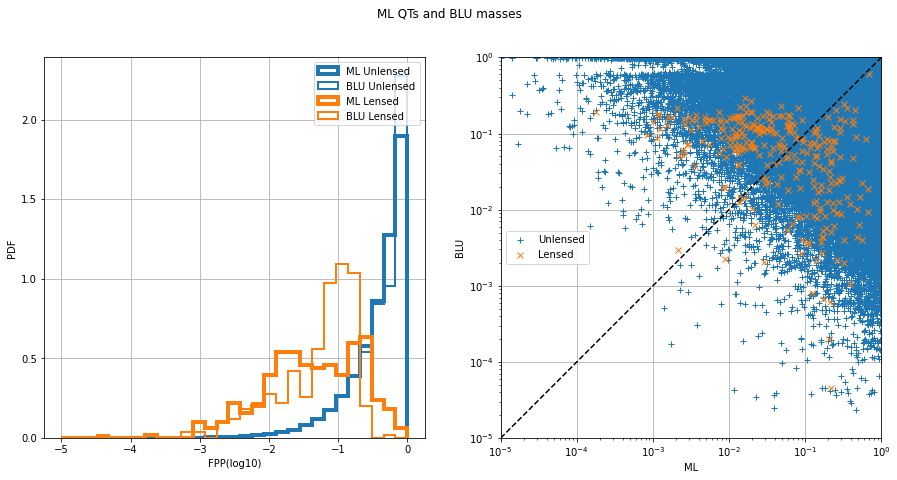

{'scale_pos_weight_xgbqts': 0.1, 'max_depth_xgbqts': 6, 'n_estimators_xgbqts': 105, 'test_xgb_dense_QTS_0_roc': 0.8923916093822919, 'val_xgb_dense_QTS_0_roc': 0.9625536329376572, 'test_xgb_dense_QTS_0_acc': 0.9239080413773785, 'val_xgb_dense_QTS_0_acc': 0.9845638817203441, 'test_xgb_dense_QTS_0_f1': 0.008912748879391225, 'val_xgb_dense_QTS_0_f1': 0.2190784155214228}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9621


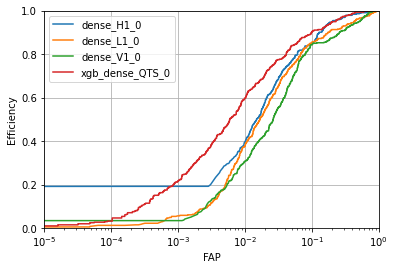

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8902
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

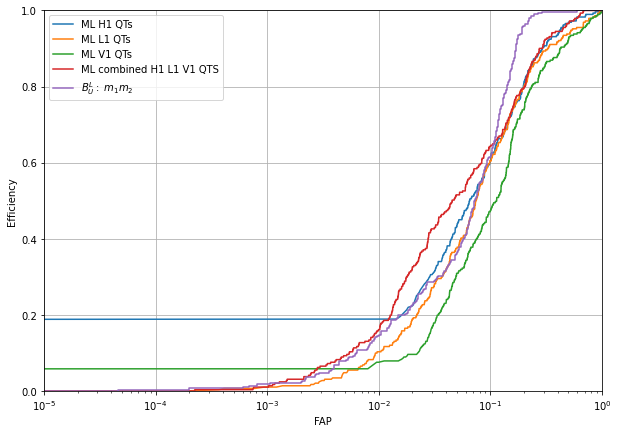

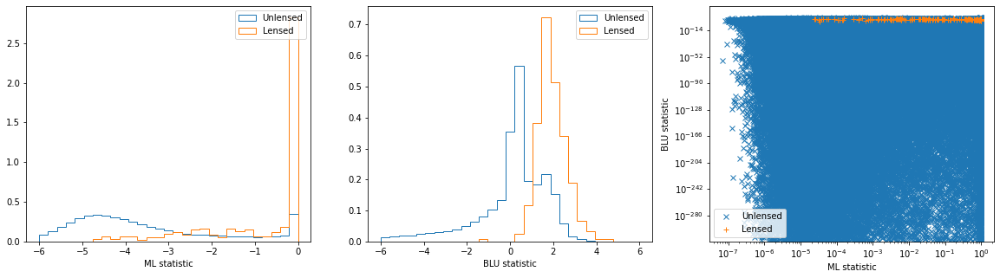

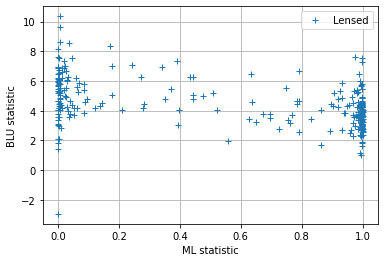

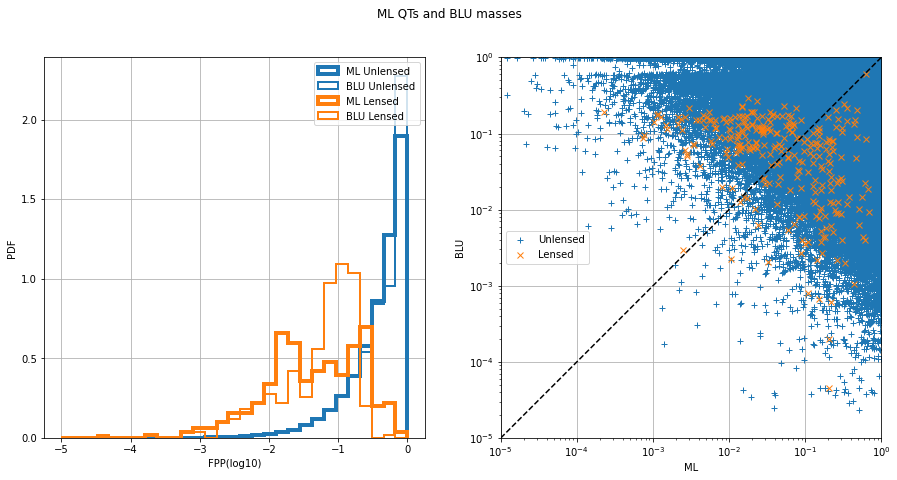

{'scale_pos_weight_xgbqts': 0.1, 'max_depth_xgbqts': 6, 'n_estimators_xgbqts': 120, 'test_xgb_dense_QTS_0_roc': 0.8902308841982003, 'val_xgb_dense_QTS_0_roc': 0.9621376131038115, 'test_xgb_dense_QTS_0_acc': 0.9202605094139539, 'val_xgb_dense_QTS_0_acc': 0.9838847564337134, 'test_xgb_dense_QTS_0_f1': 0.008607179283066743, 'val_xgb_dense_QTS_0_f1': 0.21364522417153997}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9609


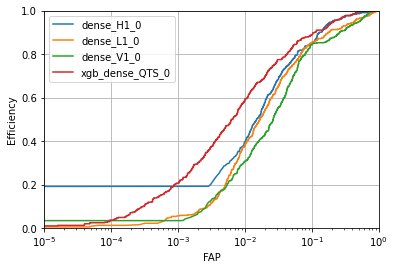

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8893
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

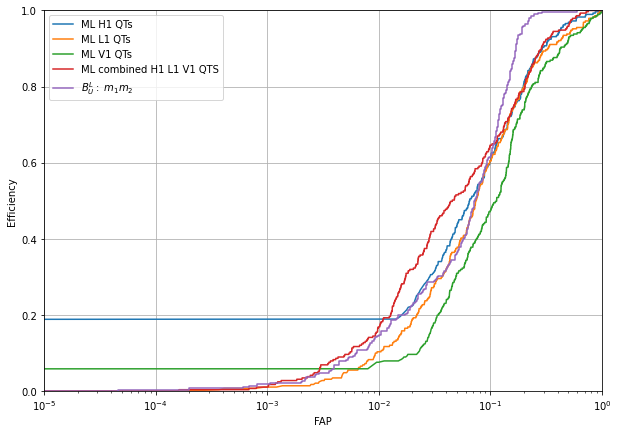

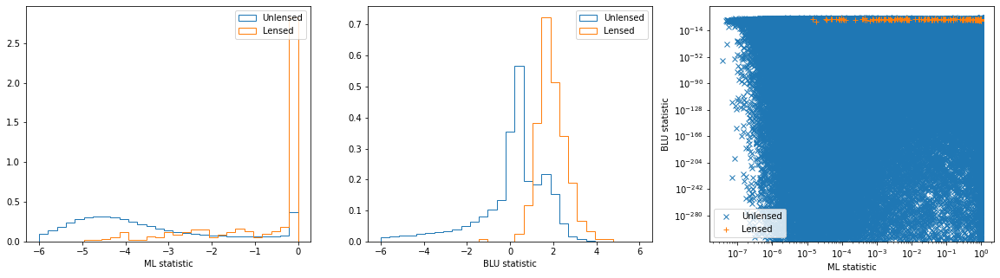

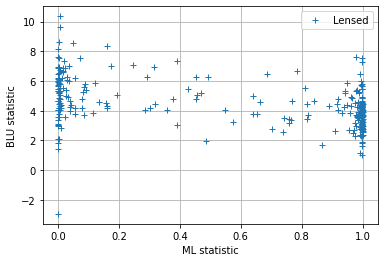

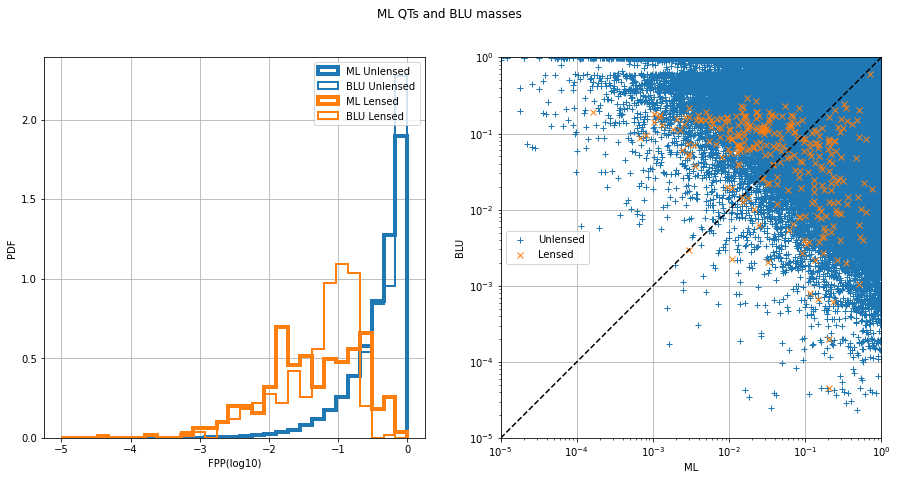

{'scale_pos_weight_xgbqts': 0.1, 'max_depth_xgbqts': 6, 'n_estimators_xgbqts': 135, 'test_xgb_dense_QTS_0_roc': 0.8893332459330435, 'val_xgb_dense_QTS_0_roc': 0.960857761608611, 'test_xgb_dense_QTS_0_acc': 0.9175853858620621, 'val_xgb_dense_QTS_0_acc': 0.982846094230631, 'test_xgb_dense_QTS_0_f1': 0.00828237106948524, 'val_xgb_dense_QTS_0_f1': 0.20452019266394963}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9609


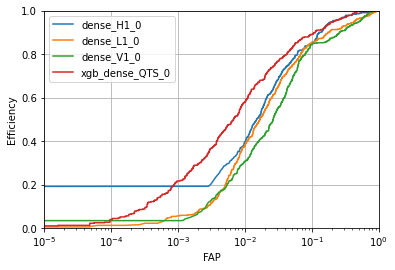

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8880
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

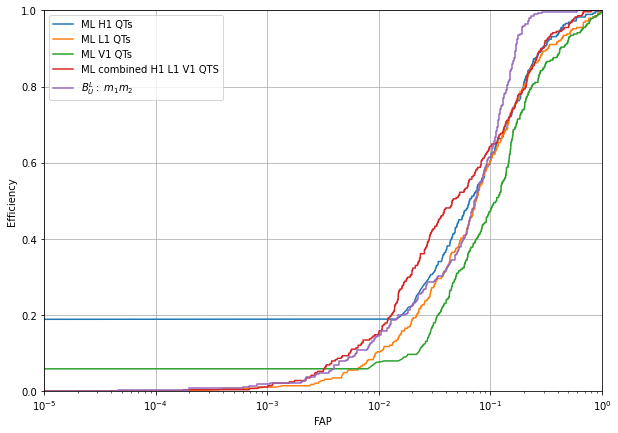

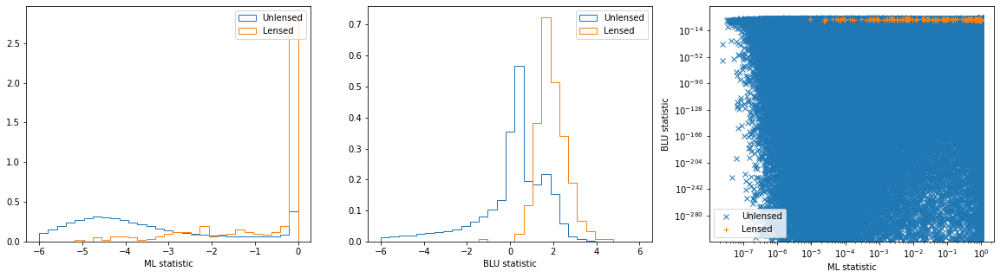

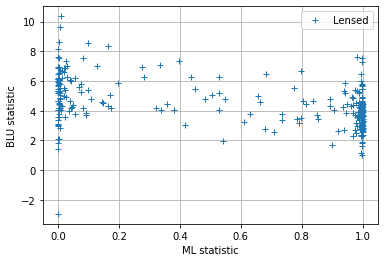

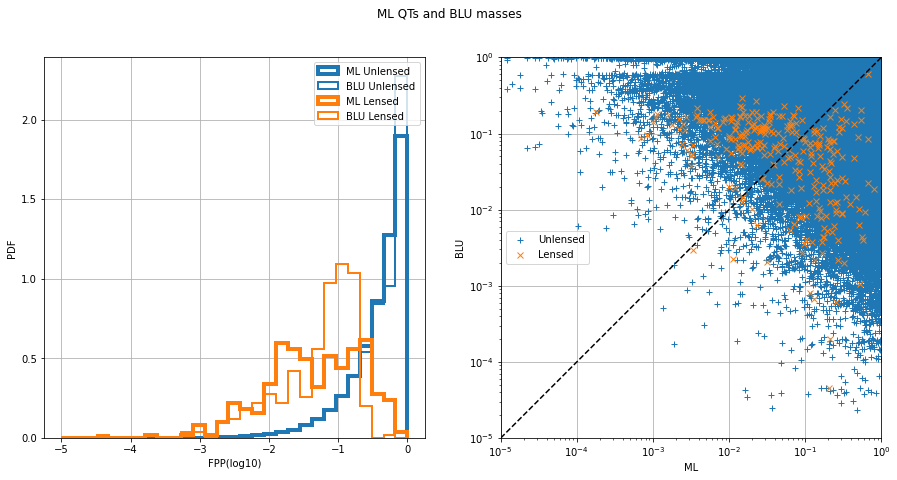

{'scale_pos_weight_xgbqts': 0.1, 'max_depth_xgbqts': 6, 'n_estimators_xgbqts': 150, 'test_xgb_dense_QTS_0_roc': 0.8879754971526143, 'val_xgb_dense_QTS_0_roc': 0.9609160339592971, 'test_xgb_dense_QTS_0_acc': 0.915462494247584, 'val_xgb_dense_QTS_0_acc': 0.9823107837105808, 'test_xgb_dense_QTS_0_f1': 0.008308883933810586, 'val_xgb_dense_QTS_0_f1': 0.20129870129870128}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9596


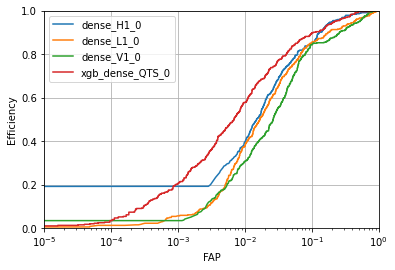

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8874
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

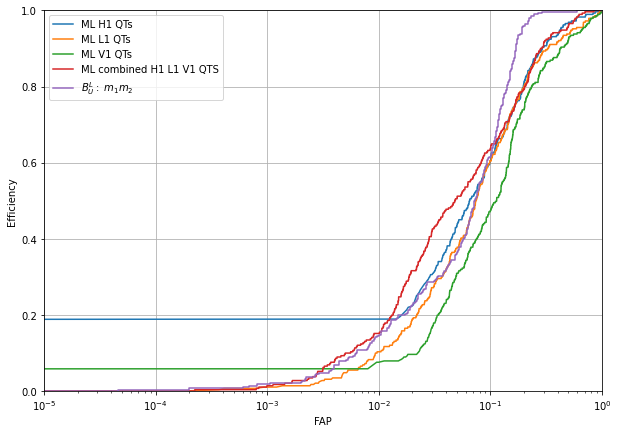

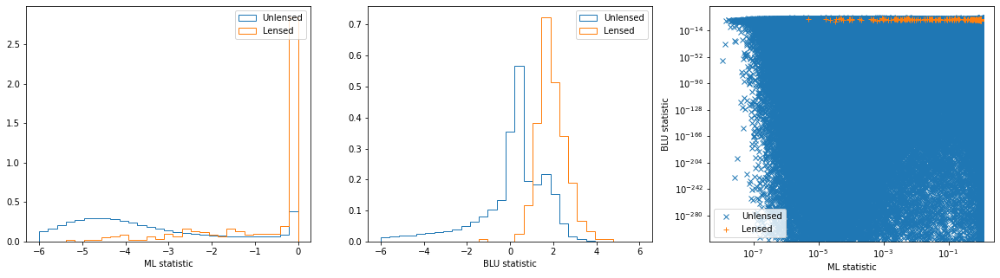

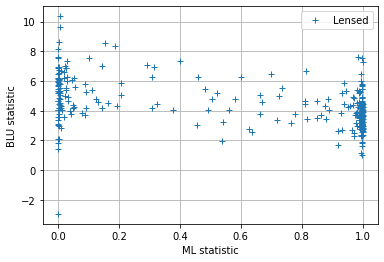

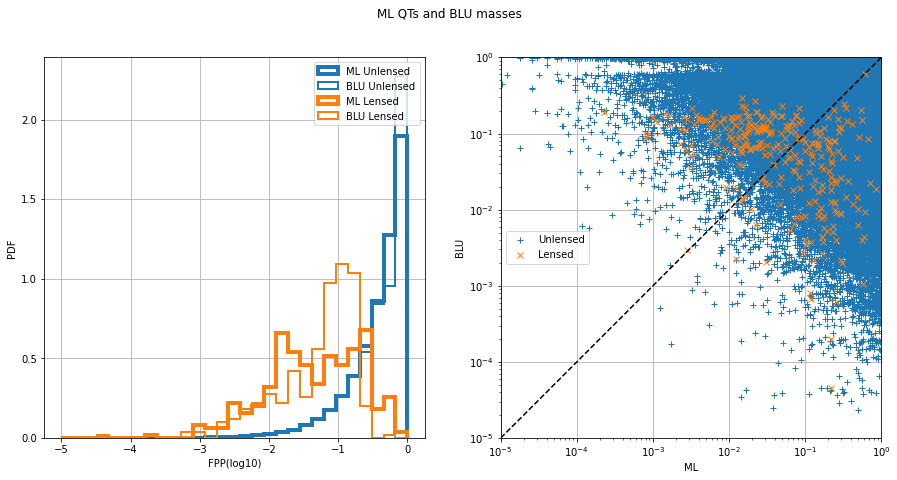

{'scale_pos_weight_xgbqts': 0.1, 'max_depth_xgbqts': 6, 'n_estimators_xgbqts': 165, 'test_xgb_dense_QTS_0_roc': 0.8873541425965862, 'val_xgb_dense_QTS_0_roc': 0.9596332737106985, 'test_xgb_dense_QTS_0_acc': 0.9143640328938154, 'val_xgb_dense_QTS_0_acc': 0.9819112982478567, 'test_xgb_dense_QTS_0_f1': 0.008249142645286867, 'val_xgb_dense_QTS_0_f1': 0.19830028328611898}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9604


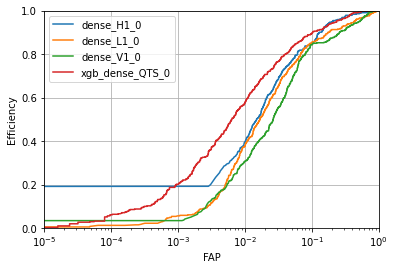

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8917
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

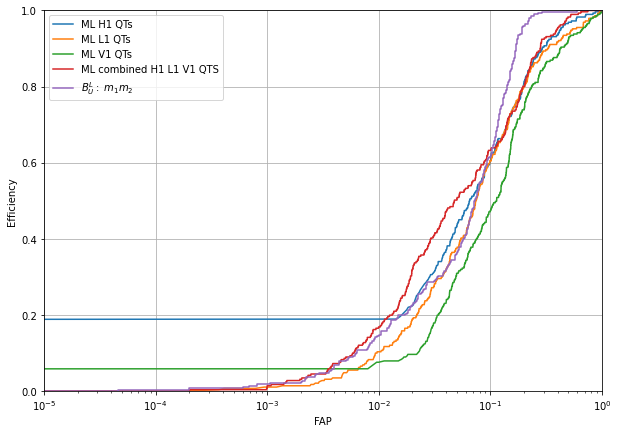

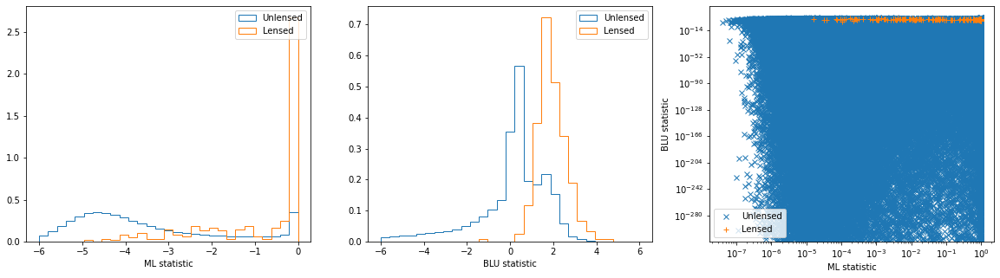

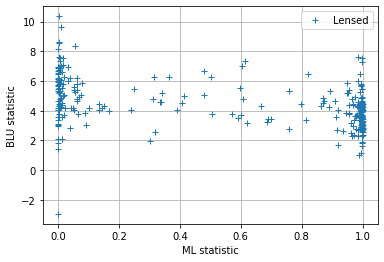

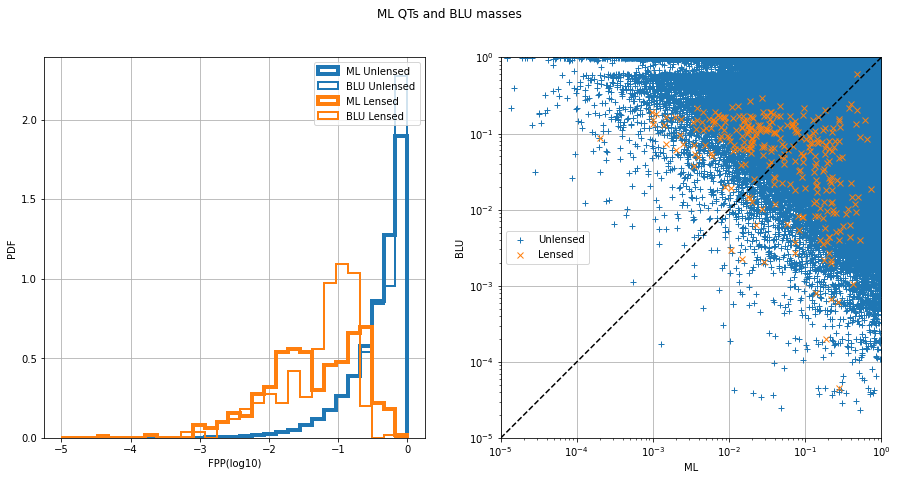

{'scale_pos_weight_xgbqts': 0.1, 'max_depth_xgbqts': 7, 'n_estimators_xgbqts': 105, 'test_xgb_dense_QTS_0_roc': 0.8917478440545192, 'val_xgb_dense_QTS_0_roc': 0.9604400198705798, 'test_xgb_dense_QTS_0_acc': 0.9190059825126553, 'val_xgb_dense_QTS_0_acc': 0.9838208387596775, 'test_xgb_dense_QTS_0_f1': 0.00837783548086816, 'val_xgb_dense_QTS_0_f1': 0.2105263157894737}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9601


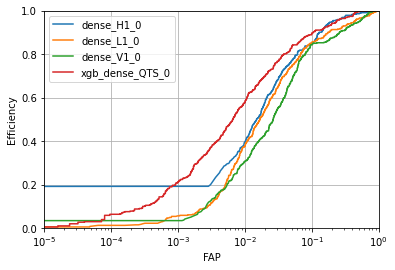

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8905
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

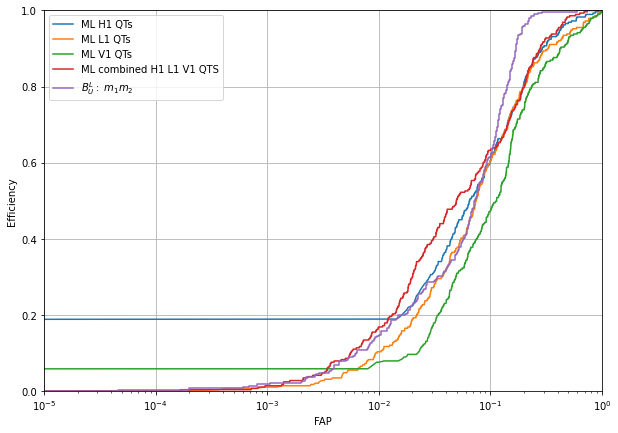

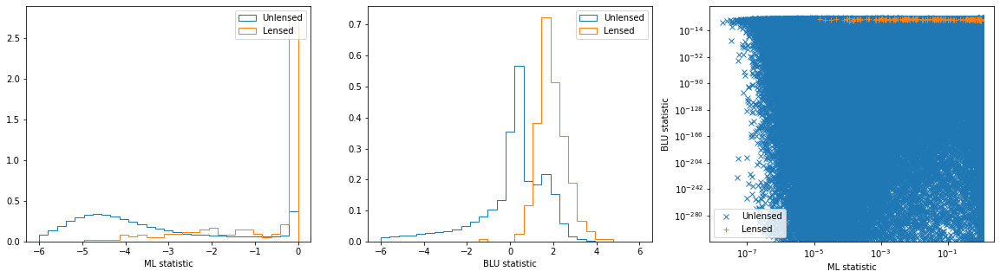

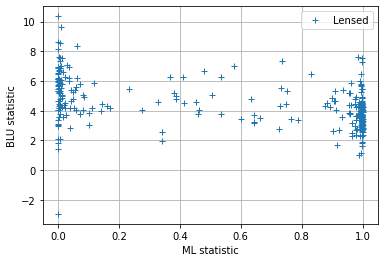

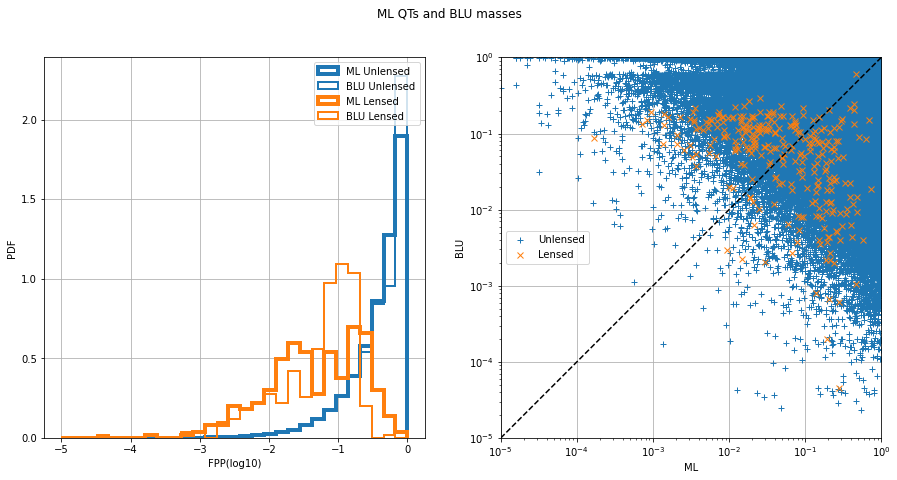

{'scale_pos_weight_xgbqts': 0.1, 'max_depth_xgbqts': 7, 'n_estimators_xgbqts': 120, 'test_xgb_dense_QTS_0_roc': 0.8905154545610716, 'val_xgb_dense_QTS_0_roc': 0.9601271197224219, 'test_xgb_dense_QTS_0_acc': 0.9169611236719423, 'val_xgb_dense_QTS_0_acc': 0.9835092400987528, 'test_xgb_dense_QTS_0_f1': 0.008173214797820476, 'val_xgb_dense_QTS_0_f1': 0.20798158096699923}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9599


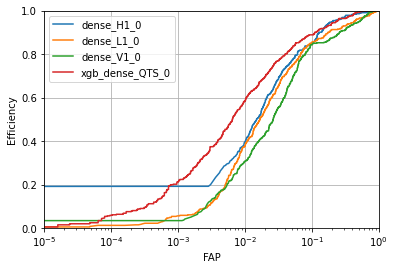

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8904
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

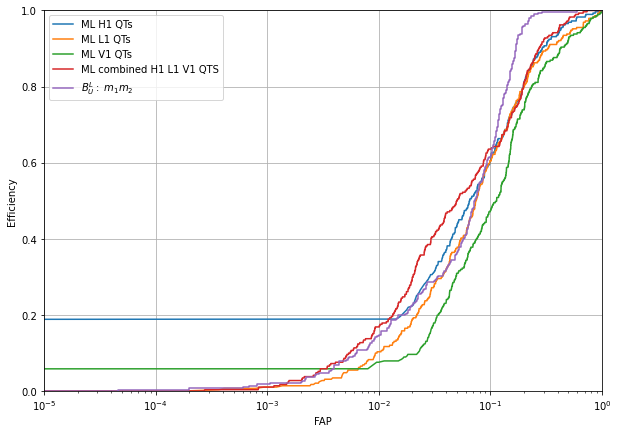

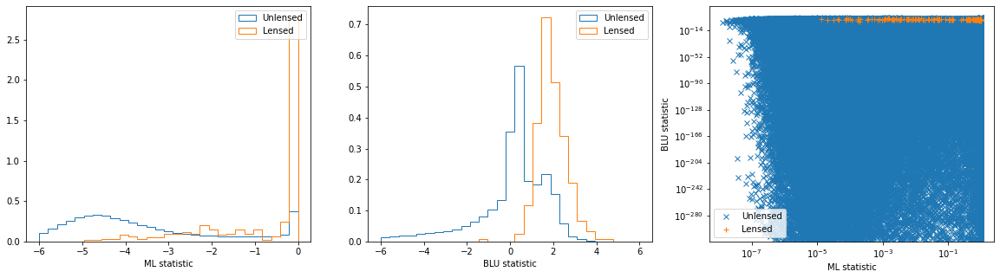

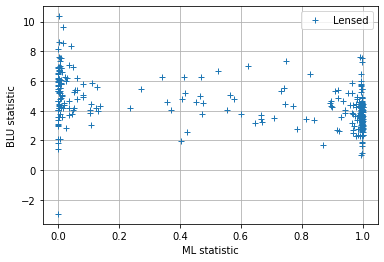

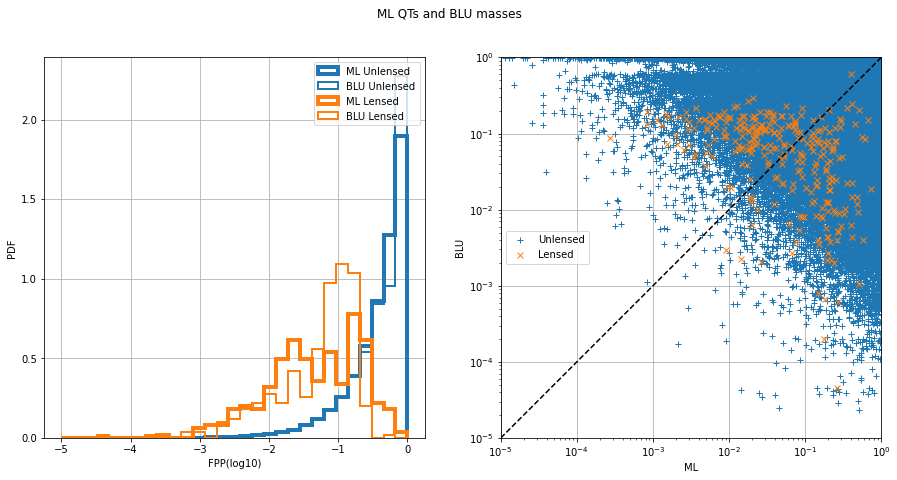

{'scale_pos_weight_xgbqts': 0.1, 'max_depth_xgbqts': 7, 'n_estimators_xgbqts': 135, 'test_xgb_dense_QTS_0_roc': 0.8903680009706495, 'val_xgb_dense_QTS_0_roc': 0.959921590514919, 'test_xgb_dense_QTS_0_acc': 0.9154484883651134, 'val_xgb_dense_QTS_0_acc': 0.983045836961993, 'test_xgb_dense_QTS_0_f1': 0.008074738275198346, 'val_xgb_dense_QTS_0_f1': 0.20285499624342598}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9595


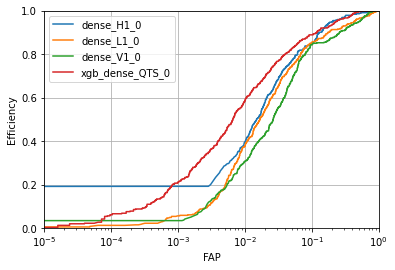

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8897
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

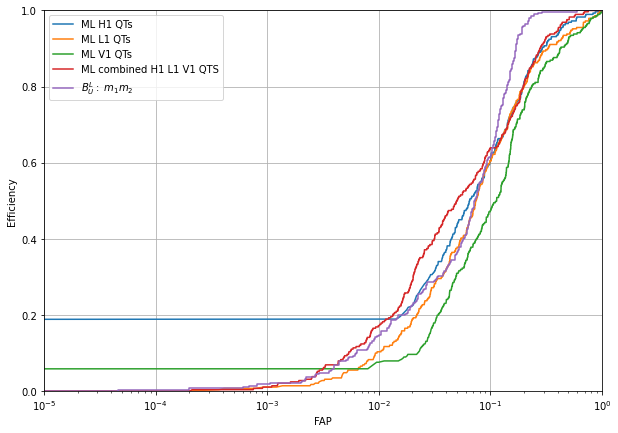

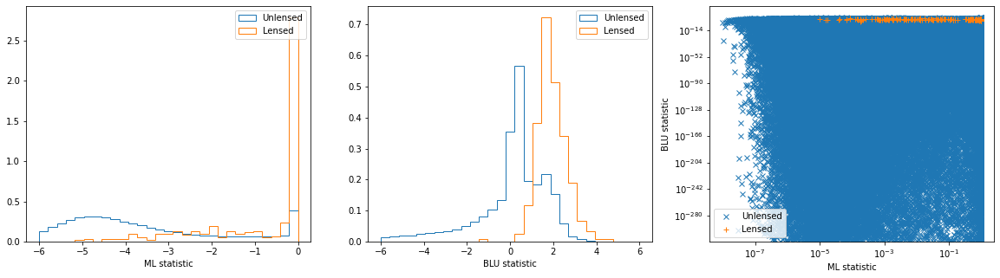

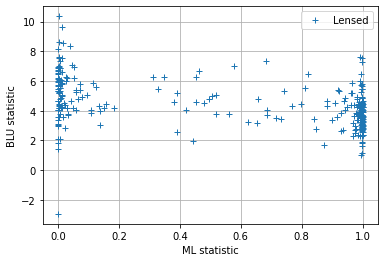

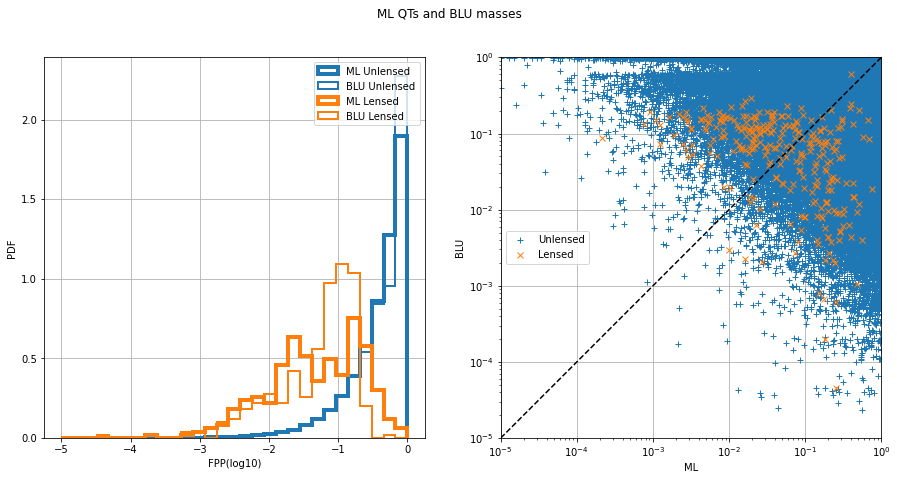

{'scale_pos_weight_xgbqts': 0.1, 'max_depth_xgbqts': 7, 'n_estimators_xgbqts': 150, 'test_xgb_dense_QTS_0_roc': 0.88966316070008, 'val_xgb_dense_QTS_0_roc': 0.9595191610773851, 'test_xgb_dense_QTS_0_acc': 0.9142079673462854, 'val_xgb_dense_QTS_0_acc': 0.9825265058604518, 'test_xgb_dense_QTS_0_f1': 0.008004812141402922, 'val_xgb_dense_QTS_0_f1': 0.19978046103183317}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9581


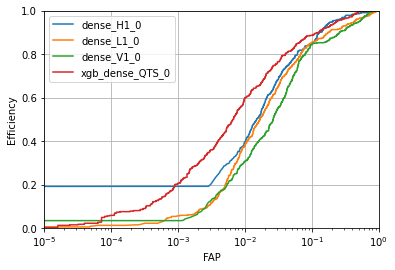

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8885
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

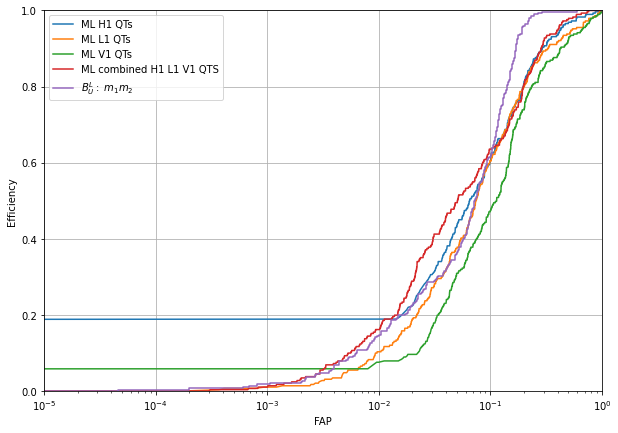

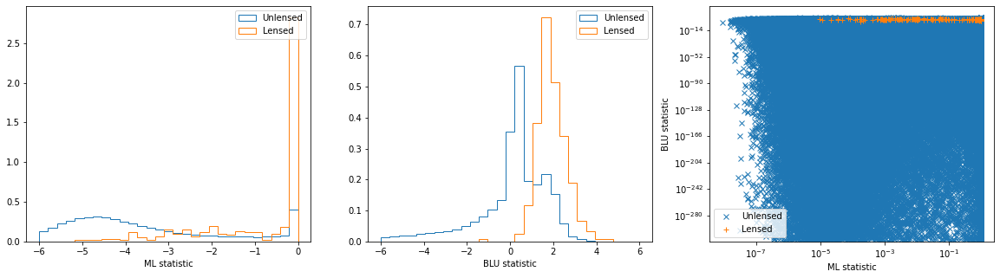

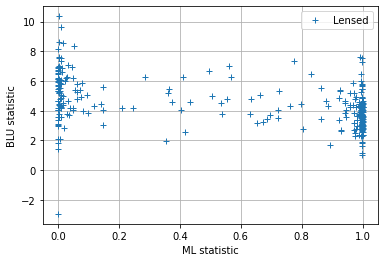

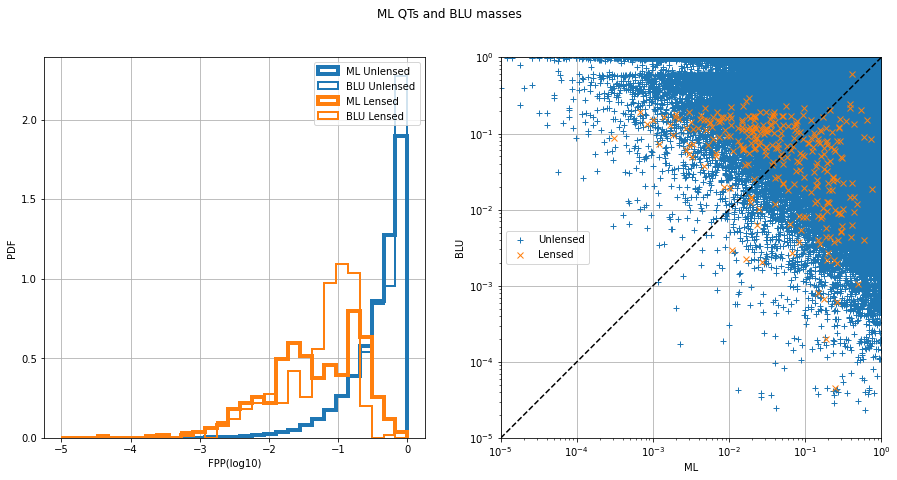

{'scale_pos_weight_xgbqts': 0.1, 'max_depth_xgbqts': 7, 'n_estimators_xgbqts': 165, 'test_xgb_dense_QTS_0_roc': 0.8884840341981428, 'val_xgb_dense_QTS_0_roc': 0.9580878890248512, 'test_xgb_dense_QTS_0_acc': 0.9125372656515737, 'val_xgb_dense_QTS_0_acc': 0.981999185049656, 'test_xgb_dense_QTS_0_f1': 0.007988199251106321, 'val_xgb_dense_QTS_0_f1': 0.1944941008223096}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9608


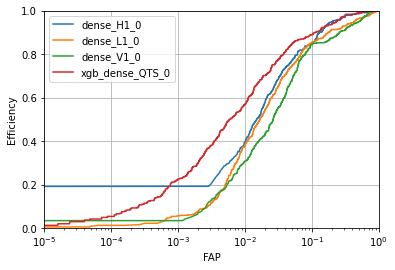

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8888
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

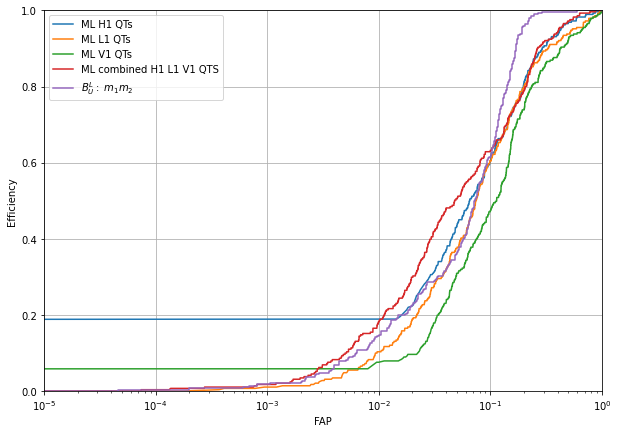

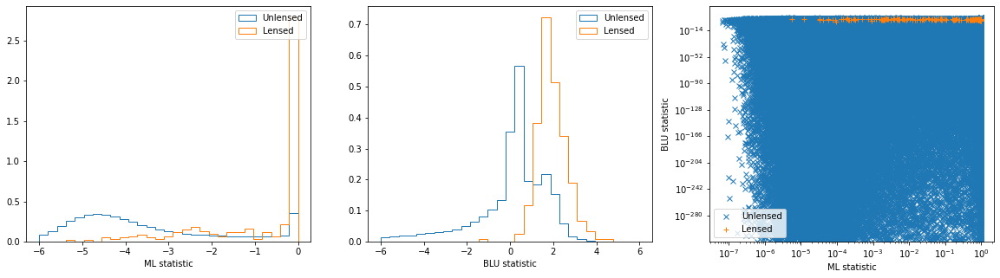

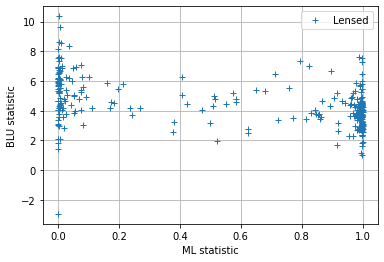

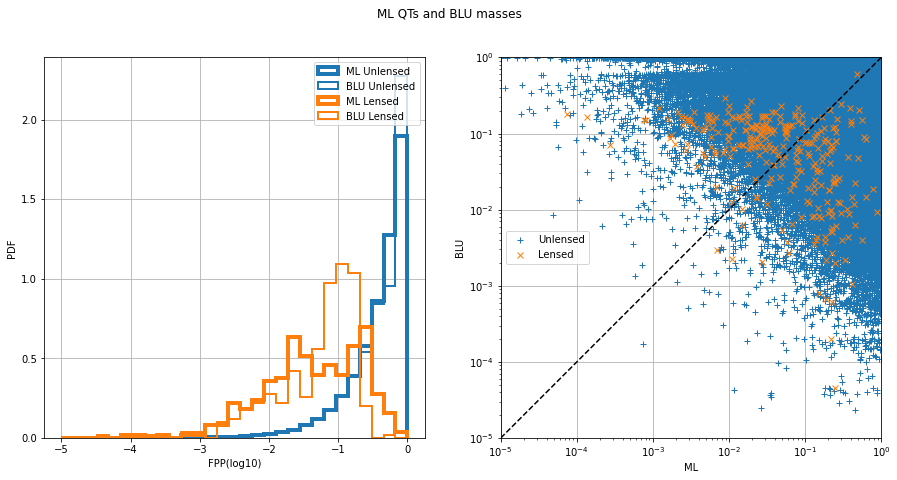

{'scale_pos_weight_xgbqts': 0.1, 'max_depth_xgbqts': 8, 'n_estimators_xgbqts': 105, 'test_xgb_dense_QTS_0_roc': 0.88879140059852, 'val_xgb_dense_QTS_0_roc': 0.9607736801516863, 'test_xgb_dense_QTS_0_acc': 0.9184557514155945, 'val_xgb_dense_QTS_0_acc': 0.9833015076581363, 'test_xgb_dense_QTS_0_f1': 0.008563018464008563, 'val_xgb_dense_QTS_0_f1': 0.20773313115996964}
dense_H1_0 auc = 0.9498
dense_L1_0 auc = 0.9276
dense_V1_0 auc = 0.9160
xgb_dense_QTS_0 auc = 0.9594


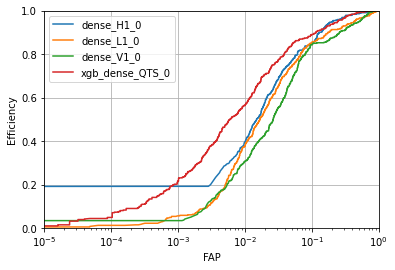

ML H1 QTs auc = 0.8789
ML L1 QTs auc = 0.8621
ML V1 QTs auc = 0.8296
ML combined H1 L1 V1 QTS auc = 0.8884
$B^L_U:$ $m_1 m_2$ auc = 0.9164


<Figure size 432x288 with 0 Axes>

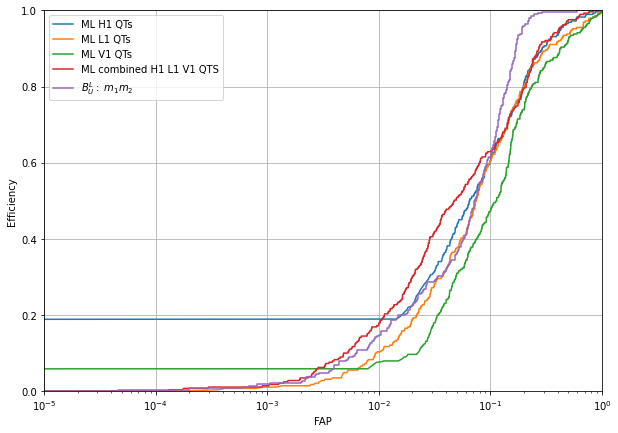

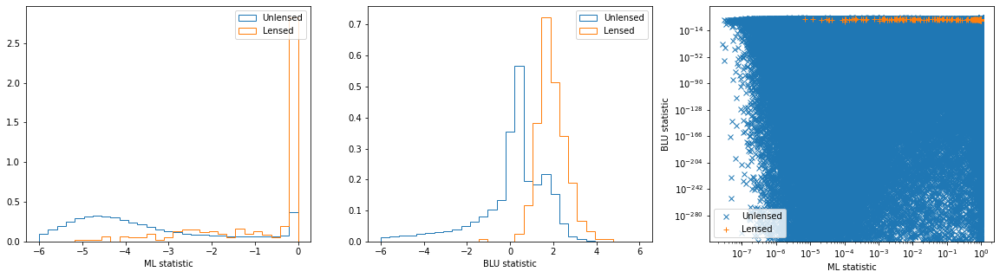

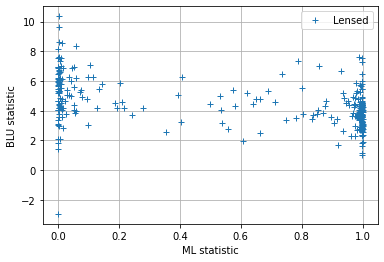

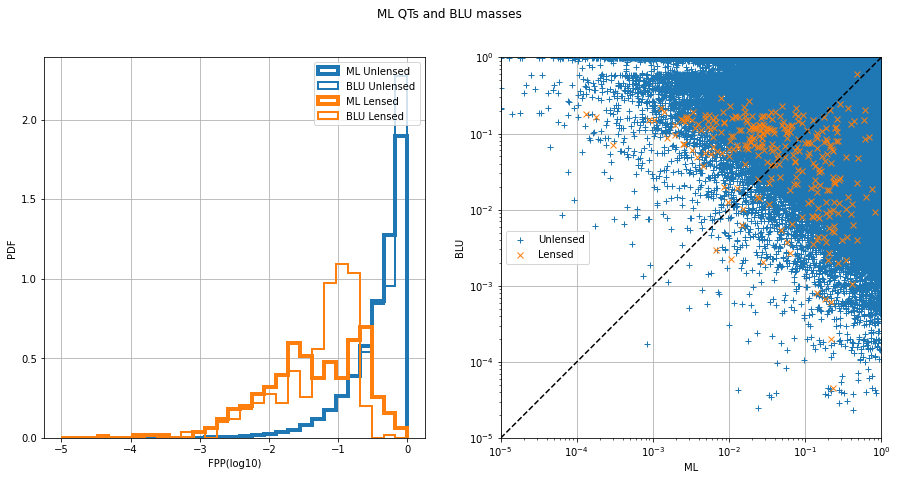

{'scale_pos_weight_xgbqts': 0.1, 'max_depth_xgbqts': 8, 'n_estimators_xgbqts': 120, 'test_xgb_dense_QTS_0_roc': 0.8883868268307249, 'val_xgb_dense_QTS_0_roc': 0.9594309451047607, 'test_xgb_dense_QTS_0_acc': 0.9161027631605274, 'val_xgb_dense_QTS_0_acc': 0.9824705778956704, 'test_xgb_dense_QTS_0_f1': 0.008418662946059073, 'val_xgb_dense_QTS_0_f1': 0.20043731778425655}


In [ ]:
scale_pos_weight_xgbqts_arr =[ 0.01,0.1,1,10,100]
max_depth_xgbqts_arr =[ 4,5,6,7,8]
n_estimators_xgbqts_arr = [105,120,135,150,165]
include_phenom = 1
include_power = 1
cols = ['xgb_dense_QTS_0_roc', 'xgb_dense_QTS_0_acc', 'xgb_dense_QTS_0_f1']
res=pd.DataFrame(columns=['scale_pos_weight_xgbqts', 'max_depth_xgbqts', 'n_estimators_xgbqts', 'val_xgb_dense_QTS_0_roc', 'test_xgb_dense_QTS_0_acc', 'val_xgb_dense_QTS_0_acc', 'test_xgb_dense_QTS_0_f1', 'val_xgb_dense_QTS_0_f1'])
for scale_pos_weight_xgbqts in scale_pos_weight_xgbqts_arr:
    for max_depth_xgbqts in max_depth_xgbqts_arr:
        for n_estimators_xgbqts in n_estimators_xgbqts_arr:
            df_test_scores,df_val_scores=train_test_xgbqts(base_out_dir,df_dir_train_features_in, df_dir_test_features_in, tag_qts,train_size_lensed_xgbqts, cv_size_lensed_xgbqts, scale_pos_weight_xgbqts, max_depth_xgbqts, n_estimators_xgbqts, cv_splits, compare_to_blu, path_to_blu,include_phenom,include_power)
            res_dict={'scale_pos_weight_xgbqts':scale_pos_weight_xgbqts,'max_depth_xgbqts':max_depth_xgbqts, 'n_estimators_xgbqts':n_estimators_xgbqts}
            for col in cols:
                res_dict['test_'+col]= df_test_scores[col]
                res_dict['val_'+col]= df_val_scores[col]
            print(res_dict)
            res=res.append(res_dict,ignore_index=True)

In [7]:
res['test_xgb_dense_QTS_0_roc'].max()

0.8946078678739877

In [4]:
res['test_xgb_dense_QTS_0_roc'].idxmax()

0

In [5]:
res.iloc[0]

scale_pos_weight_xgbqts       0.010000
max_depth_xgbqts              4.000000
n_estimators_xgbqts         105.000000
val_xgb_dense_QTS_0_roc       0.959328
test_xgb_dense_QTS_0_acc      0.973177
val_xgb_dense_QTS_0_acc       0.995046
test_xgb_dense_QTS_0_f1       0.016434
val_xgb_dense_QTS_0_f1        0.359504
test_xgb_dense_QTS_0_roc      0.894608
Name: 0, dtype: float64

In [ ]:
res.to_csv('optimise_xgbqts_include_power.csv')

In [8]:
#res = pd.read_csv('optimise_xgbqts_include_power.csv',index_col=0)